ООО "Фабрика оценки"

# Количественный межрегиональный анализ российского рынка жилой недвижимости в многоквартирных домах по состоянию на 2023-09-30 на основе данных Sberindex (сервис ПАО "Сбербанк") 

Вариант 1: Санкт-Петербург и Ленинградская область, Москва и Московская область рассматриваются как четыре отдельных региона

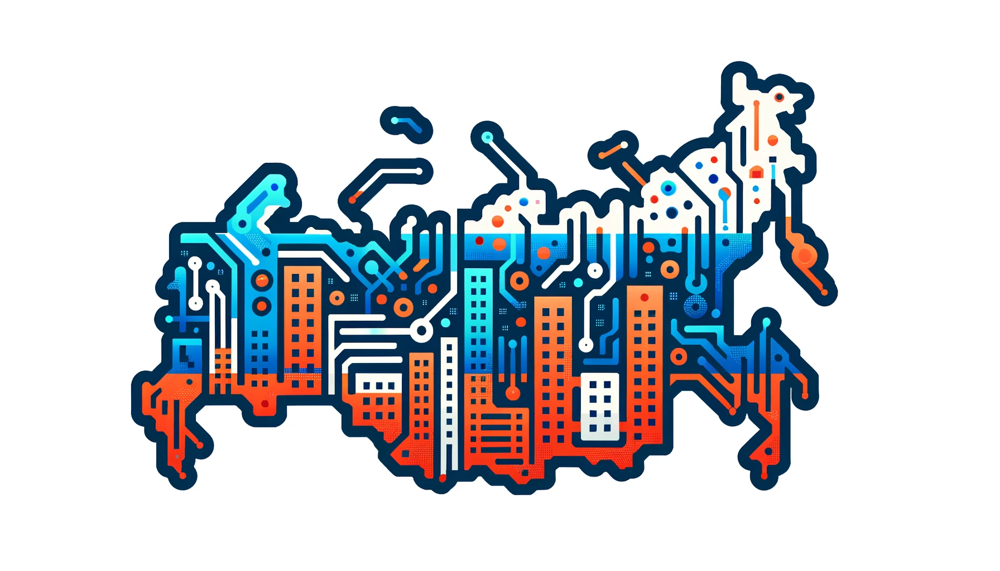

Анализ, приведённый в данном исследовании, полностью основан на данных, предоставляемых [Sberindex](https://sberindex.ru/en) и размещаемых им в [открытом доступе](https://sberindex.ru/en/dashboards?partition=7). Автор данного исследования, равно как и правообладатель модели машинного обучения [Syväjärvi](https://www.facebook.com/groups/1977067932456703)© ([Сювяярви](https://t.me/AIinValuation)) ([Sovconsult DDO](https://sovconsult.tech)), используемой в данной работе, а также провайдер облачной инфраструктуры данной модели (Meleksa Research AB) не имеют никакого отношения к Sberindex или ПАО "Сбербанк", равно как и Sberindex и ПАО "Сбербанк" не имеют отношения к данному исследованию и не несут какую-либо ответственность за его результаты и сделанные на его основе выводы.

Данное исследование распространяется на условиях лицензии [CC BY-SA 4.0 license](https://creativecommons.org/licenses/by-sa/4.0/).
Все данные, модели, выводы и результаты предоставляются "как есть" и служат только для информационных целей.
Автор исследования, равно как и разработчик модели Syväjärvi© или провайдер её инфраструктуры не несут никакую ответственность за последствия использования данного исследования и не дают никакую гарантию за точность и правильность его содержания.
Любой частный либо корпоративный пользователь принимает на себя все риски использования данного исследования.

Данное исследование, равно как и все продукты, созданные с помощью модели Syväjärvi©, основано на следующих принципах:
1. согласие со справедливостью [Гипотезы Эффективного Рынка](https://en.wikipedia.org/wiki/Efficient-market_hypothesis);
1. [принцип KISS](https://en.wikipedia.org/wiki/KISS_principle);
1. соответствие требованиям параграфа 3 [МСФО 13 Оценка справедливой стоимости](https://www.ifrs.org/issued-standards/list-of-standards/ifrs-13-fair-value-measurement/#about).

Данное исследование существует в двух вариантах. В данном варианте Санкт-Петербург, Ленинградская область, Москва и Московская область рассматриваются как четыре отдельных региона. Во втором варианте Санкт-Петербург и Ленинградская область объединены в экономическйи макрорегион "Ингрия"; Москва и Московская область &mdash; "Большая Москва".

## 00. Сведения об использованных данных

|Данные|Правообладатель|Лицензия|URL|
| -- | -- | -- | -- |
|Количественные данные о рынке жилой недвижимости в многокевартирных домах|ПАО "Сбербанк"|не определена|[https://sberindex.ru/en/dashboards?partition=7](https://sberindex.ru/en/dashboards?partition=7)|
|Данные о координатах регионов в формате GeoJSON|Индивидуальный предприниматель Савостьянов Дмитрий Евгеньевич|не определена|[https://mydata.biz/ru/catalog/databases/borders_ru](https://mydata.biz/ru/catalog/databases/borders_ru)|

## 0. Сведения о материалах, являющихся результатом данного исследования 

Основные результаты приводятся в тексте данного исследования. Дополнительные материалы доступны по ссылкам из таблицы.

|Материал|Ссылка|
| -- | -- |
|Основной репозиторий|https://github.com/Kirill-Murashev/sberindex|
|Основной текст исследования с качественным рендерингом |https://nbviewer.org/github/Kirill-Murashev/sberindex/blob/master/ru_flats_2023_sep_rus.ipynb|
|Исходные данные в кодировке UTF-8|https://drive.google.com/drive/folders/13GlqNxKx4VZTW_jfFHI8ZmHMjw2_PIPd?usp=sharing|
|Исходные данные, сведённые в единый файл в формате XLSX|https://docs.google.com/spreadsheets/d/1kW1tRwtrHXapFaI0fDao55HKoOM8FQpl/edit?usp=sharing&ouid=118137353641363533860&rtpof=true&sd=true|
|Тепловые карты в форматах PNG и HTML (интерактивные на картографической основе OSM)|https://drive.google.com/drive/folders/17Q9r9kBuTPWHX7Oy95icRMV_C5D8rzMQ?usp=sharing|
|Диаграммы и графики|https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=sharing|

## 1. Начало работы

Подключаем Syväjärvi

In [1]:
import pandas as pd
import syvajarvi as syv

Загружаем и очищаем данные Sberindex

In [2]:
# Set the display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Fetch data for September 2023
primary_deals, secondary_deals, primary_offers,\
secondary_offers, primary_volumes, secondary_volumes,\
secondary_exposure = syv.read_sberindex_flats('2023-09%')

# Check data
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure = syv.check_consistency(primary_deals,\
                                                                             secondary_deals,\
                                                                             primary_offers,\
                                                                             secondary_offers,\
                                                                             primary_volumes,\
                                                                             secondary_volumes,\
                                                                             secondary_exposure)




Рассчитаем скидки при переходе от цен предложений к ценам сделок.

In [4]:
# Calculate discount rates
primary_discounts = syv.calculate_discount(primary_deals, primary_offers)
secondary_discounts = syv.calculate_discount(secondary_deals, secondary_offers)

Рассчитаем отношения между первичным и вторичным рынками.

In [5]:
# Calculate ratios between primary and secondary markets
deals_ratios = syv.calculate_market_ratios(primary_deals, secondary_deals, 'value')
offers_ratios = syv.calculate_market_ratios(primary_offers, secondary_offers, 'value')
volumes_ratios = syv.calculate_market_ratios(primary_volumes, secondary_volumes, 'value')
discounts_ratios = syv.calculate_market_ratios(primary_discounts, secondary_discounts, 'value')

Добавляем переменную со стандартизированными значениями. Стандартизация выполнялась по методу z-меток: 

\begin{align}
z_{i} = \frac{x_{i} - \mu }{\sigma},
\end{align}

где $x_{i}$ &mdash; оригинальное значение показателя для i-того наблюдения , $\mu$ &mdash; среднее значение показателя, $\sigma$ &mdash; стандартное отклонение показателя.

In [6]:
# Define a list of data frames
sberindex_data_frames = [primary_deals,\
                         secondary_deals,\
                         primary_offers,\
                         secondary_offers,\
                         primary_volumes,\
                         secondary_volumes,\
                         secondary_exposure,\
                         primary_discounts,\
                         secondary_discounts,\
                         deals_ratios,\
                         offers_ratios,\
                         volumes_ratios,\
                         discounts_ratios]

# Define the column to standardize
column_name = 'value'

# Apply the function to each data frame in the list
for i in range(len(sberindex_data_frames)):
    sberindex_data_frames[i] = syv.add_standardized_column(sberindex_data_frames[i], column_name, exclude_regions=['Россия'])

# Update individual data frames
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = sberindex_data_frames



In [7]:
# Apply the smart sorting function to each data frame in the list directly
for i in range(len(sberindex_data_frames)):
    sberindex_data_frames[i] = syv.sberindex_regions_smart_sorting(sberindex_data_frames[i])
    
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = sberindex_data_frames


В исследовании будут использоваться следующие датафреймы.

|Название датафрейма|Описание|
|--- |--- |
|primary_deals|данные о средних ценах сделок за один квадратный метр на первичном рынке|
|secondary_deals|данные о средних ценах сделок за один квадратный метр на вторичном рынке|
|primary_offers|данные о медианных ценах предложений за один квадратный метр на первичном рынке|
|secondary_offers|данные о медианных ценах предложений за один квадратный метр на первичном рынке|
|primary_volumes|данные об объёме предложения на первичном рынке|
|secondary_volumes|данные об объёме предложения на вторичном рынке|
|secondary_exposure|данные о средних сроках экспозиции на вторичном рынке|
|primary_discounts|данные о типичной скидке при переходе от цен предложений к ценам сделок на первичном рынке|
|secondary_discounts|данные о типичной скидке при переходе от цен предложений к ценам сделок на вторичном рынке|
|deals_ratios|отношение цен сделок на первичном рынке к ценам сделок на вторичном рынке|
|offers_ratios|отношение цен предложений на первичном рынке к ценам предложений на вторичном рынке|
|volumes_ratios|отношение объёма предложения на первичном рынке к объёму предложения на вторичном рынке|
|discounts_ratios|отношение типичного значения скидки при переходе от цен предложений к ценам сделок на первичном рынке к аналогичному показателю на вторичном рынке|


## 2. Основные данные о рынке

### 2.1. Таблицы

Данные о средних ценах сделок на первичном рынке в сентябре 2023.

In [8]:
primary_deals[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,207535,2.801924
1,Ленинградская область,152034,1.240738
2,Москва,279876,4.836802
3,Московская область,165102,1.608327
4,Краснодарский край,160150,1.469033
5,Алтайский край,100748,-0.201884
6,Амурская область,136028,0.790506
7,Архангельская область,118283,0.291357
8,Астраханская область,124232,0.458696
9,Белгородская область,104482,-0.096851


Данные о медианных ценах предложений на первичном рынке в сентябре 2023.

In [9]:
primary_offers[['region', 'value', 'standardized_value' ]]

,region,value,standardized_value
0,Санкт-Петербург,250676.0,2.978371
1,Ленинградская область,155151.0,0.818619
2,Москва,370596.0,5.689676
3,Московская область,192340.0,1.659436
4,Краснодарский край,141564.0,0.511427
5,Алтайский край,112346.0,-0.149171
6,Амурская область,150703.0,0.718053
7,Архангельская область,148689.0,0.672518
8,Астраханская область,121464.0,0.056980
9,Белгородская область,106361.0,-0.284488


Данные о средних ценах сделок на вторичном рынке в сентябре 2023.

In [10]:
secondary_deals[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,170779,2.647476
1,Ленинградская область,115944,0.880512
2,Москва,266639,5.736399
3,Московская область,138262,1.599671
4,Краснодарский край,138023,1.591970
5,Алтайский край,79844,-0.282748
6,Амурская область,116279,0.891307
7,Архангельская область,82534,-0.196068
8,Астраханская область,70384,-0.587581
9,Белгородская область,75912,-0.409450


Данные о медианных ценах предложений на вторичном рынке в сентябре 2023.

In [11]:
secondary_offers[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,197309.0,2.910789
1,Ленинградская область,142828.0,1.283236
2,Москва,294304.0,5.808396
3,Московская область,160643.0,1.815437
4,Краснодарский край,133333.0,0.999584
5,Алтайский край,93216.2,-0.198856
6,Амурская область,140000.0,1.198753
7,Архангельская область,92879.3,-0.208921
8,Астраханская область,74627.2,-0.754180
9,Белгородская область,87356.3,-0.373914


Данные о количестве предложений на первичном рынке в сентябре 2023.

In [12]:
primary_volumes[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,32710,2.756002
1,Ленинградская область,21969,1.666359
2,Москва,52061,4.719104
3,Московская область,29251,2.405096
4,Краснодарский край,50260,4.536398
5,Алтайский край,864,-0.474682
6,Амурская область,495,-0.512116
7,Архангельская область,2277,-0.331337
8,Астраханская область,3003,-0.257686
9,Белгородская область,625,-0.498928


Данные о количестве предложений на вторичном рынке в сентябре 2023.

In [13]:
secondary_volumes[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,34063,2.223568
1,Ленинградская область,13789,0.498462
2,Москва,33091,2.140861
3,Московская область,37618,2.526061
4,Краснодарский край,84966,6.554883
5,Алтайский край,4620,-0.281724
6,Амурская область,4454,-0.295849
7,Архангельская область,3459,-0.380513
8,Астраханская область,3004,-0.419229
9,Белгородская область,9841,0.162528


Данные о среднем сроке экпозиции на вторичном рынке посостоянию на сентябрь 2023.

In [14]:
secondary_exposure[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,87.9295,0.982129
1,Ленинградская область,86.5563,0.912071
2,Москва,83.9280,0.777979
3,Московская область,82.9312,0.727124
4,Краснодарский край,78.4217,0.497057
5,Алтайский край,59.9460,-0.445542
6,Амурская область,73.6727,0.254771
7,Архангельская область,76.6455,0.406439
8,Астраханская область,64.1503,-0.231045
9,Белгородская область,84.2873,0.796310


Данные о типичных скидках при переходе от цен сделок к ценам предложений на первичном рынке в сентябре 2023.

In [15]:
primary_discounts[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,0.172099,1.185489
1,Ленинградская область,0.020090,-0.773615
2,Москва,0.244795,2.122407
3,Московская область,0.141614,0.792597
4,Краснодарский край,0.000000,-1.032539
5,Алтайский край,0.103235,0.297962
6,Амурская область,0.097377,0.222467
7,Архангельская область,0.204494,1.603003
8,Астраханская область,0.000000,-1.032539
9,Белгородская область,0.017666,-0.804854


Данные о типичных скидках при переходе от цен сделок к ценам предложений на вторичном рынке в сентябре 2023.

In [16]:
secondary_discounts[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,0.134459,0.370894
1,Ленинградская область,0.188226,1.467420
2,Москва,0.094001,-0.454198
3,Московская область,0.139321,0.470054
4,Краснодарский край,0.000000,-2.371257
5,Алтайский край,0.143454,0.554327
6,Амурская область,0.169436,1.084204
7,Архангельская область,0.111384,-0.099692
8,Астраханская область,0.056859,-1.211686
9,Белгородская область,0.131007,0.300494


Данные о соотношении цен сделок первичного и вторичного рынков (первичный рынок в числителе) в сентябре 2023.

In [17]:
deals_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,1.215226,-0.115434
1,Ленинградская область,1.311271,0.475482
2,Москва,1.049644,-1.134167
3,Московская область,1.194124,-0.245259
4,Краснодарский край,1.160314,-0.453275
5,Алтайский край,1.261811,0.171179
6,Амурская область,1.169842,-0.394657
7,Архангельская область,1.433143,1.225292
8,Астраханская область,1.765060,3.267400
9,Белгородская область,1.376357,0.875920


Данные о соотношении цен предложений первичного и вторичного рынков (первичный рынок в числителе) в сентябре 2023.

In [18]:
offers_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,1.270474,0.507742
1,Ленинградская область,1.086279,-0.635532
2,Москва,1.259229,0.437942
3,Московская область,1.197313,0.053644
4,Краснодарский край,1.061733,-0.787885
5,Алтайский край,1.205220,0.102717
6,Амурская область,1.076450,-0.696537
7,Архангельская область,1.600884,2.558547
8,Астраханская область,1.627610,2.724432
9,Белгородская область,1.217554,0.179274


Данные о соотношении объёмов первичного и вторичного рынков (первичный рынок в числителе) в сентябре 2023.

In [19]:
volumes_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,0.960279,0.802285
1,Ленинградская область,1.593226,2.010750
2,Москва,1.573268,1.972644
3,Московская область,0.777580,0.453462
4,Краснодарский край,0.591531,0.098244
5,Алтайский край,0.187013,-0.674088
6,Амурская область,0.111136,-0.818958
7,Архангельская область,0.658283,0.225692
8,Астраханская область,0.999667,0.877486
9,Белгородская область,0.063510,-0.909889


Данные о соотношении скидок при переходе от цен предложений к ценам сделок первичного и вторичного рынков (первичный рынок в числителе) в сентябре 2023.

In [20]:
discounts_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,Санкт-Петербург,1.279933,0.426708
1,Ленинградская область,0.106734,-0.720248
2,Москва,2.604161,1.721316
3,Московская область,1.016454,0.169124
4,Краснодарский край,0.000000,-0.824594
5,Алтайский край,0.719638,-0.121053
6,Амурская область,0.574713,-0.262736
7,Архангельская область,1.835931,0.970270
8,Астраханская область,0.000000,-0.824594
9,Белгородская область,0.134850,-0.692761


### 2.2. Диаграммы

Построим диаграмму топ-10 регионов по стоимости квадратного метра сделок на первичном рынке.

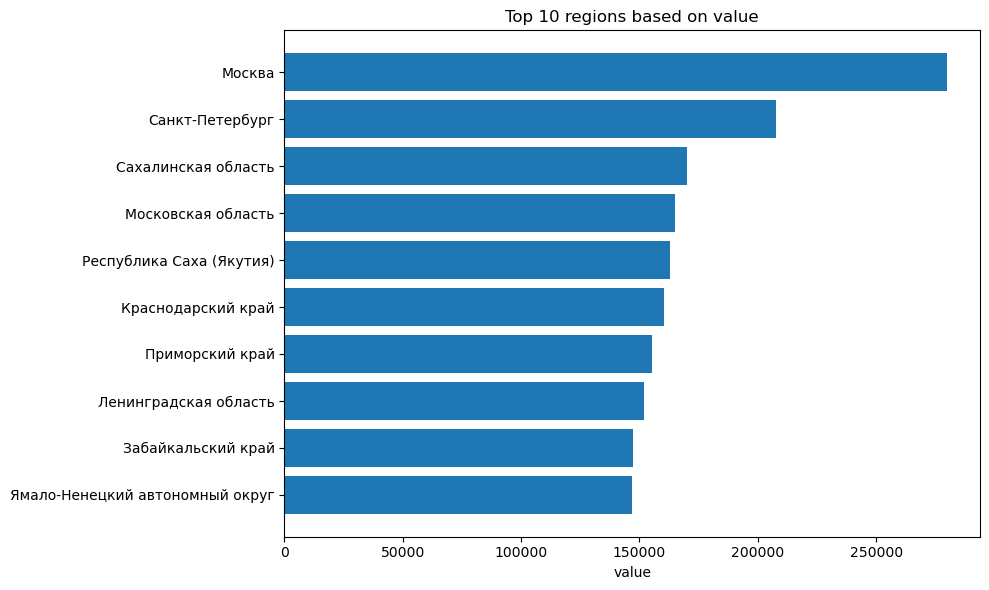

In [21]:
syv.plot_regions_barcharts(df=primary_deals,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_deals")


Построим диаграмму топ-10 регионов по стоимости квадратного метра предложений на первичном рынке.

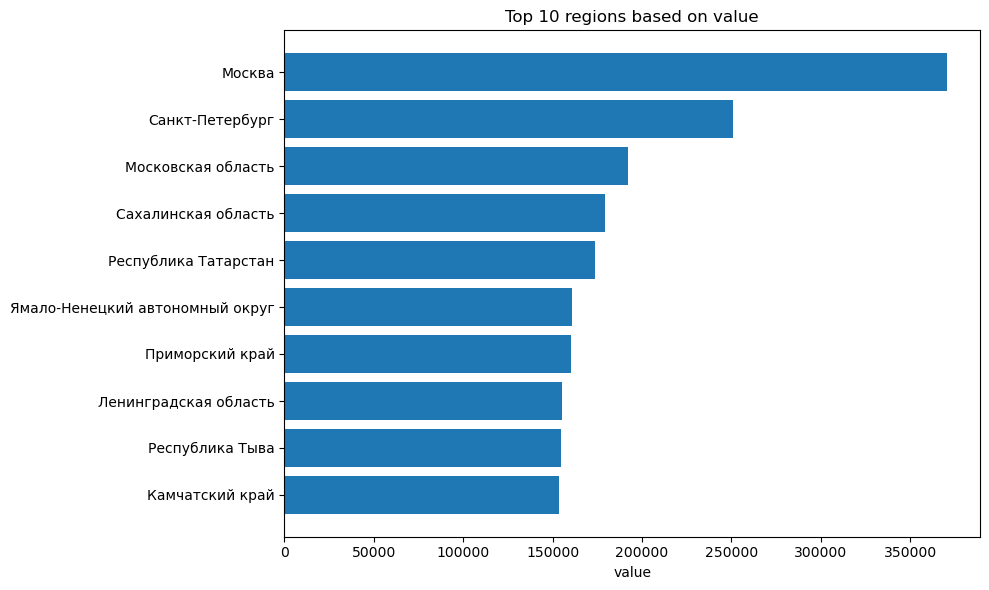

In [22]:
syv.plot_regions_barcharts(df=primary_offers,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_offers")

Построим диаграмму топ-10 регионов по стоимости квадратного метра сделок на вторичном рынке.

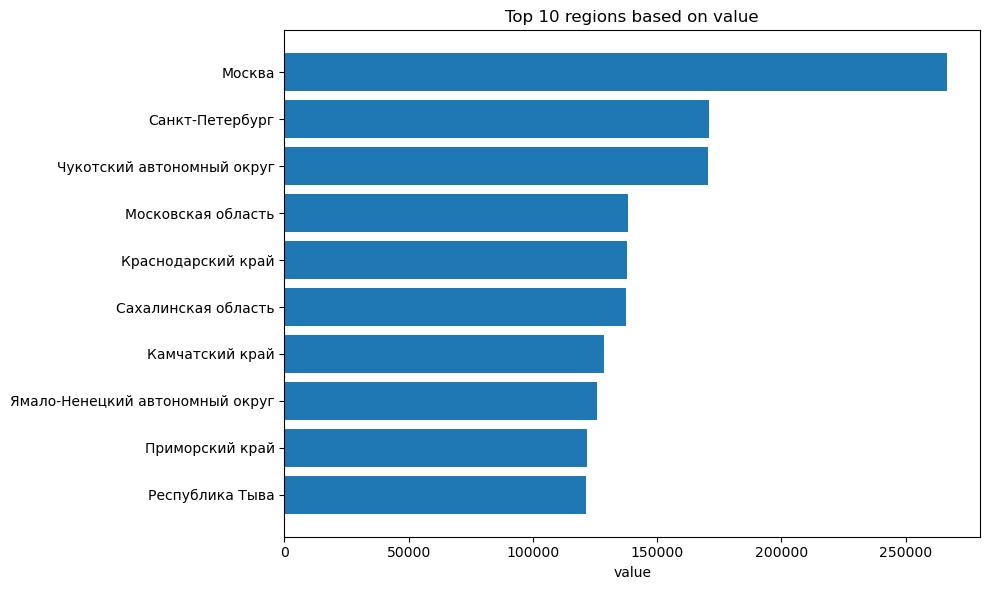

In [23]:
syv.plot_regions_barcharts(df=secondary_deals,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_deals")

Построим диаграмму топ-10 регионов по стоимости квадратного метра предложений на вторичном рынке.

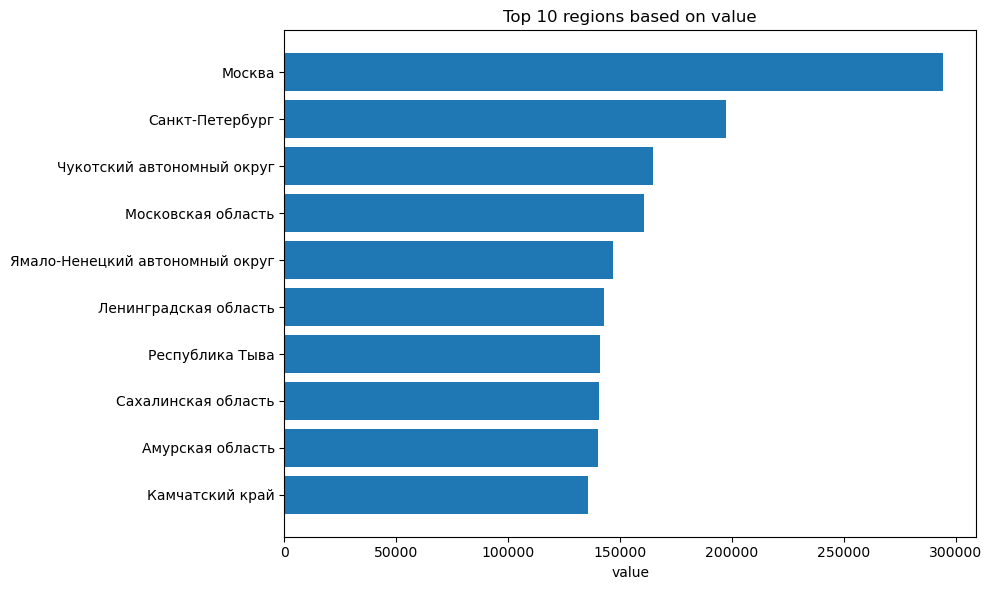

In [24]:
syv.plot_regions_barcharts(df=secondary_offers,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_offers")

Построим диаграмму объёмов предложений на первичном рынке.

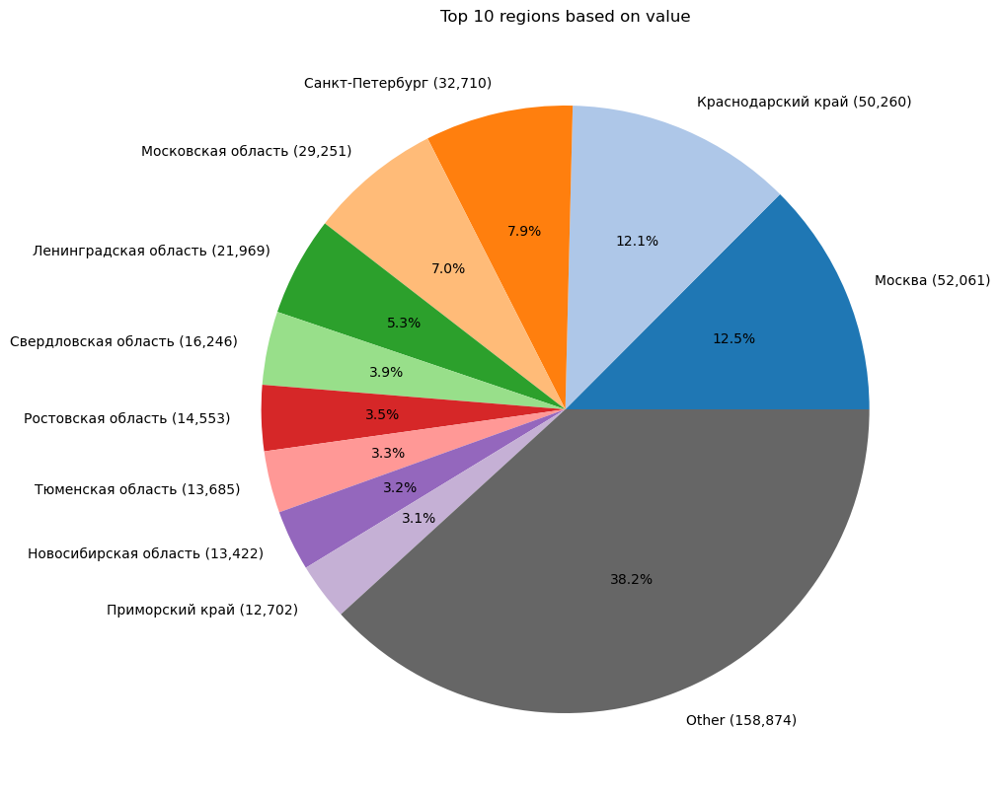

In [25]:
syv.plot_pie_chart(df=primary_volumes,\
                   column='value',\
                   exclude_regions=['Россия'],\
                   num_regions=10,\
                   data_frame_name="primary_volumes")


Построим диаграмму объёмов предложений на вторичном рынке.

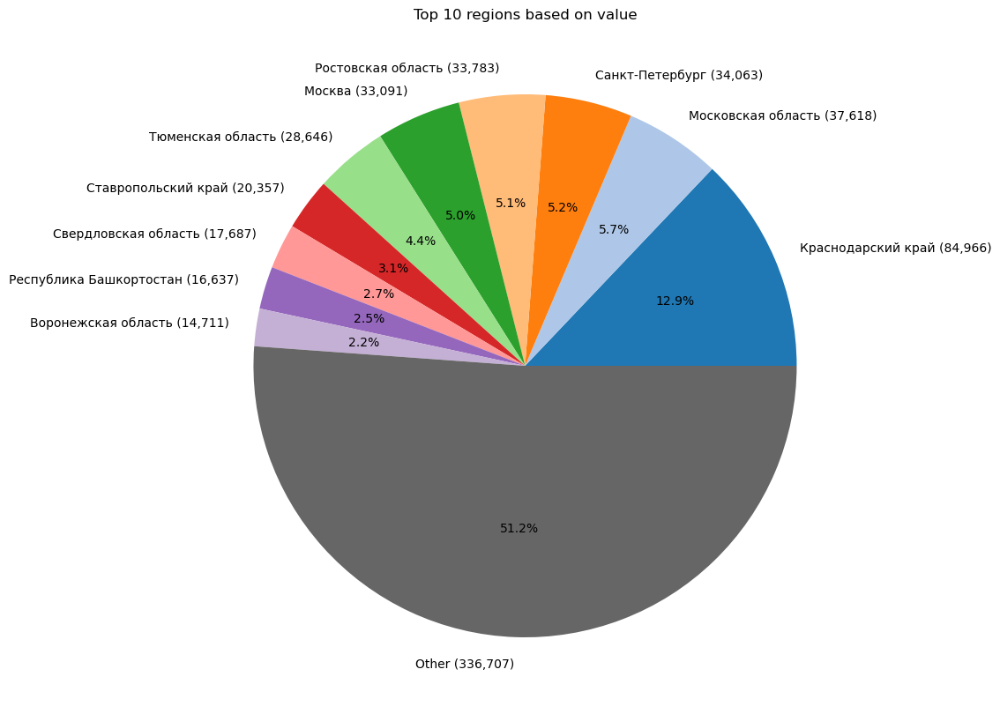

In [26]:
syv.plot_pie_chart(df=secondary_volumes,\
                   column='value',\
                   exclude_regions=['Россия'],\
                   num_regions=10,\
                   data_frame_name="secondary_volumes")

Построим диаграмму топ-10 регионов по ликвидности вторичной недвижимости.

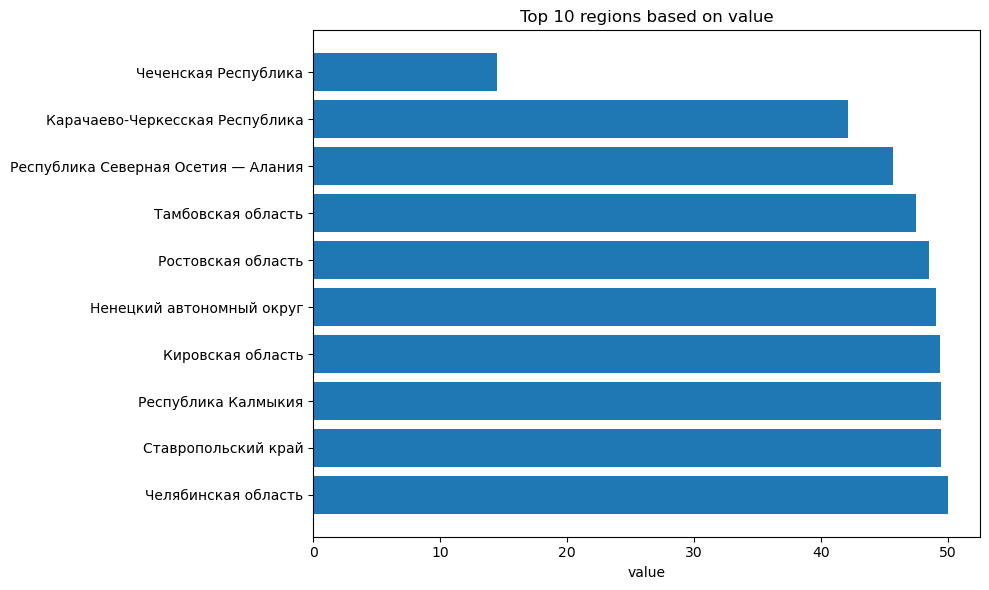

In [27]:
syv.plot_regions_barcharts(df=secondary_exposure,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="secondary_exposure")

Построим диаграмму регионов, где продавцы первичной недвижимости готовы дать наибольшие скидки от цены преложения.

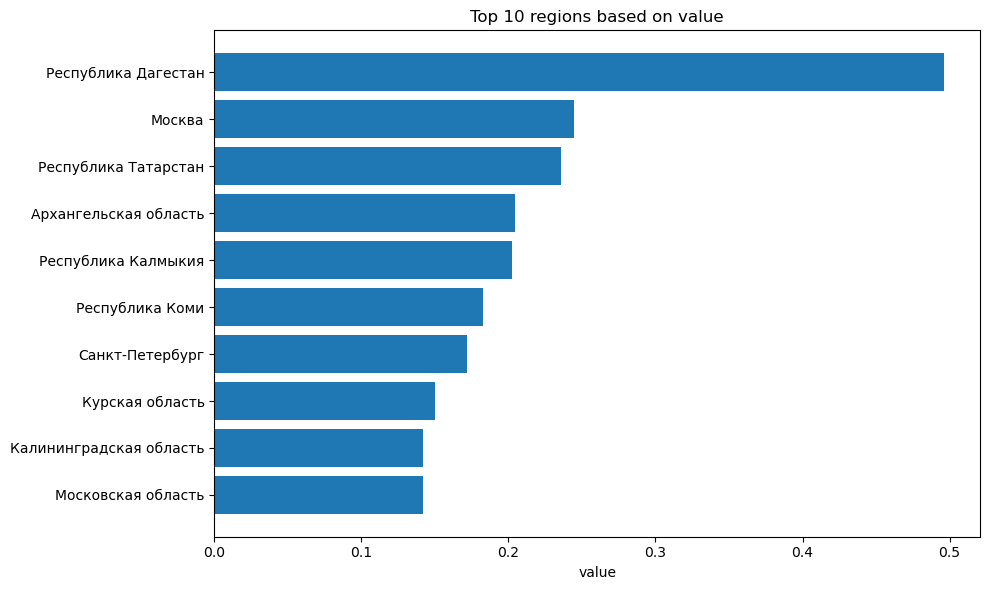

In [28]:
syv.plot_regions_barcharts(df=primary_discounts,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_discounts")

Построим диаграмму регионов, где продавцы вторичной недвижимости готовы дать наибольшие скидки от цены преложения.

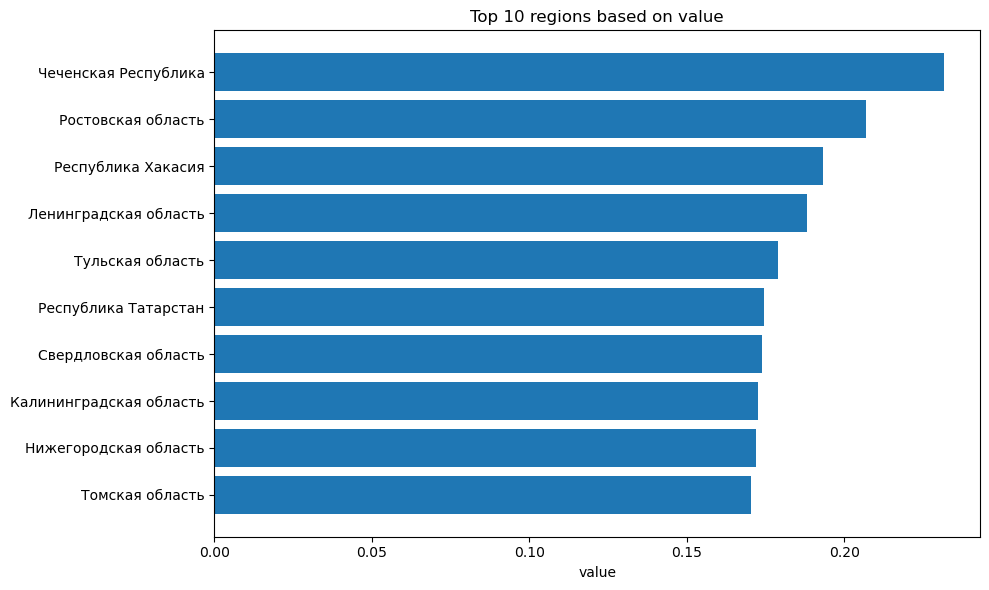

In [29]:
syv.plot_regions_barcharts(df=secondary_discounts,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_discounts")

Построим диаграмму топ-10 регионов с максимальным отношением цен сделок на первичном рынке к ценам сделок на вторичном рынке

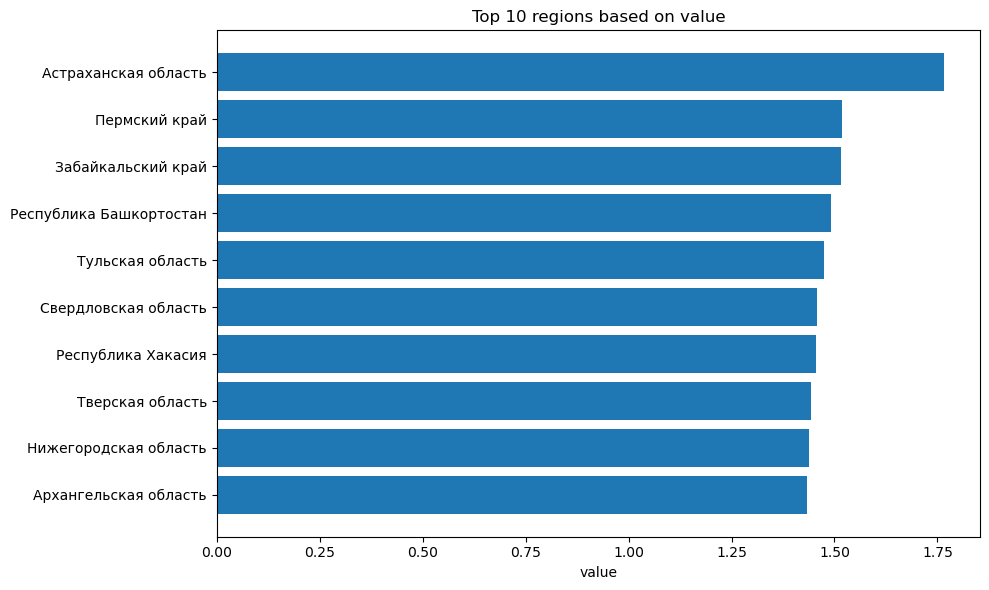

In [30]:
syv.plot_regions_barcharts(df=deals_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="deals_ratios")

Построим диаграмму топ-10 регионов с минимальным отношением цен сделок на первичном рынке к ценам сделок на вторичном рынке.

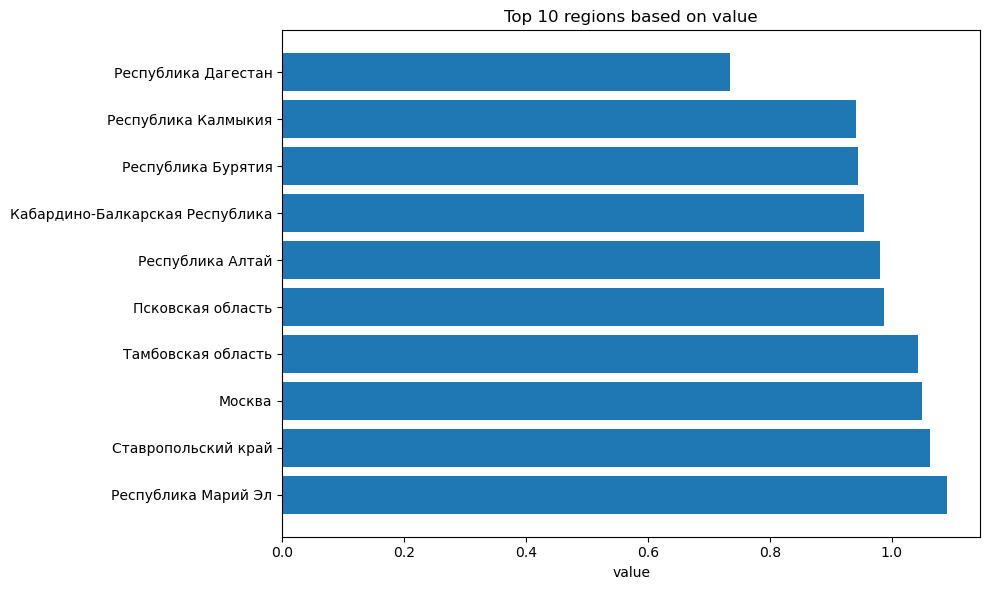

In [31]:
syv.plot_regions_barcharts(df=deals_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="deals_ratios")

Построим диаграмму топ-10 регионов с максимальным отношением цен предложений на первичном рынке к ценам сделок на вторичном рынке.

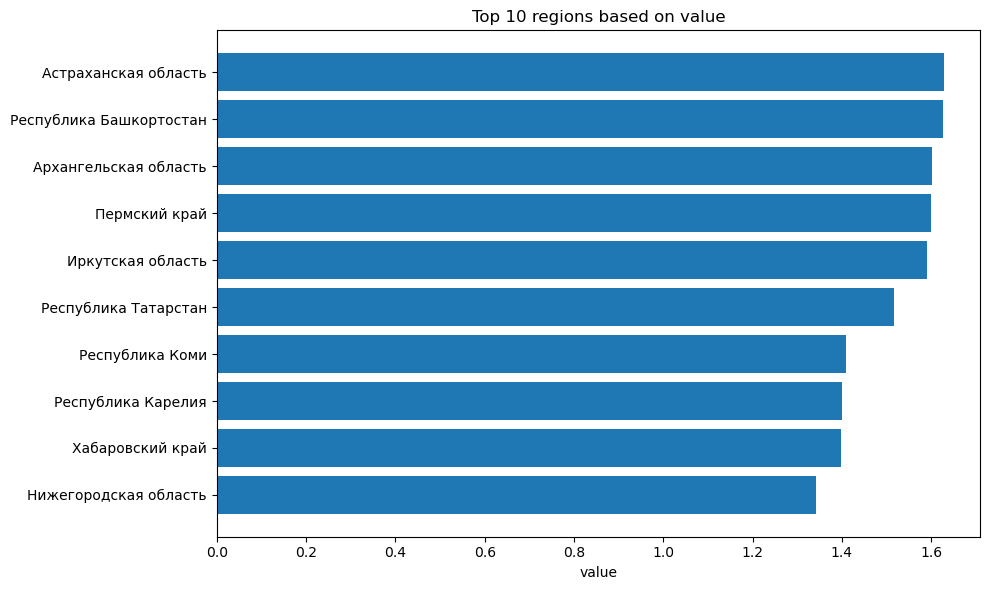

In [32]:
syv.plot_regions_barcharts(df=offers_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="offers_ratios")

Построим диаграмму топ-10 регионов с минимальным отношением цен предложений на первичном рынке к ценам сделок на вторичном рынке.

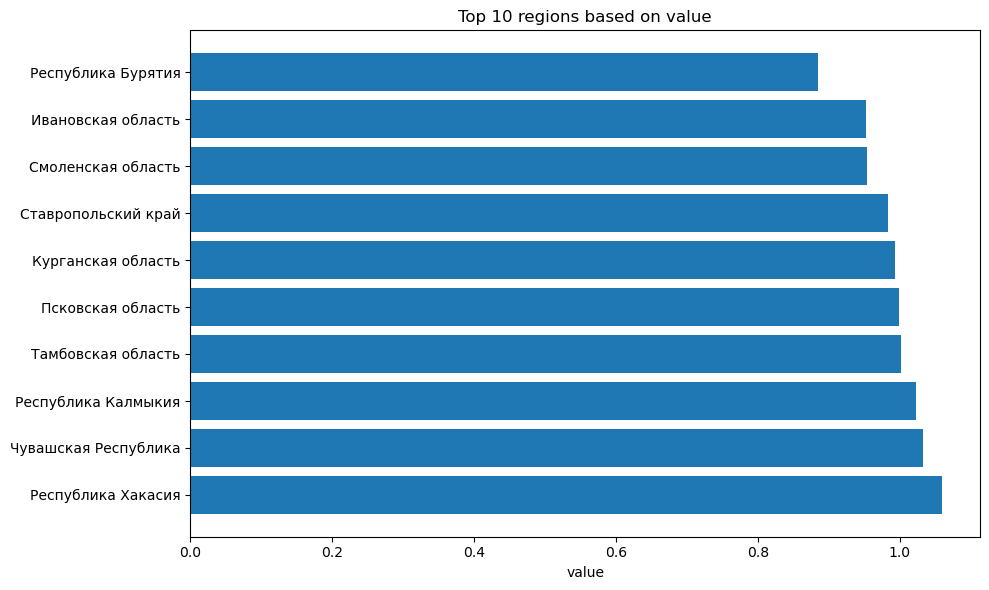

In [33]:
syv.plot_regions_barcharts(df=offers_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="offers_ratios")

Построим диаграмму топ-10 регионов с максимальным отношением объёма предложений на первичном рынке к объёму сделок на вторичном рынке.

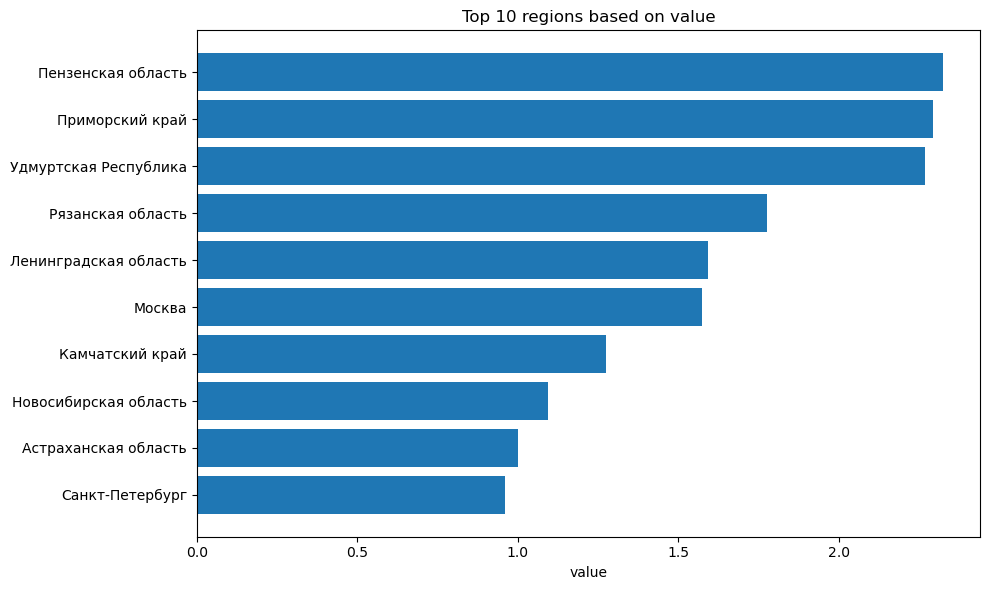

In [34]:
syv.plot_regions_barcharts(df=volumes_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="volumes_ratios")

Построим диаграмму топ-10 регионов с минимальным отношением объёма предложений на первичном рынке к объёму сделок на вторичном рынке.

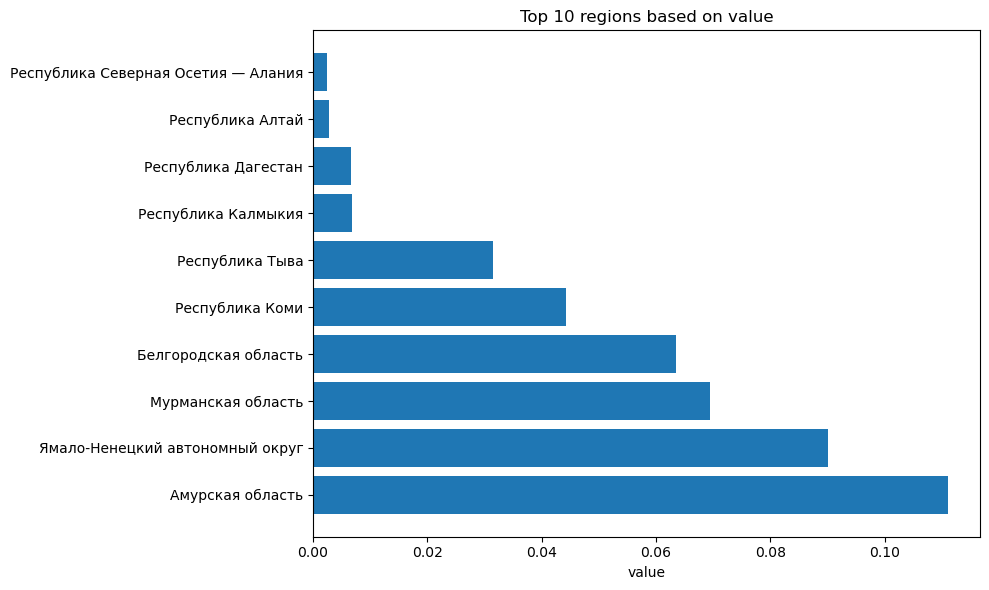

In [35]:
syv.plot_regions_barcharts(df=volumes_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="volumes_ratios")

### 2.3. Проблемы неравенства регионов

Для анализа неравенства регионов построим диаграммы ядерной оценки плотности (данные графики представляют собой улучшенную более современную версию гистограммы), а также вычислим значения коэффициента Джини для различных индикаторов рынка.

#### 2.3.1. Построение диаграмм ядерной оценки плотности

Построим диаграмму ядерной оценки плотности распределения цен сделок первичных рынков регионов. Синяя линия и закрашенная под ней область &mdash; эмпирические значения ядерной оценки плотности распределения; красная вертикальная прерывистая линиия &mdash; значения показателя для России в целом; красная кривая &mdash; теоретическая кривая нормального распределения, построенного на основе значения для России в качестве среднего и эмпирического стандартного отклонения, рассчитанного на основе данных по регионам.

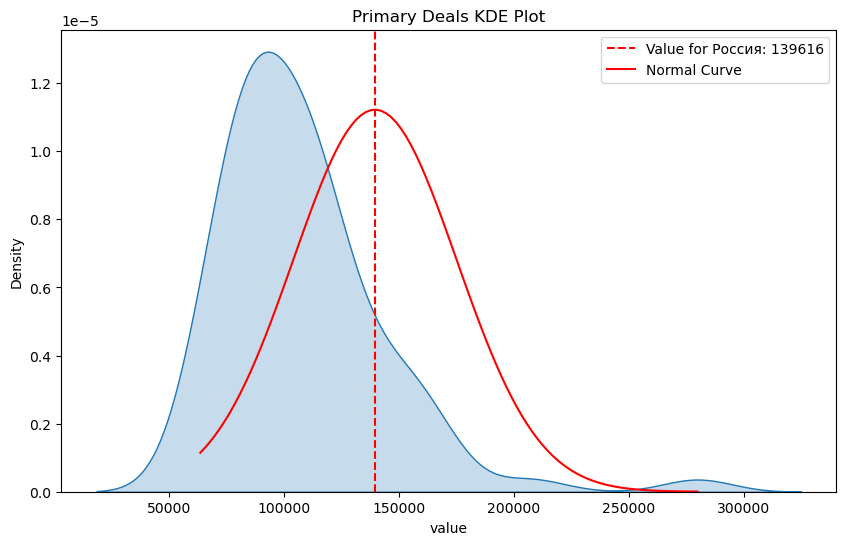

In [36]:
syv.plot_kde_single_column(df=primary_deals,\
                           title="Primary Deals KDE Plot")

Построим диаграмму ядерной оценки плотности распределения цен предложения первичных рынков регионов.

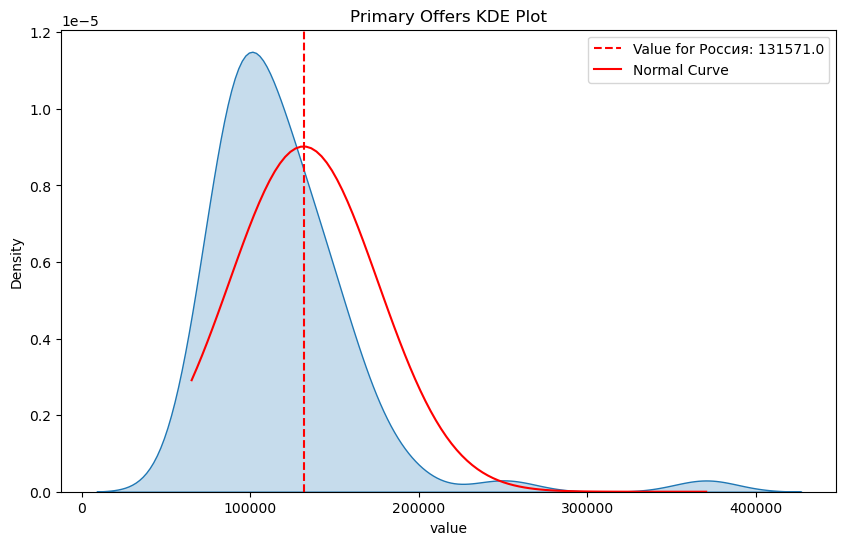

In [37]:
syv.plot_kde_single_column(df=primary_offers,\
                           title="Primary Offers KDE Plot")

Построим диаграмму ядерной оценки плотности распределения цен сделок вторичных рынков регионов.

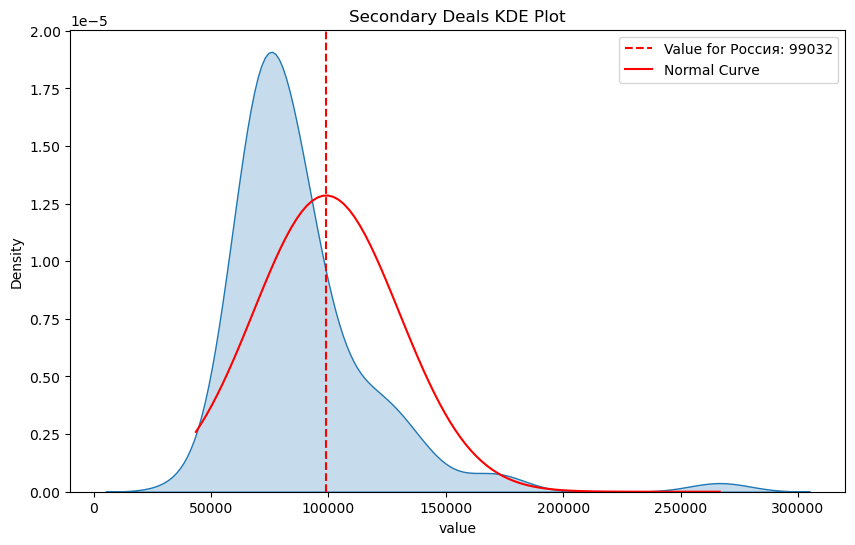

In [38]:
syv.plot_kde_single_column(df=secondary_deals,\
                           title="Secondary Deals KDE Plot")

Построим диаграмму ядерной оценки плотности распределения цен предложения вторичных рынков регионов.

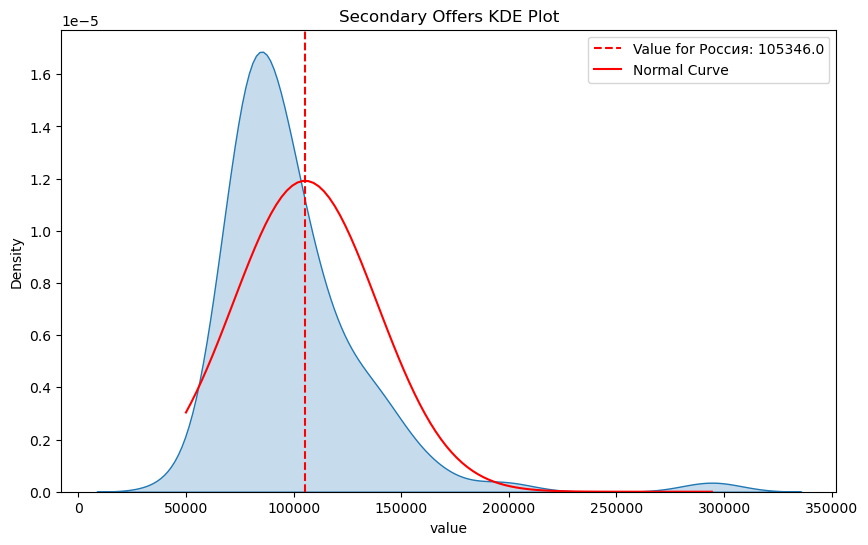

In [39]:
syv.plot_kde_single_column(df=secondary_offers,\
                           title="Secondary Offers KDE Plot")

Построим диаграмму ядерной оценки плотности распределения объёмов предложения первичных рынков регионов.

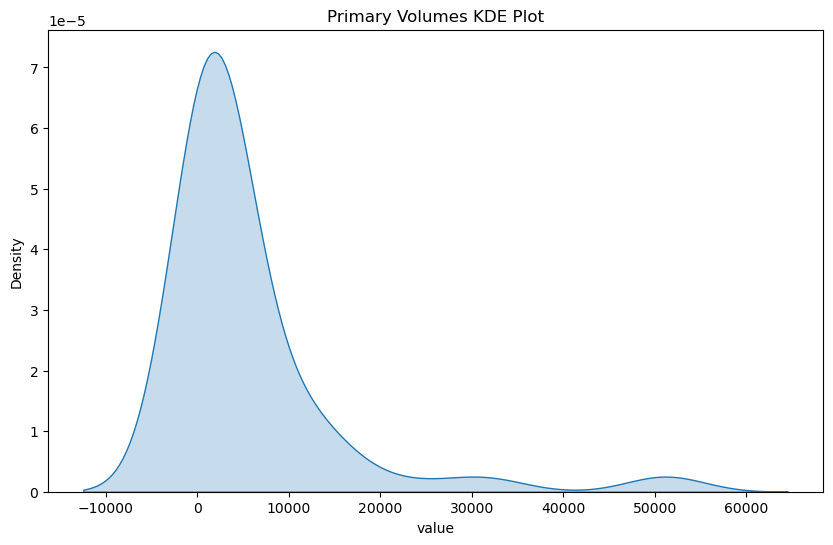

In [40]:
syv.plot_kde_single_column(df=primary_volumes,\
                           title="Primary Volumes KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

Построим диаграмму ядерной оценки плотности распределения объёмов предложения вторичных рынков регионов.

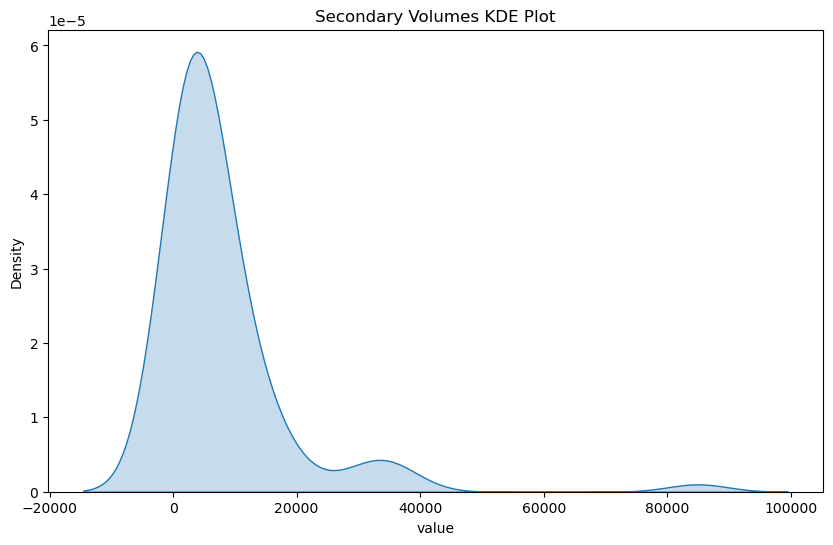

In [41]:
syv.plot_kde_single_column(df=secondary_volumes,\
                           title="Secondary Volumes KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

Построим диаграмму ядерной оценки плотности распределения сроков экспозиции на вторичных рынках регионов.

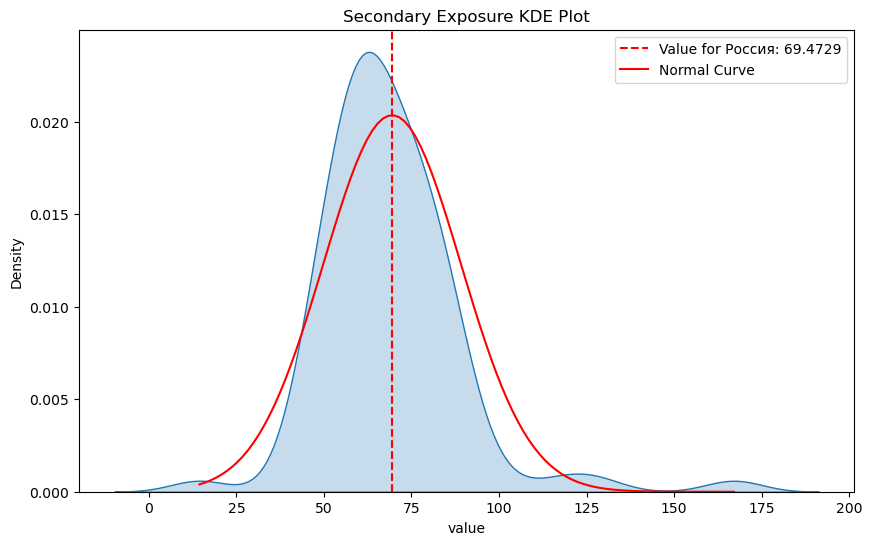

In [42]:
syv.plot_kde_single_column(df=secondary_exposure,\
                           title="Secondary Exposure KDE Plot")

Построим диаграмму ядерной оценки плотности распределения скидок при переходе от цен предложений к ценам сделок на первичных рынках регионов.

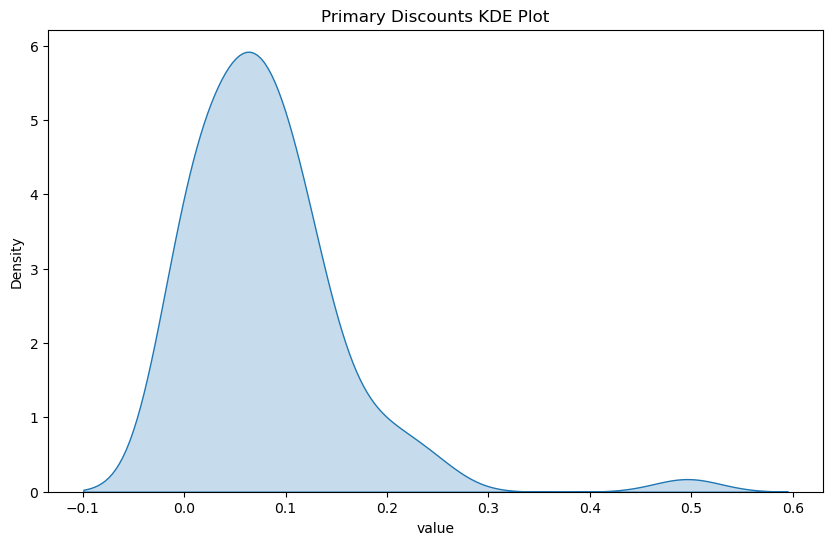

In [43]:
syv.plot_kde_single_column(df=primary_discounts,\
                           title="Primary Discounts KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

Построим диаграмму ядерной оценки плотности распределения скидок при переходе от цен предложений к ценам сделок на вторичных рынках регионов.

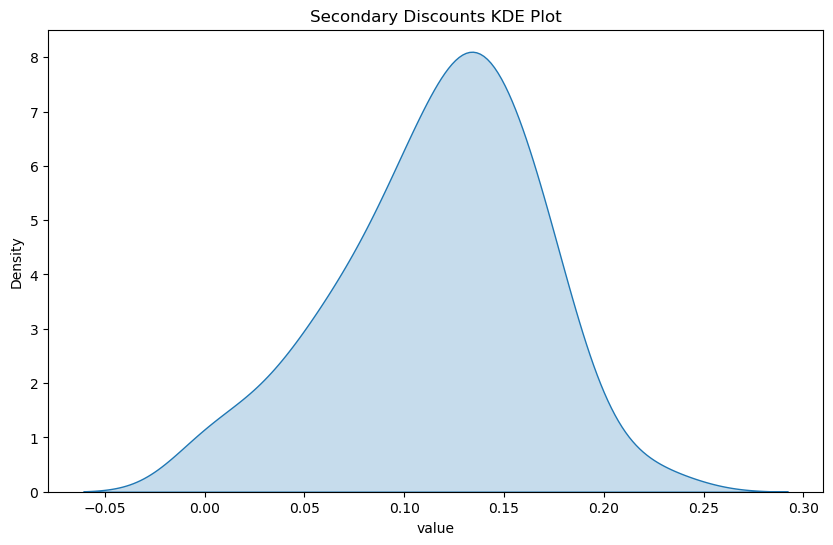

In [44]:
syv.plot_kde_single_column(df=secondary_discounts,\
                           title="Secondary Discounts KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

Построим диаграмму ядерной оценки плотности отношения средних цен сделок первичного к средним ценам вторичного рынка регионов.

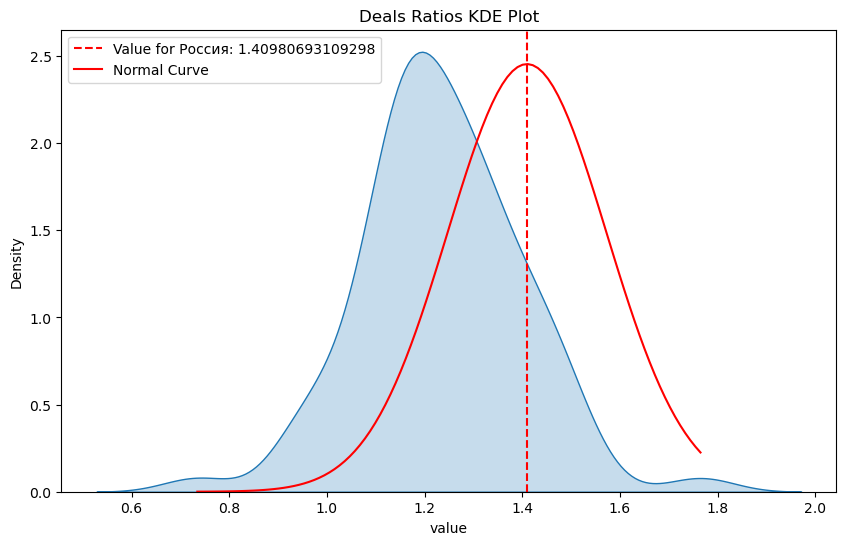

In [45]:
syv.plot_kde_single_column(df=deals_ratios,\
                           title="Deals Ratios KDE Plot")

Построим диаграмму ядерной оценки плотности отношения медианных цен предложений первичного к медианным ценам вторичного рынка регионов.

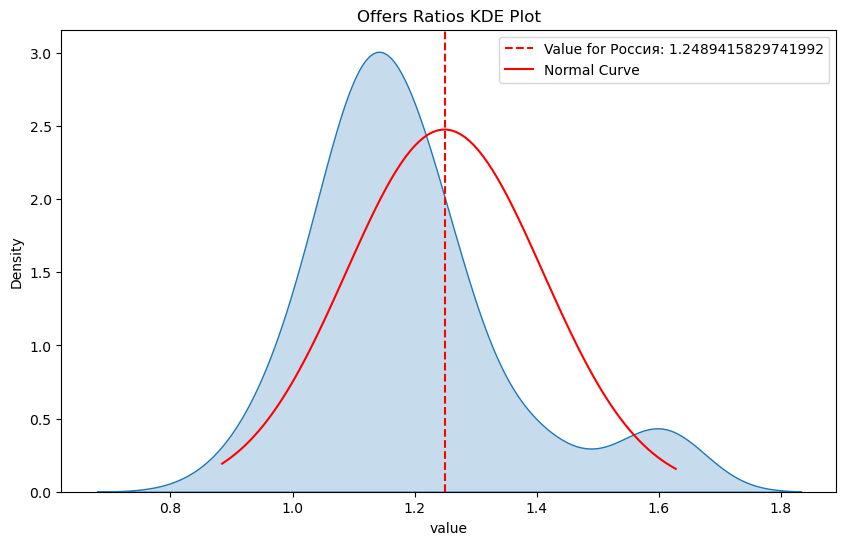

In [46]:
syv.plot_kde_single_column(df=offers_ratios,\
                           title="Offers Ratios KDE Plot")

Построим диаграмму ядерной оценки плотности отношения объёмов предложений первичного к объёмам предложеня вторичного рынка регионов.

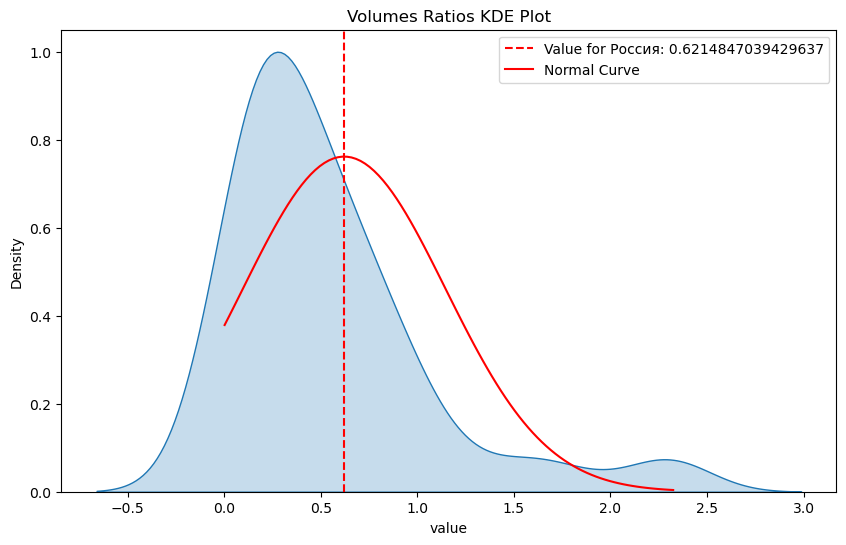

In [47]:
syv.plot_kde_single_column(df=volumes_ratios,\
                           title="Volumes Ratios KDE Plot")

#### 2.3.2. Расчёт коэффициента Джини

Рассчитаем значения коэффициента Джини для фактических и стандартизированных значений. 

In [48]:
gini_df = syv.calculate_gini_coefficients(
    [primary_deals, primary_offers, secondary_deals, secondary_offers,
     primary_volumes, secondary_volumes],
    names=['primary_deals', 'primary_offers', 'secondary_deals', 'secondary_offers',
           'primary_volumes', 'secondary_volumes']
)

gini_df


,data_frame,gini_value,gini_standardized_value
0,primary_deals,0.165871,0.404451
1,primary_offers,0.171238,0.378048
2,secondary_deals,0.158713,0.311808
3,secondary_offers,0.154272,0.308918
4,primary_volumes,0.687897,0.687899
5,secondary_volumes,0.574056,0.576369


## 3. Кластеризация

Кластеризация выполнялась иерархического кластерного анализа. Использовались евклидово расстояние между объектами и дистанция Варда между кластерами. Проведедём кластеризацию на основе стандартизированных значений четырёх ценовых и двух объёмных индикаторов рынков. Кластеризация была выполнена только для регионов, имеющих значения во всех вышеуказанных шести столбцах. 

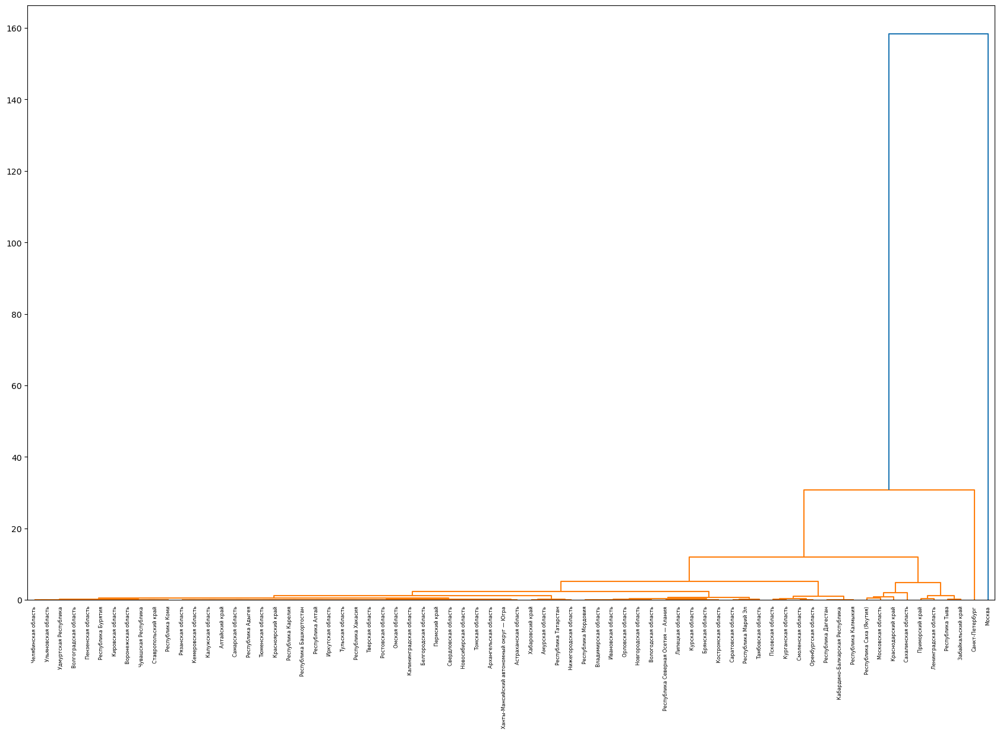

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,region,cluster_label
0,Санкт-Петербург,2
1,Ленинградская область,0
2,Москва,3
3,Московская область,0
4,Краснодарский край,0
5,Алтайский край,1
6,Амурская область,1
7,Архангельская область,1
8,Астраханская область,1
9,Белгородская область,1


In [49]:
# List of data frames to be used in clustering
data_frames_to_cluster = [primary_deals, primary_offers, secondary_deals, secondary_offers, primary_volumes, secondary_volumes]

# Columns to be used in clustering
columns_to_cluster = ['standardized_value']

# Number of clusters
num_clusters = 5

# Affinity
affinity_type = 'euclidean'

# Linkage method
linkage_method = 'ward'

# Calling the hierarchical_clustering function
clustered_data_hier = syv.hierarchical_clustering(data_frames=data_frames_to_cluster, 
                                        columns=columns_to_cluster, 
                                        n_clusters=num_clusters, 
                                        affinity=affinity_type, 
                                        linkage_method=linkage_method)

# Displaying the resulting DataFrame with cluster labels
clustered_data_hier


Результаты кластеризации можно интерпретировать, в том числе, следующим образом:

|||
| --- | --- |
|Номер кластера|Описание|
|3|Данный кластер включает в себя единственный регион &mdash; город Москва, являющийся [глобальным альфа-городом](https://en.wikipedia.org/wiki/Global_city)  и имеющий исключительно высокие показатели развития рынка жилой недвижимости|
|2|Данный кластер включает в себя единственный регион &mdash; город Санкт-Петербург, являющийся [глобальным бета-городом](https://en.wikipedia.org/wiki/Globalization_and_World_Cities_Research_Network) и также имеющий высокие показатели развития рынка жилой недвижимости равно как и стандарты жизни|
|0|Даный кластер включает в себя как благополучные регионы с высоким уровнем жизни (например, Ленинградская область и Краснодарский край), так и регионы с 'северным' уровнем номинальных зарплат, увеличивающим номинальные цены без реального содержания с точки зрения качества жизни (например, Забайкальский край и Якутия) |
|1|Данный кластер включает основную массу регионов со средним уровнем развития рынка недвижимости|
|4|Данный кластер включает регионы с относительно низкими уровнем развития рынка недвижимости и качеством жизни|
|Без номера|Оставшиеся регионы характеризуются относительно малым количеством объектов недвижимости, вследствие чего их невозможно отнести к одномуиз кластеров|

Следует отметить, что нумерация кластеров сама по себе не имеет осмысленной трактовки и носит технический характер, связанный с моментом первого объединения регионов в кластере.

## 4. Геоанализ по состоянию на 2023-09-30

Построим тепловые карты различных индикаторов в разрезе регионов. Версии карт в высоком разрешении, а также интерактивные масштабируемые карты доступны по ссылкам выше. Всего будет построено 13 тепловых карт. Ценовые индикаторы выражены в номинальных рублях.

|Индикатор|Название карты и соответсвующего файла в [каталоге](https://drive.google.com/drive/folders/17Q9r9kBuTPWHX7Oy95icRMV_C5D8rzMQ?usp=drive_link)|
| --- | --- |
|Средняя цена сделки на первичном рынке|Primary Deals|
|Средняя цена сделки на вторичном рынке|Secondary Deals|
|Медианная цена предложения на первичном рынке|Primary Offers|
|Медианная цена предложения на вторичном рынке|Secondary Offers|
|Объём предложения на первичном рынке|Primary Volumes|
|Объём предложения на вторичном рынке|Secondary Volumes|
|Средний срок экпозиции квартиры на вторичном рынке|Secondary Exposure|
|Типичная скидка при переходе от цены предложения к цене сделки на первичном рынке|Primary Discounts|
|Типичная скидка при переходе от цены предложения к цене сделки на вторичном рынке|Secondary Discounts|
|Отношение средних цен сделок на первичном рынке к аналогичному показателю на вторичном рынке|Deals Ratios|
|Отношение медианных цен предложения на первичном рынке к аналогичному показателю на вторичном рынке|Offers Ratios|
|Отношение объёма предложения на первичном рынке к аналогичному показателю на вторичном рынке|Volumes Ratios|
|Отношение типичной скидки при переходе от цены предложения к цене сделки на первичном рынке к аналогичному показателю на вторичном рынке|Discounts Ratios|


### 4.1. Статичные карты

Получаем GeoJSON с координатами границ и полигонами регионов.

In [50]:
# Load the default GeoJSON data
gdf = syv.get_rf_geojson()
# Keeping only the 'name' and 'geometry' columns
gdf = gdf[['name', 'geometry']]
# Unify column names
gdf.rename(columns={'name': 'region'}, inplace=True)


Проверка целостности данных.

In [51]:
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = syv.check_consistency(
    primary_deals, 
    secondary_deals, 
    primary_offers, 
    secondary_offers,
    primary_volumes,
    secondary_volumes,
    secondary_exposure,
    primary_discounts,
    secondary_discounts,
    deals_ratios,
    offers_ratios,
    volumes_ratios,
    discounts_ratios
)

Находим и испраляем несоответствия в названиях регионов из базы Sberindex и GeoJSON.

In [52]:
# Harmonize regions names
geojson_regions = syv.get_all_regions_from_geojson(gdf)
gdf = syv.harmonize_geojson_names(gdf)
primary_deals = syv.harmonize_sql_names(primary_deals)
secondary_deals = syv.harmonize_sql_names(primary_deals)
primary_offers = syv.harmonize_sql_names(primary_offers)
secondary_offers = syv.harmonize_sql_names(secondary_offers)
primary_volumes = syv.harmonize_sql_names(primary_volumes)
secondary_volumes = syv.harmonize_sql_names(secondary_volumes)
secondary_exposure = syv.harmonize_sql_names(secondary_exposure)
primary_discounts = syv.harmonize_sql_names(primary_discounts)
secondary_discounts = syv.harmonize_sql_names(secondary_discounts)
deals_ratios = syv.harmonize_sql_names(deals_ratios)
offers_ratios = syv.harmonize_sql_names(offers_ratios)
volumes_ratios = syv.harmonize_sql_names(volumes_ratios)
discounts_ratios = syv.harmonize_sql_names(discounts_ratios)

# Create object
sberindex_regions = syv.get_all_regions_from_sql(primary_deals,\
                                                 secondary_deals,\
                                                 primary_offers,\
                                                 secondary_offers,\
                                                 primary_volumes,\
                                                 secondary_volumes,\
                                                 secondary_exposure,\
                                                 primary_discounts,\
                                                 secondary_discounts,\
                                                 deals_ratios,\
                                                 offers_ratios,\
                                                 volumes_ratios,\
                                                 discounts_ratios
                                                )

# Remove redundant regions
gdf = syv.remove_redundant_from_geojson(gdf)

# Create list of regions from GeoJSON
geojson_regions = syv.get_all_regions_from_geojson(gdf)

# Recreate object
sberindex_regions = syv.get_all_regions_from_sql(primary_deals,\
                                                 secondary_deals,\
                                                 primary_offers,\
                                                 secondary_offers,\
                                                 primary_volumes,\
                                                 secondary_volumes,\
                                                 secondary_exposure,\
                                                 primary_discounts,\
                                                 secondary_discounts,\
                                                 deals_ratios,\
                                                 offers_ratios,\
                                                 volumes_ratios,\
                                                 discounts_ratios
                                                )

Сравним перечни регионов от Sberondex и в GeoJSON.

In [53]:
mismatches_sql_geojson, mismatches_geojson_sql = syv.find_region_mismatches(sberindex_regions, geojson_regions)

print("Regions in data frames but not in GeoJSON:", mismatches_sql_geojson)
print("Regions in GeoJSON but not in data frames:", mismatches_geojson_sql)

Regions in data frames but not in GeoJSON: ['Россия']
Regions in GeoJSON but not in data frames: []


Определим перечень карт для построения

In [54]:
# Add to datasets
datasets_plt = [
    (primary_deals, 'value', 'Primary Deals', 'primary_deals.png'),
    (secondary_deals, 'value', 'Secondary Deals', 'secondary_deals.png'),
    (primary_offers, 'value', 'Primary Offers', 'primary_offers.png'),
    (secondary_offers, 'value', 'Secondary Offers', 'secondary_offers.png'),
    (primary_volumes, 'value', 'Primary Volume', 'primary_volumes.png'),
    (secondary_volumes, 'value', 'Secondary Volume', 'secondary_volumes.png'),
    (secondary_exposure, 'value', 'Secondary Exposure', 'secondary_exposure.png'),
    (primary_discounts, 'value', 'Primary Discount Rate', 'primary_discount.png'),
    (secondary_discounts, 'value', 'Secondary Discount Rate', 'secondary_discount.png'),
    (deals_ratios, 'value', 'Primary to Secondary Market Deals Ratios', 'deals_ratios.png'),
    (offers_ratios, 'value', 'Primary to Secondary Market Offers Ratios', 'offers_ratios.png'),
    (volumes_ratios, 'value', 'Primary to Secondary Market Volumes Ratios', 'volumes_ratios.png'),
    (discounts_ratios, 'value', 'Primary to Secondary Market Discounts Ratios', 'discounts_ratios.png')
]


Скорректируем координаты для построения карты с Чукоткой, частично расположенной в другом полушарии.

In [55]:
shifted_gdf = syv.shift_geometry(gdf.copy())

Построим статичные тепловые карты 13 индикаторов рынка жилой недвижимости в России на дату исследования. Данные карты в виде отдельных файлов доступны по [ссылке](https://drive.google.com/drive/folders/17Q9r9kBuTPWHX7Oy95icRMV_C5D8rzMQ?usp=drive_link).

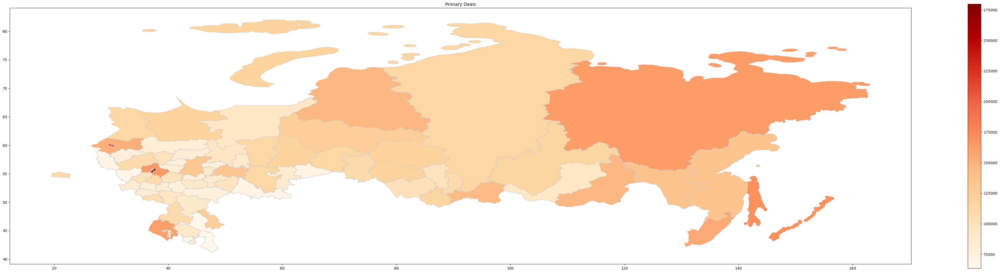

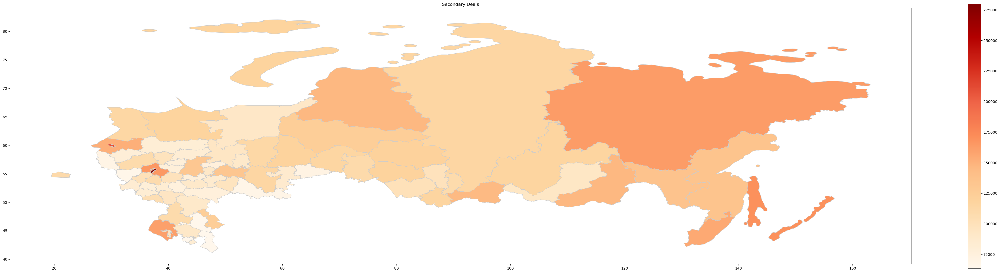

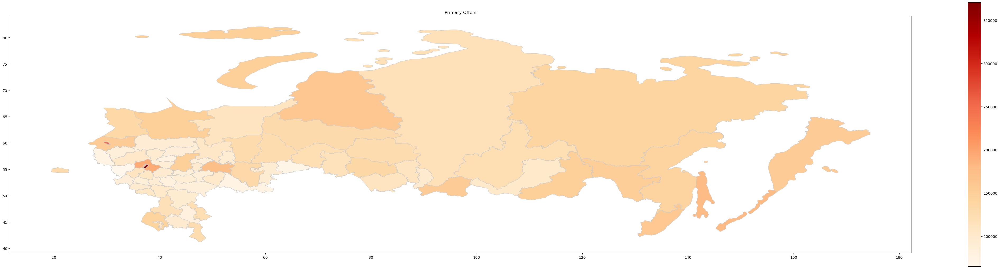

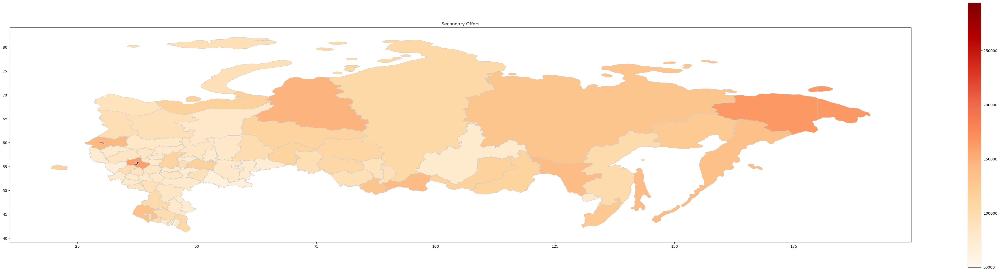

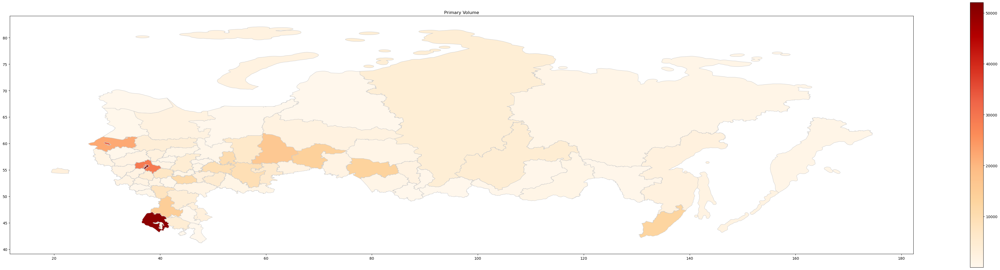

...

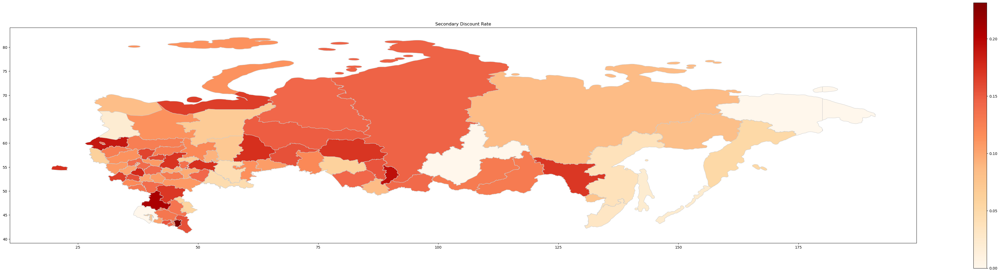

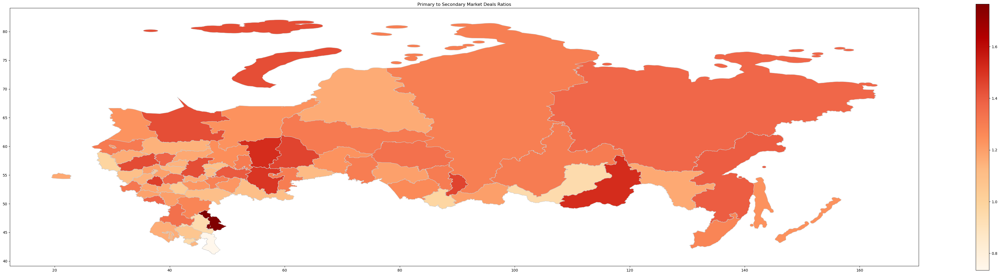

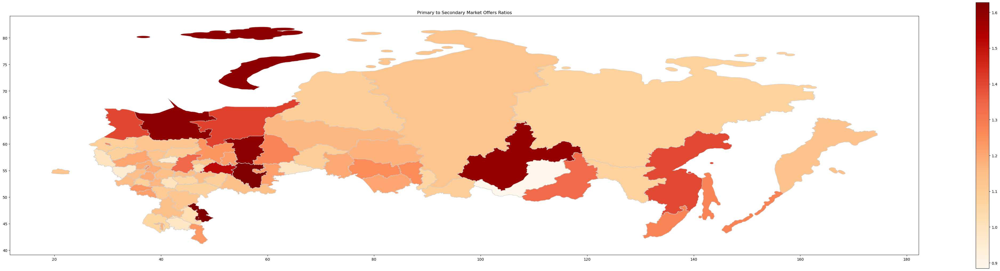

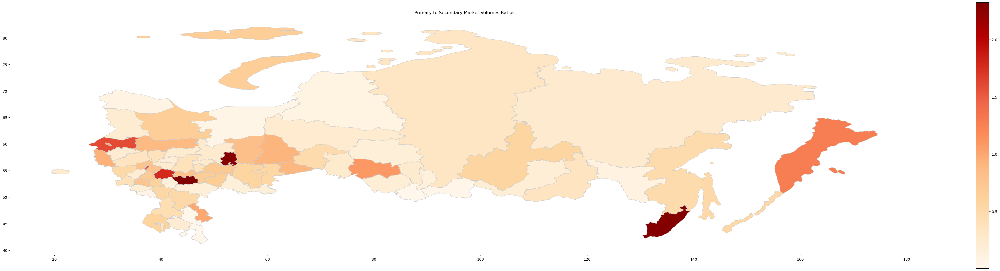

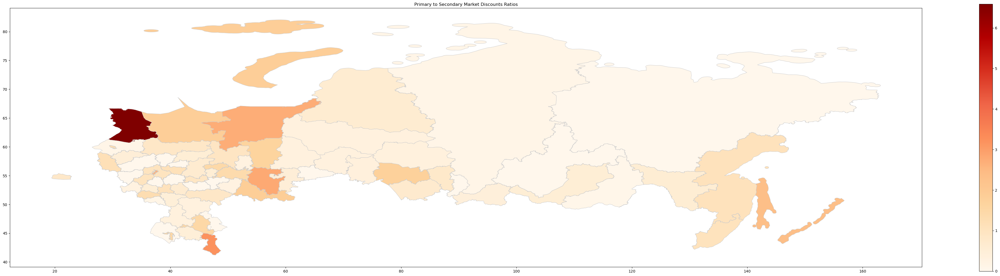

In [56]:
# Looping over each dataset in datasets_plt
for data, column_name, display_name, filename in datasets_plt:
    # Calling the function with the appropriate arguments
    syv.create_and_display_heatmaps_sberindex(data, column_name, display_name, filename, shifted_gdf)


### 4.2. Интерактивные карты

Построим также интерактивные карты. Они доступны по [ссылке](https://drive.google.com/drive/folders/17Q9r9kBuTPWHX7Oy95icRMV_C5D8rzMQ?usp=drive_link).

In [57]:
# Add to datasets
datasets_folium = [
    (primary_deals, 'value', 'Primary Deals', 'primary_deals.png'),
    (secondary_deals, 'value', 'Secondary Deals', 'secondary_deals.png'),
    (primary_offers, 'value', 'Primary Offers', 'primary_offers.png'),
    (secondary_offers, 'value', 'Secondary Offers', 'secondary_offers.png'),
    (primary_volumes, 'value', 'Primary Volume', 'primary_volumes.png'),
    (secondary_volumes, 'value', 'Secondary Volume', 'secondary_volumes.png'),
    (secondary_exposure, 'value', 'Secondary Exposure', 'secondary_exposure.png'),
    (primary_discounts, 'value', 'Primary Discount Rate', 'primary_discount.png'),
    (secondary_discounts, 'value', 'Secondary Discount Rate', 'secondary_discount.png'),
    (deals_ratios, 'value', 'Primary to Secondary Market Deals Ratios', 'deals_ratios.png'),
    (offers_ratios, 'value', 'Primary to Secondary Market Offers Ratios', 'offers_ratios.png'),
    (volumes_ratios, 'value', 'Primary to Secondary Market Volumes Ratios', 'volumes_ratios.png'),
    (discounts_ratios, 'value', 'Primary to Secondary Market Discounts Ratios', 'discounts_ratios.png')
]

In [58]:
for data, column_name, display_name, filename in datasets_folium:
    syv.create_and_save_choropleth_sberindex(data, column_name, display_name, gdf, display_name)


## 5. Анализ временных рядов

### 5.1. Подготовка данных

Создание дата фреймов, содержащих данные за весь период наблюдений на стороне Sberindex. Проверка целостности.

In [59]:
# Fetch data for the entire period
primary_deals_ts, secondary_deals_ts, primary_offers_ts,\
secondary_offers_ts, primary_volumes_ts, secondary_volumes_ts,\
secondary_exposure_ts = syv.read_sberindex_flats()

# Check data
primary_deals_ts, secondary_deals_ts, primary_offers_ts,\
secondary_offers_ts, primary_volumes_ts, secondary_volumes_ts,\
secondary_exposure_ts = syv.check_consistency(primary_deals_ts,\
                                              secondary_deals_ts,\
                                              primary_offers_ts,\
                                              secondary_offers_ts,\
                                              primary_volumes_ts,\
                                              secondary_volumes_ts,\
                                              secondary_exposure_ts)


Расчёт скидок при переходе от цен предложений к ценам сделок.

In [60]:
primary_discount_rates_ts = syv.calculate_discount_rates_ts(primary_deals_ts, primary_offers_ts, 'primary')
secondary_discount_rates_ts = syv.calculate_discount_rates_ts(secondary_deals_ts, secondary_offers_ts, 'secondary')

Расчёт соотношений между первичным и вторичным рынками.

In [61]:
deals_ratios_ts = syv.calculate_market_ratios_ts(primary_deals_ts, secondary_deals_ts, 'value')
offers_ratios_ts = syv.calculate_market_ratios_ts(primary_offers_ts, secondary_offers_ts, 'value')
volumes_ratios_ts = syv.calculate_market_ratios_ts(primary_volumes_ts, secondary_volumes_ts, 'value')
discounts_ratios_ts = syv.calculate_market_ratios_ts(primary_discount_rates_ts, secondary_discount_rates_ts, 'value')

Расчёт гэпов между первичным и вторичным рынками.

In [62]:
deals_gaps_ts = syv.calculate_market_gaps_ts(primary_deals_ts, secondary_deals_ts, 'value')
offers_gaps_ts = syv.calculate_market_gaps_ts(primary_offers_ts, secondary_offers_ts, 'value')
volumes_gaps_ts = syv.calculate_market_gaps_ts(primary_volumes_ts, secondary_volumes_ts, 'value')
discounts_gaps_ts = syv.calculate_market_gaps_ts(primary_discount_rates_ts, secondary_discount_rates_ts, 'value')

Расчёт коэффициента Джини для индикаторов.

In [63]:
primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.calculate_gini_over_time(primary_deals_ts,\
                                                          primary_offers_ts,\
                                                          secondary_deals_ts,\
                                                          secondary_offers_ts,\
                                                          primary_volumes_ts,\
                                                          secondary_volumes_ts,\
                                                          secondary_exposure_ts)

primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.sort_dataframe_by_date(primary_deals_gini_ts,\
                                                            primary_offers_gini_ts,\
                                                            secondary_deals_gini_ts,\
                                                            secondary_offers_gini_ts,\
                                                            primary_volumes_gini_ts,\
                                                            secondary_volumes_gini_ts,\
                                                            secondary_exposure_gini_ts)

primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.convert_date_to_month_year(primary_deals_gini_ts,\
                                                            primary_offers_gini_ts,\
                                                            secondary_deals_gini_ts,\
                                                            secondary_offers_gini_ts,\
                                                            primary_volumes_gini_ts,\
                                                            secondary_volumes_gini_ts,\
                                                            secondary_exposure_gini_ts)

### 5.2. Анализ номинальных рублёвых и физических индикаторов

#### 5.2.1. Номинальные рублёвые цены

Построим графики динамики номинальных цен для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

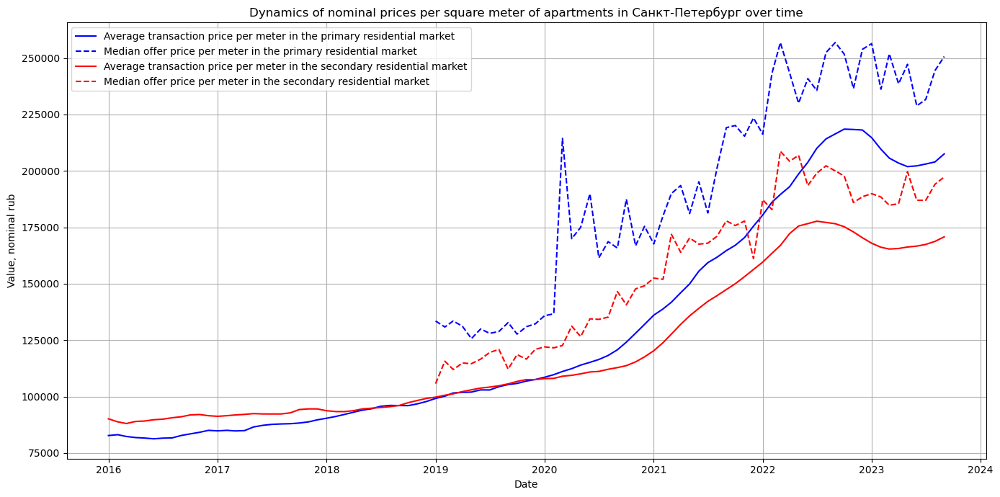

In [64]:
syv.plot_market_price_indicators(primary_deals_ts, primary_offers_ts, secondary_deals_ts, secondary_offers_ts, 'Санкт-Петербург')

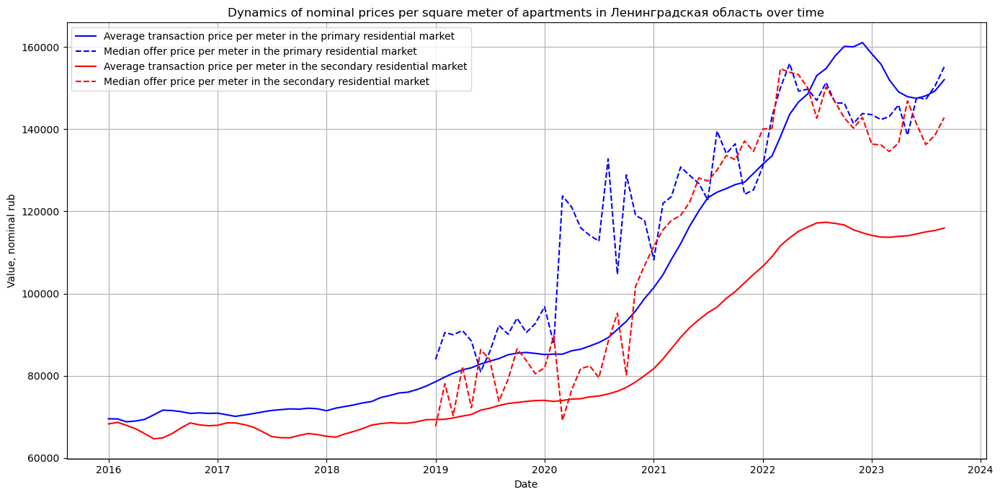

In [65]:
syv.plot_market_price_indicators(primary_deals_ts, primary_offers_ts, secondary_deals_ts, secondary_offers_ts, 'Ленинградская область')

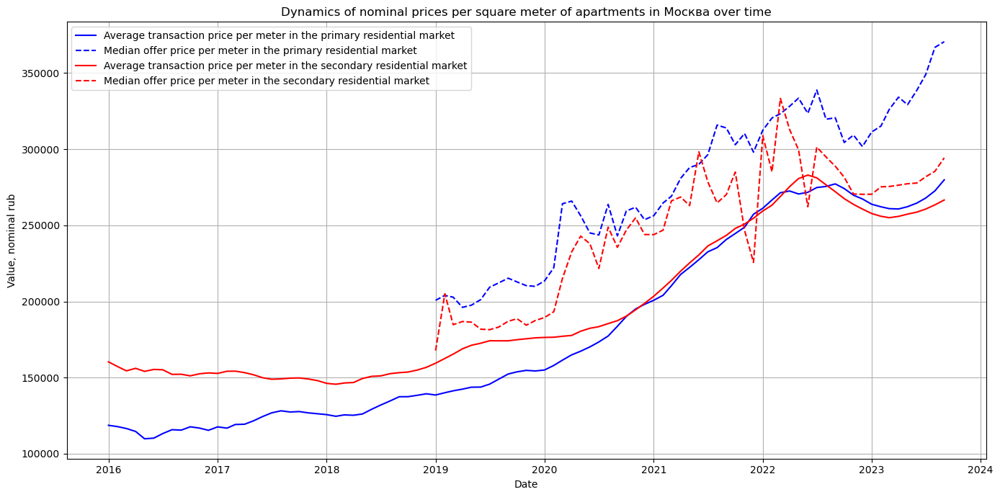

In [66]:
syv.plot_market_price_indicators(primary_deals_ts, primary_offers_ts, secondary_deals_ts, secondary_offers_ts, 'Москва')

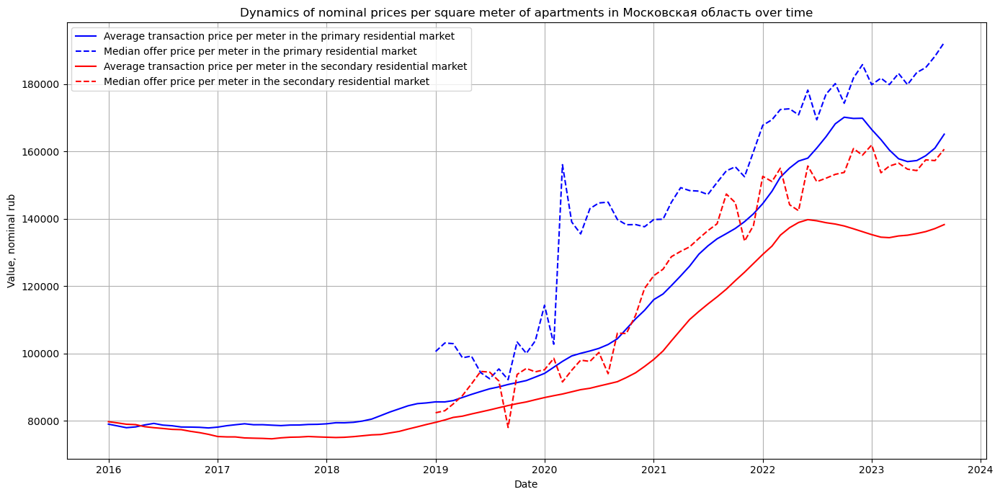

In [67]:
syv.plot_market_price_indicators(primary_deals_ts, primary_offers_ts, secondary_deals_ts, secondary_offers_ts, 'Московская область')

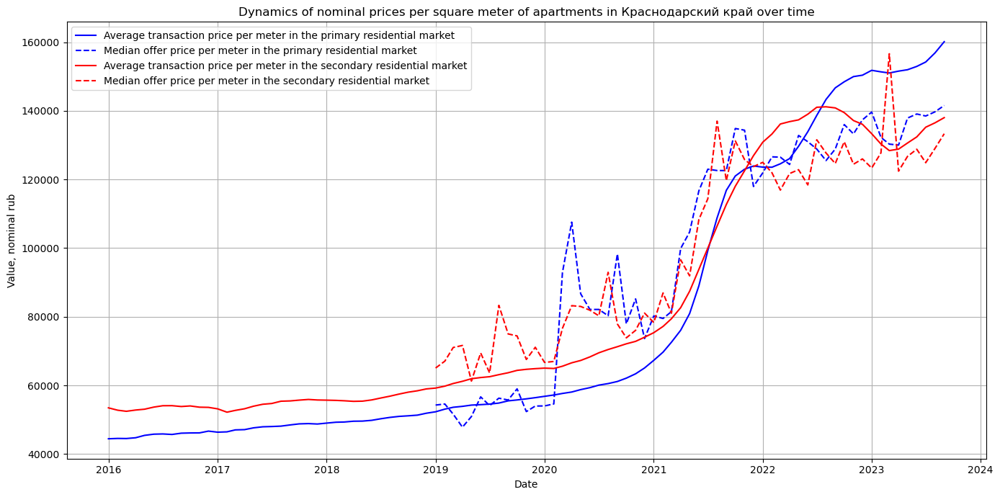

In [68]:
syv.plot_market_price_indicators(primary_deals_ts, primary_offers_ts, secondary_deals_ts, secondary_offers_ts, 'Краснодарский край')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [69]:
syv.save_prices_plots(primary_deals_ts, primary_offers_ts,\
                      secondary_deals_ts, secondary_offers_ts,\
                      column_name='value')

#### 5.2.2. Объёмы

Построим графики динамики объёмов в лотах для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

In [70]:
volume_labels = ['Primary market', 'Secondary market']

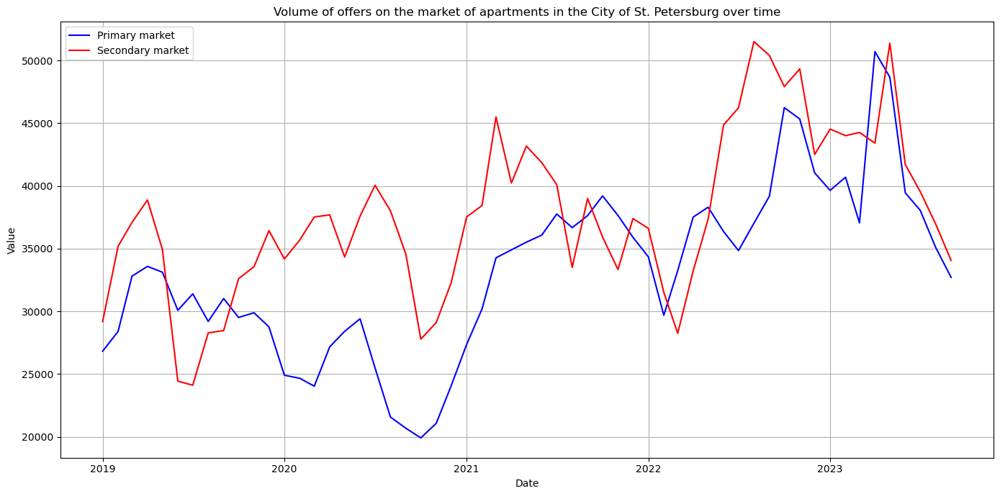

In [71]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts, region_name='Санкт-Петербург',\
                           labels=volume_labels, colors=['blue', 'red'],\
                           linestyles=['-', '-'], title=f'Volume of offers on the market of apartments in the City of St. Petersburg over time')

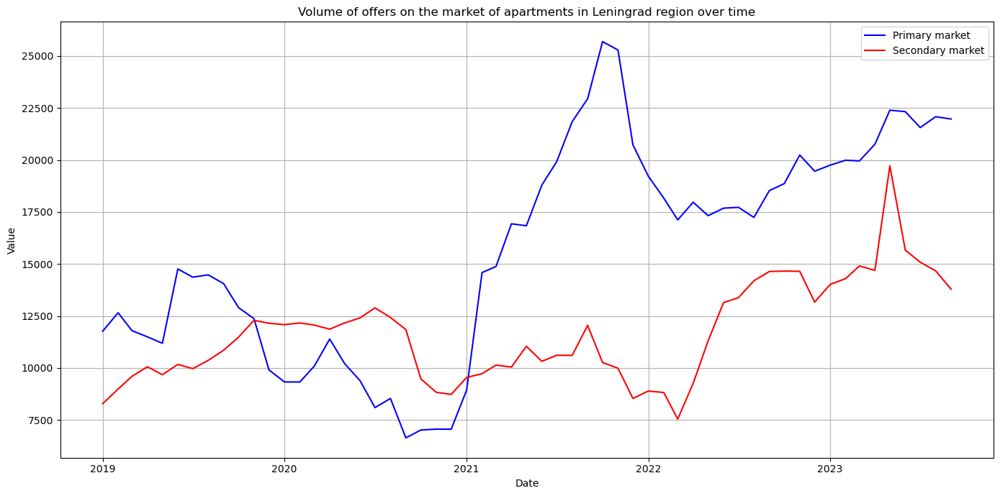

In [72]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts, region_name='Ленинградская область',\
                           labels=volume_labels, colors=['blue', 'red'],\
                           linestyles=['-', '-'], title=f'Volume of offers on the market of apartments in Leningrad region over time')

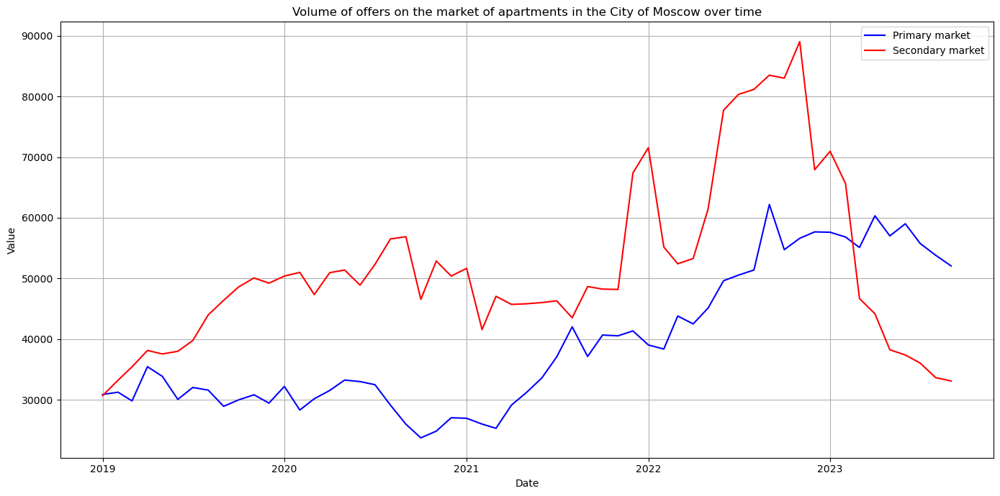

In [73]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts, region_name='Москва',\
                           labels=volume_labels, colors=['blue', 'red'],\
                           linestyles=['-', '-'], title=f'Volume of offers on the market of apartments in the City of Moscow over time')

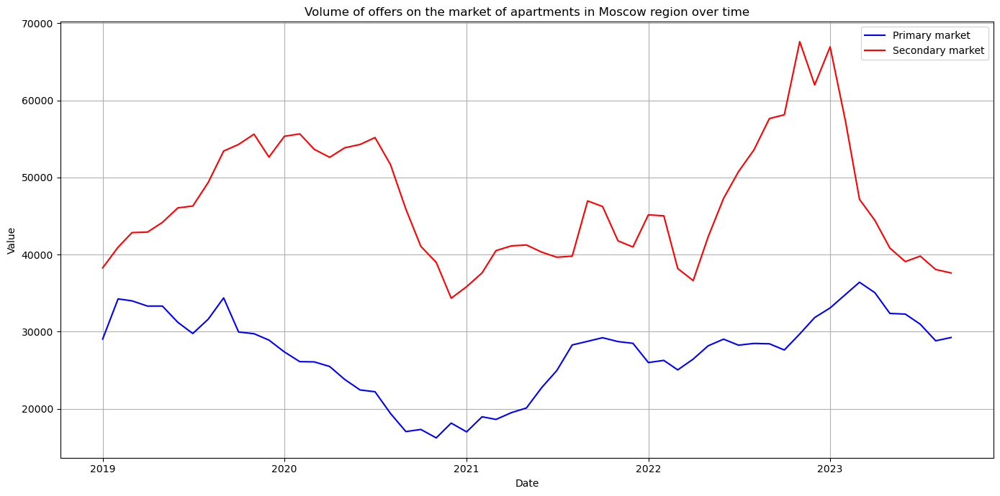

In [74]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts, region_name='Московская область',\
                           labels=volume_labels, colors=['blue', 'red'],\
                           linestyles=['-', '-'], title=f'Volume of offers on the market of apartments in Moscow region over time')

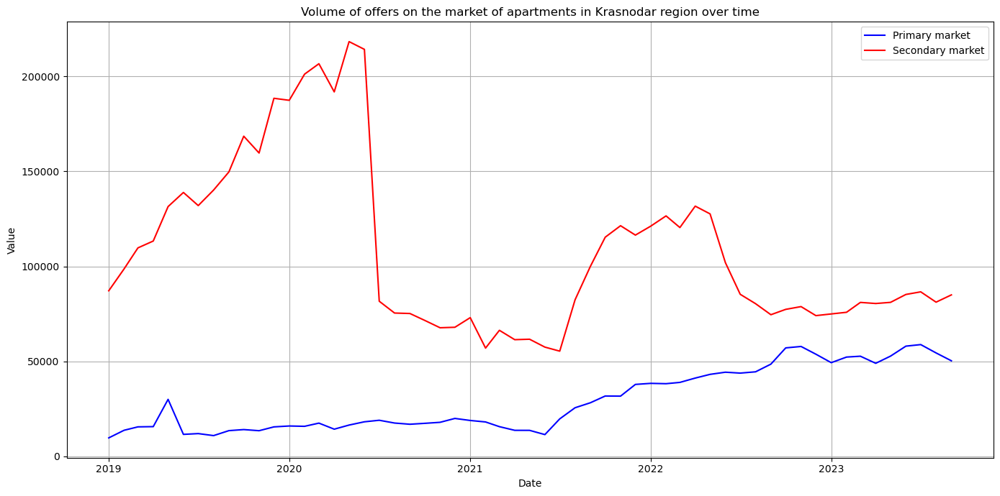

In [75]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts, region_name='Краснодарский край',\
                           labels=volume_labels, colors=['blue', 'red'],\
                           linestyles=['-', '-'], title=f'Volume of offers on the market of apartments in Krasnodar region over time')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).


In [76]:
syv.save_volumes_plots(primary_volumes_ts,\
                       secondary_volumes_ts,\
                       column_name='value')

#### 5.2.3. Сроки экпозиции на вторичных рынках

Построим графики динамики сроков экпозиции на вторичных рынках для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

In [77]:
exposure_labels = ['Secondary market']

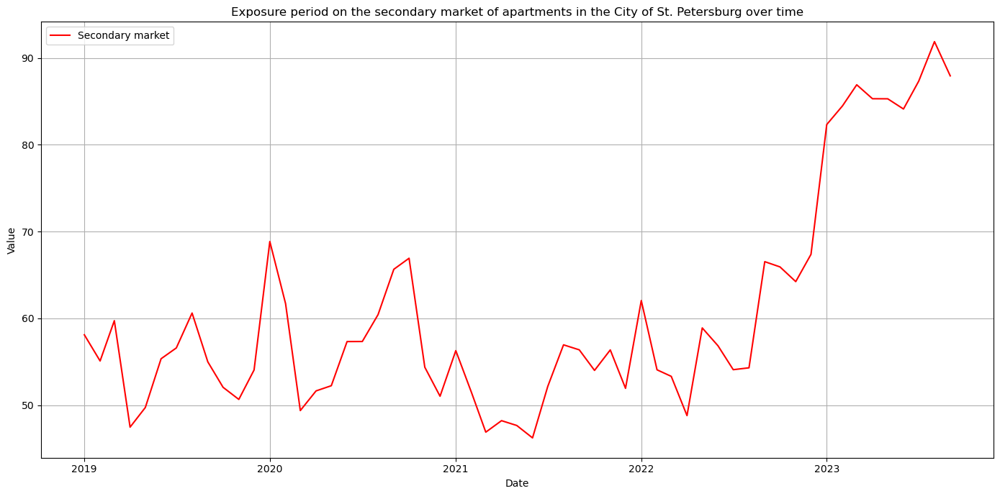

In [78]:
syv.plot_market_indicators(secondary_exposure_ts, region_name='Санкт-Петербург',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'], title=f'Exposure period on the secondary market of apartments in the City of St. Petersburg over time')

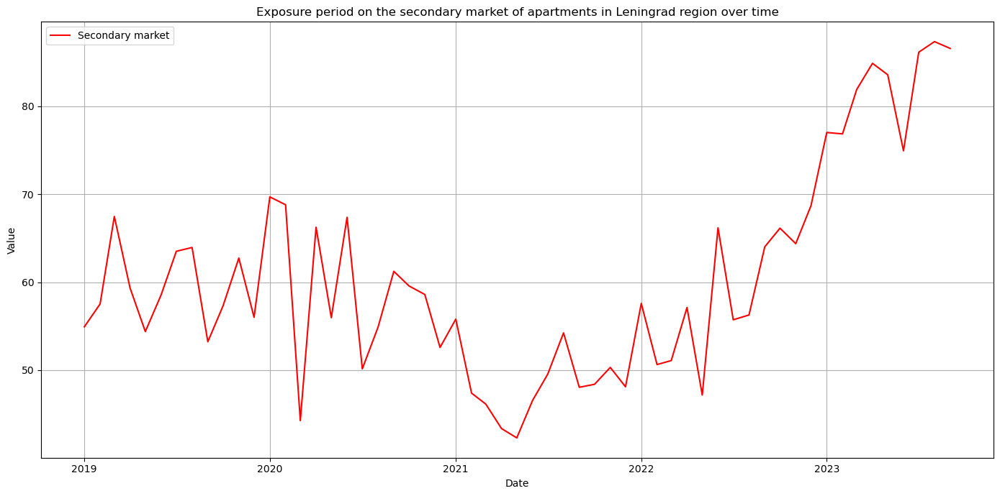

In [79]:
syv.plot_market_indicators(secondary_exposure_ts, region_name='Ленинградская область',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'], title=f'Exposure period on the secondary market of apartments in Leningrad region over time')

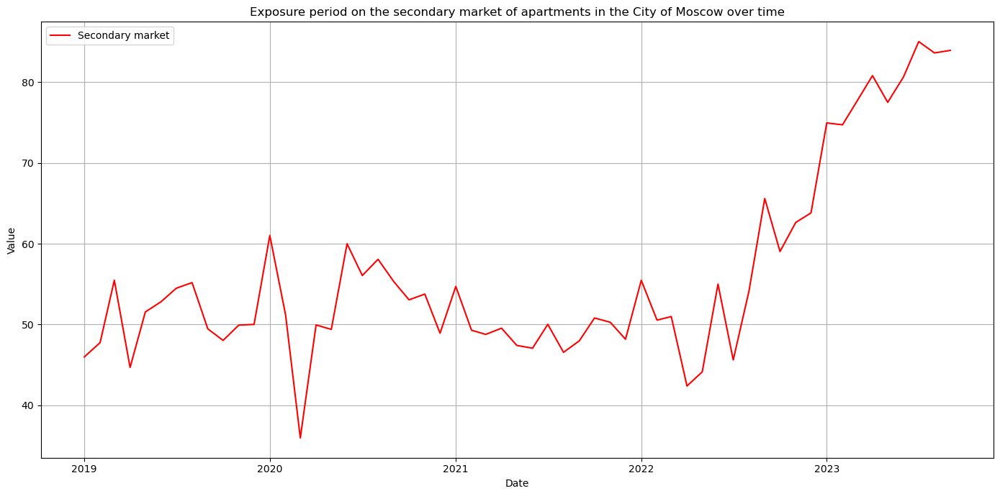

In [80]:
syv.plot_market_indicators(secondary_exposure_ts, region_name='Москва',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'], title=f'Exposure period on the secondary market of apartments in the City of Moscow over time')

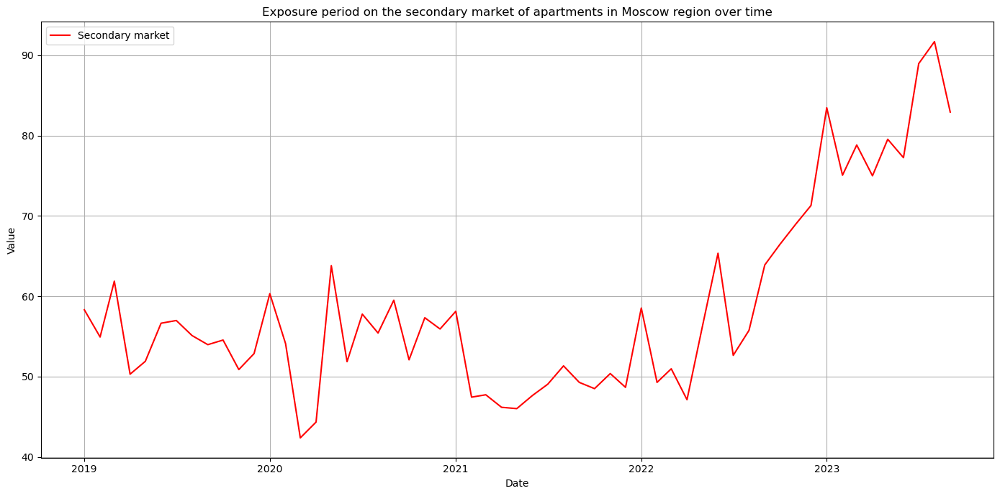

In [81]:
syv.plot_market_indicators(secondary_exposure_ts, region_name='Московская область',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'], title=f'Exposure period on the secondary market of apartments in Moscow region over time')

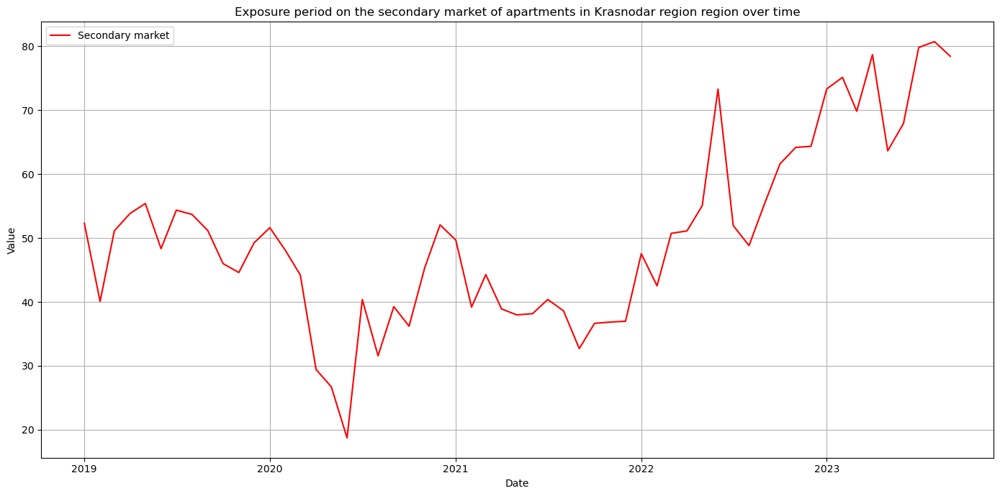

In [82]:
syv.plot_market_indicators(secondary_exposure_ts, region_name='Краснодарский край',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'], title=f'Exposure period on the secondary market of apartments in Krasnodar region region over time')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [83]:
syv.save_exposure_plots(secondary_exposure_ts,\
                       column_name='value')

#### 5.2.4. Скидки при переходе от цен предложений к ценам сделок

Построим графики динамики скидок при переходе от цен предложений к ценам сделок для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

In [84]:
discounts_labels = ['Primary Market',\
                   'Secondary market']

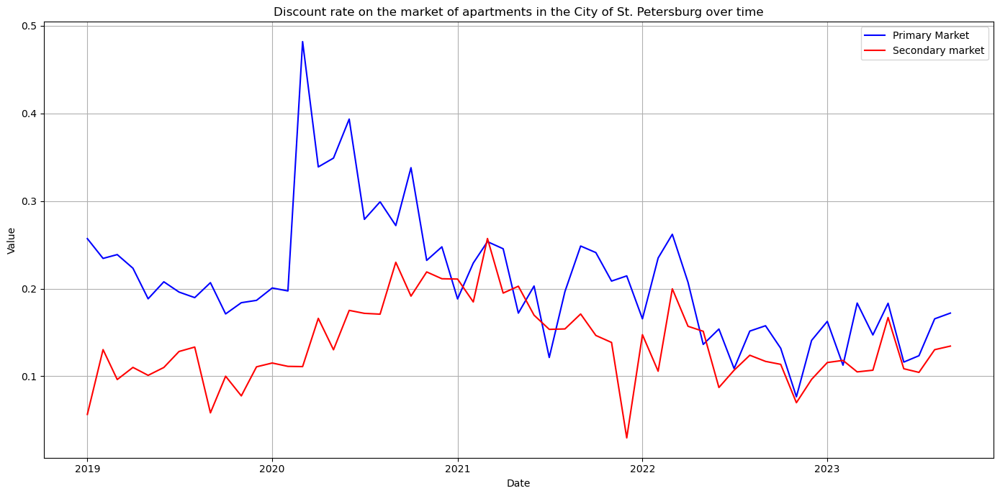

In [85]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts, region_name='Санкт-Петербург',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in the City of St. Petersburg over time')

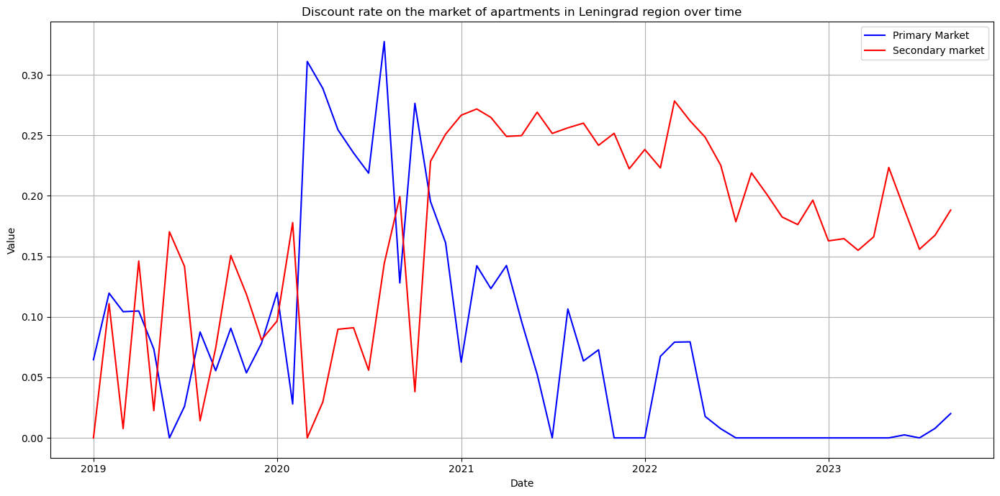

In [86]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts, region_name='Ленинградская область',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in Leningrad region over time')

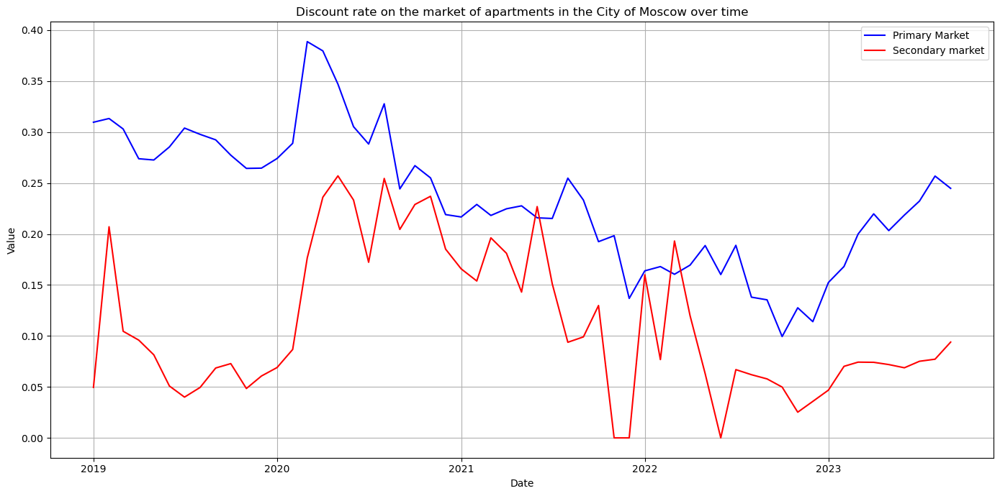

In [87]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts, region_name='Москва',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in the City of Moscow over time')

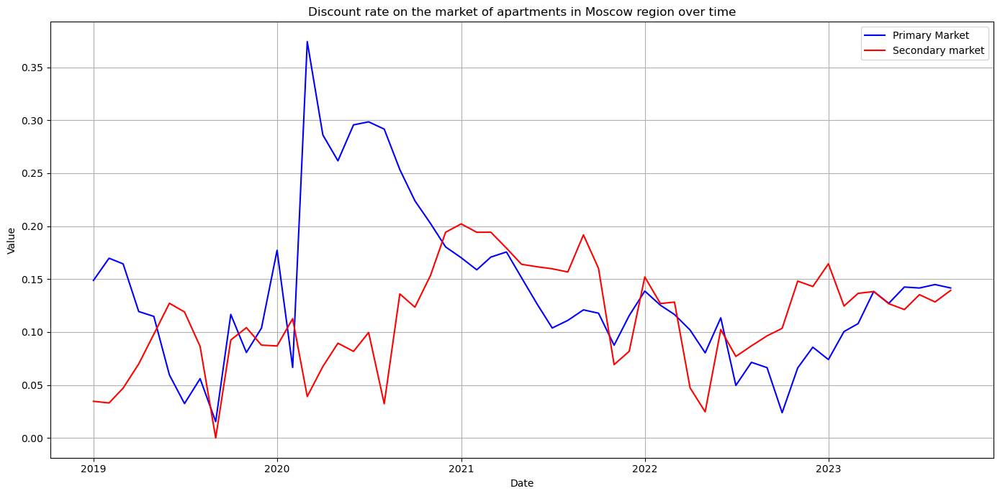

In [88]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts, region_name='Московская область',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in Moscow region over time')

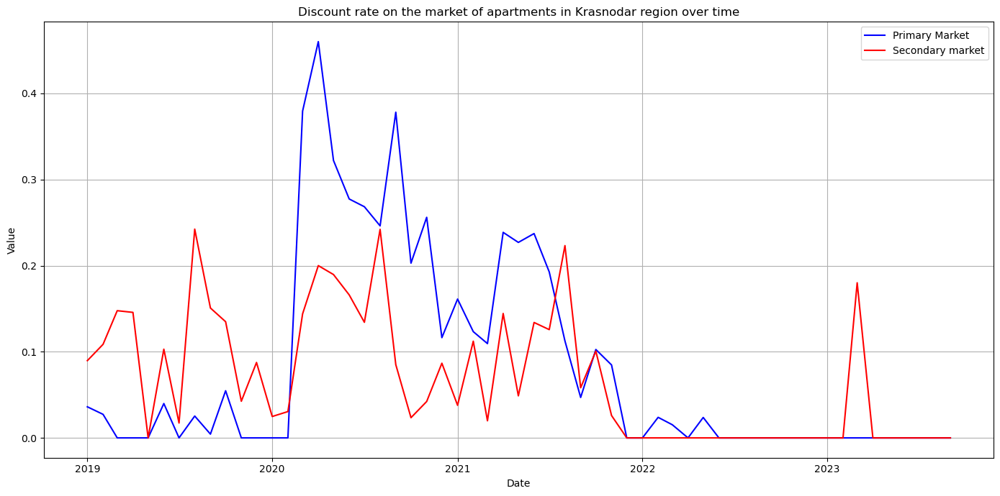

In [89]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts, region_name='Краснодарский край',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in Krasnodar region over time')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [90]:
syv.save_discounts_plots(primary_discount_rates_ts,\
                         secondary_discount_rates_ts,\
                         column_name='value')

#### 5.2.5. Соотношения показателей первичного и вторичного рынков

Построим графики соотношений индикаторов цен, объёмов и скидок первичного и вторичного рынков пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край. При расчёте показателя соотношения данные первичного рынка используются в числителе, таким образом значение показателя, например, в 1.21 означает, что значение индикатора первичного рынка больше на 0.21 относительно аналогичного индикатора вторичного рынка.

In [91]:
ratios_labels_1 = ['Deals',\
                  'Offers']
ratios_labels_2 = ['Offers']
ratios_labels_3 = ['Mean deal price/Median offer price']

##### 5.2.5.1. Соотношения индикаторов цен

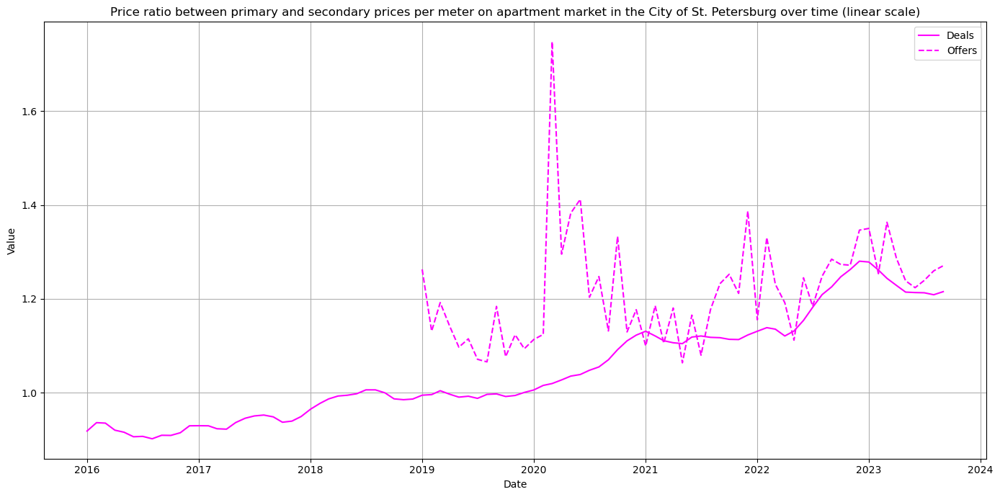

In [92]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts, region_name='Санкт-Петербург',\
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],\
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in the City of St. Petersburg over time (linear scale)')

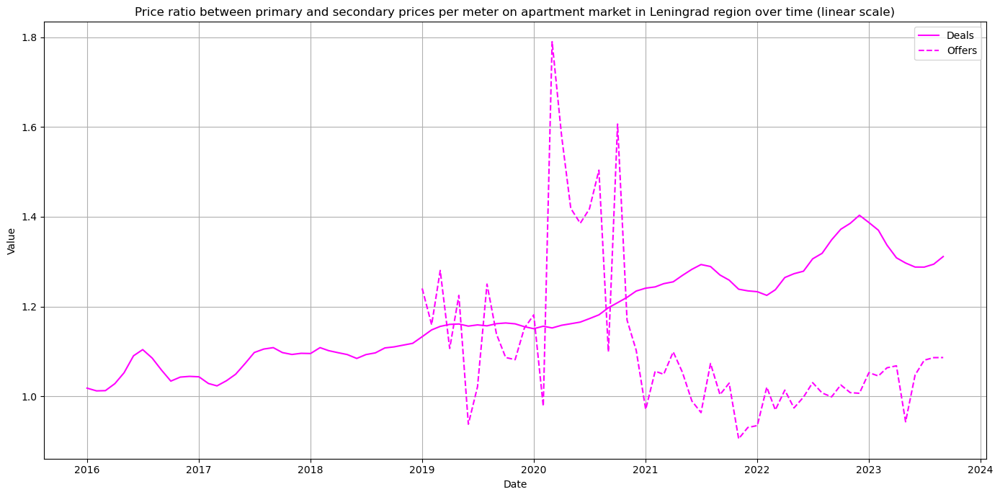

In [93]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts, region_name='Ленинградская область',\
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],\
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Leningrad region over time (linear scale)')

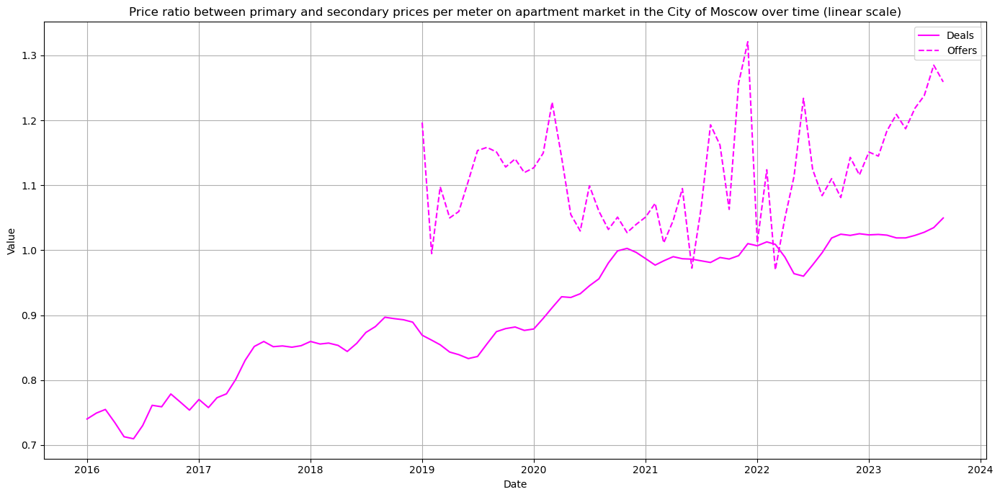

In [94]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts, region_name='Москва',\
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],\
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in the City of Moscow over time (linear scale)')

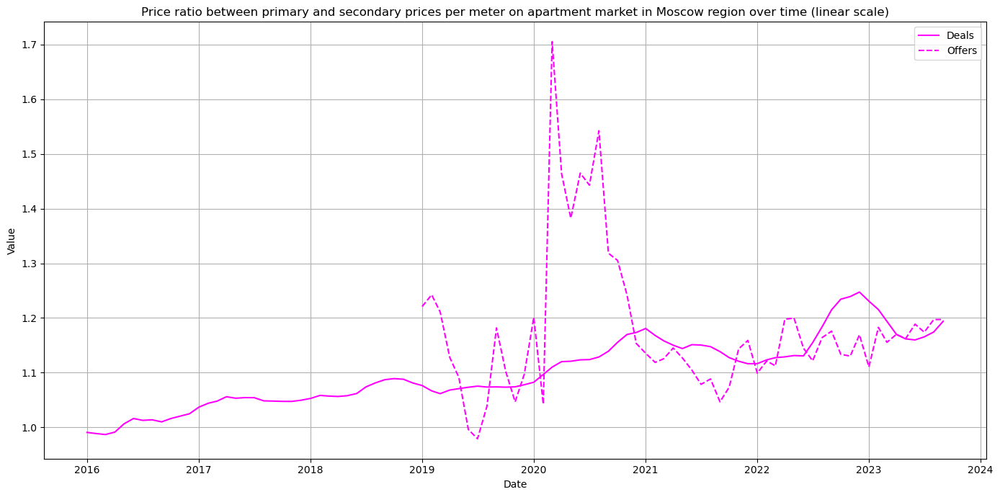

In [95]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts, region_name='Московская область',\
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],\
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Moscow region over time (linear scale)')

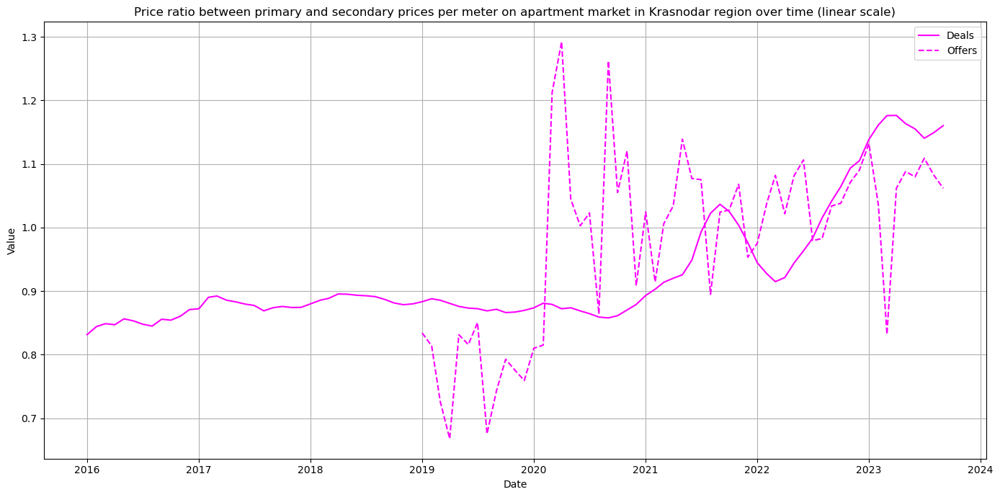

In [96]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts, region_name='Краснодарский край',\
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],\
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [97]:
syv.save_price_ratios_plots(deals_ratios_ts,\
                         offers_ratios_ts,\
                         column_name='value')

##### 5.2.5.2. Соотношения индикаторов объёмов

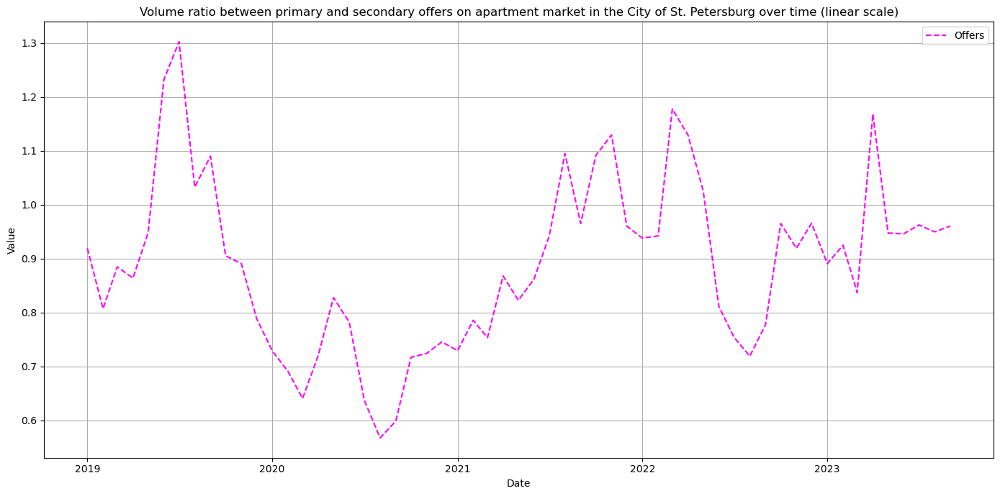

In [98]:
syv.plot_market_indicators(volumes_ratios_ts, region_name='Санкт-Петербург',\
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],\
                           title=f'Volume ratio between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

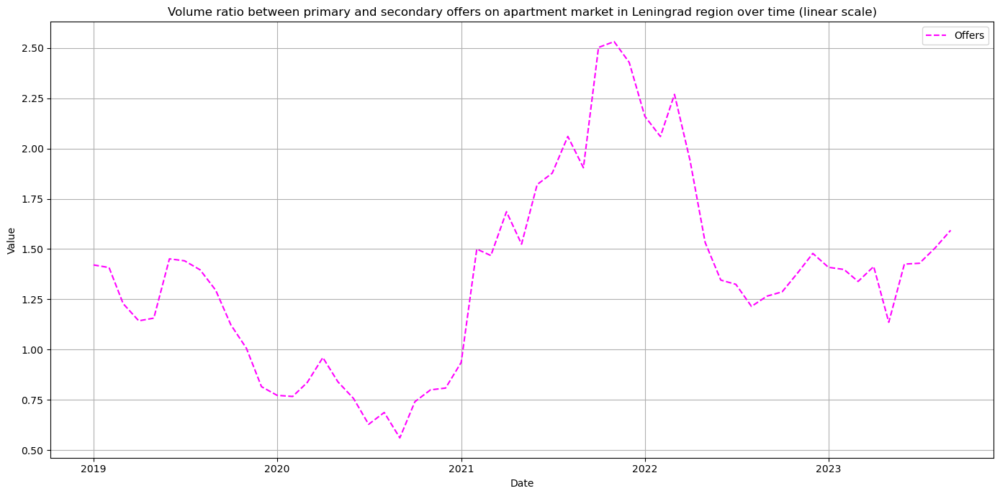

In [99]:
syv.plot_market_indicators(volumes_ratios_ts, region_name='Ленинградская область',\
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],\
                           title=f'Volume ratio between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

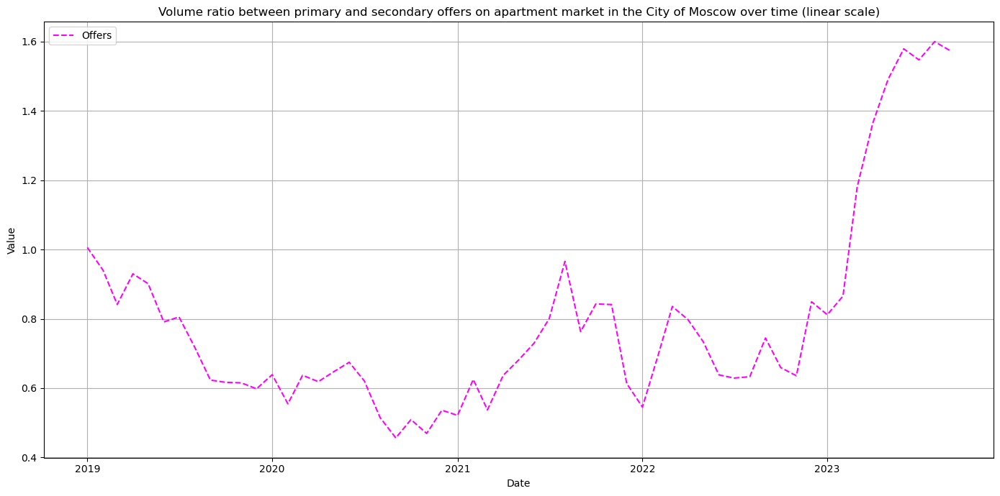

In [100]:
syv.plot_market_indicators(volumes_ratios_ts, region_name='Москва',\
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],\
                           title=f'Volume ratio between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

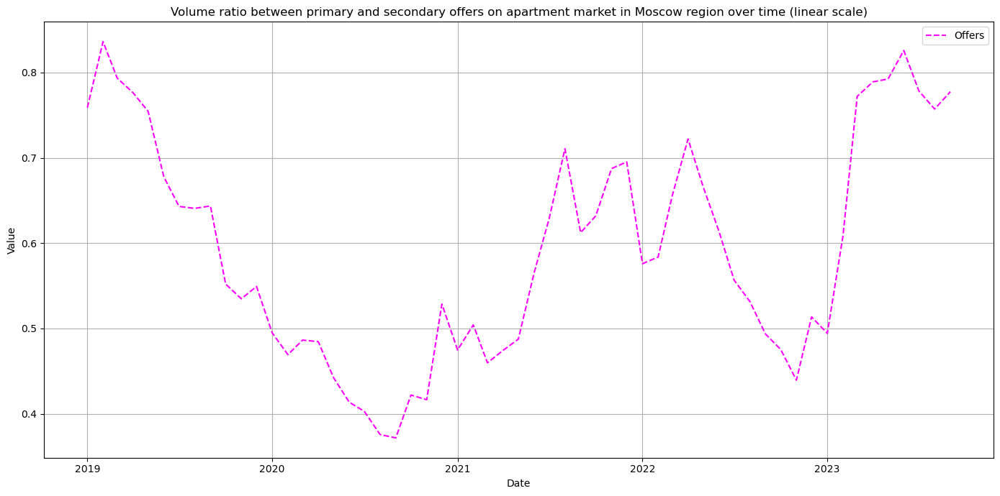

In [101]:
syv.plot_market_indicators(volumes_ratios_ts, region_name='Московская область',\
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],\
                           title=f'Volume ratio between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

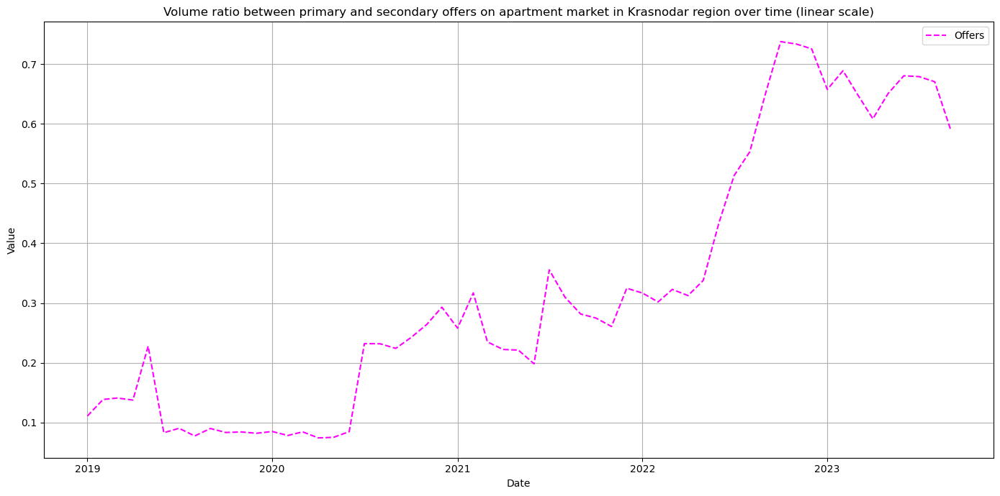

In [102]:
syv.plot_market_indicators(volumes_ratios_ts, region_name='Краснодарский край',\
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],\
                           title=f'Volume ratio between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [103]:
syv.save_volume_ratios_plots(volumes_ratios_ts,\
                           column_name='value')

##### 5.2.5.3. Соотношения индикаторов скидок

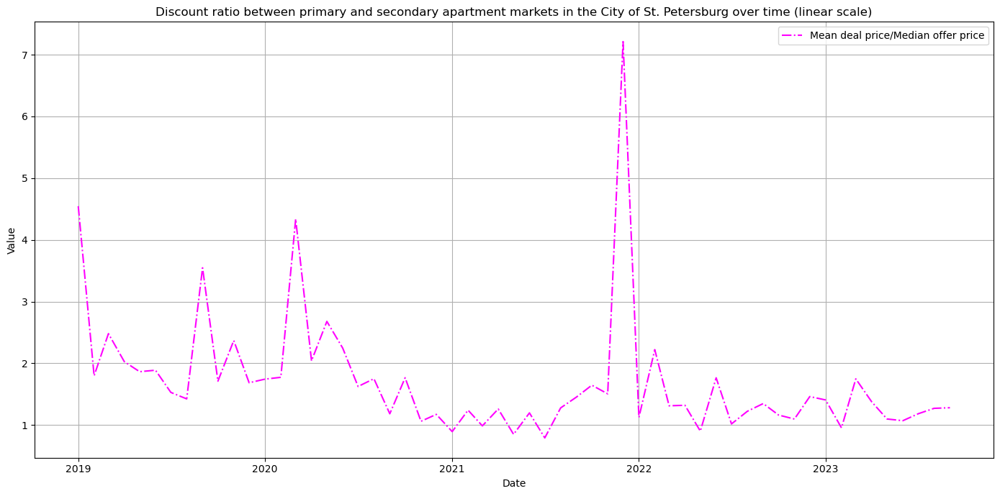

In [104]:
syv.plot_market_indicators(discounts_ratios_ts, region_name='Санкт-Петербург',\
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],\
                           title=f'Discount ratio between primary and secondary apartment markets in the City of St. Petersburg over time (linear scale)')

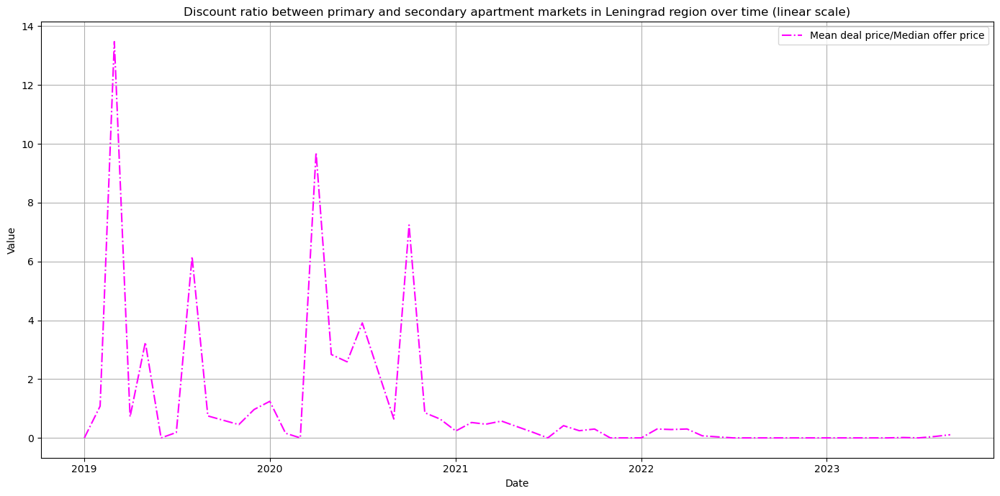

In [105]:
syv.plot_market_indicators(discounts_ratios_ts, region_name='Ленинградская область',\
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],\
                           title=f'Discount ratio between primary and secondary apartment markets in Leningrad region over time (linear scale)')

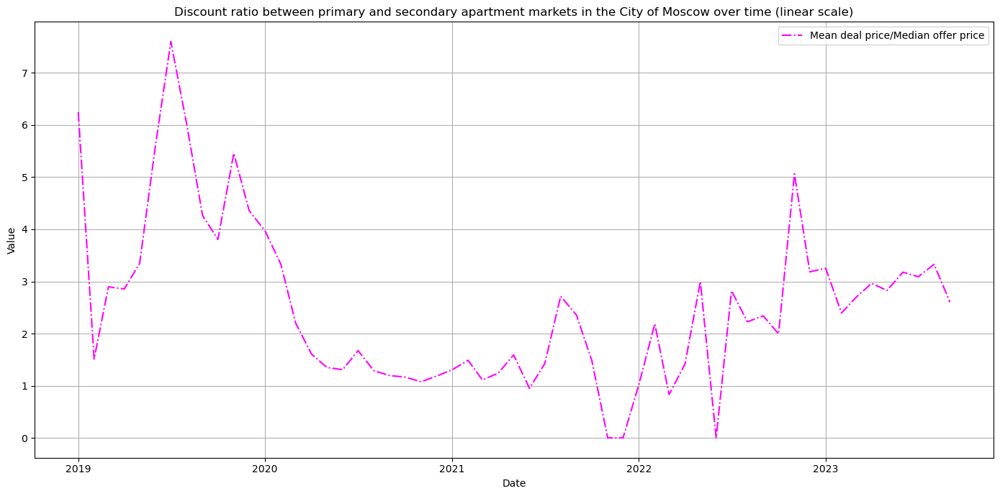

In [106]:
syv.plot_market_indicators(discounts_ratios_ts, region_name='Москва',\
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],\
                           title=f'Discount ratio between primary and secondary apartment markets in the City of Moscow over time (linear scale)')

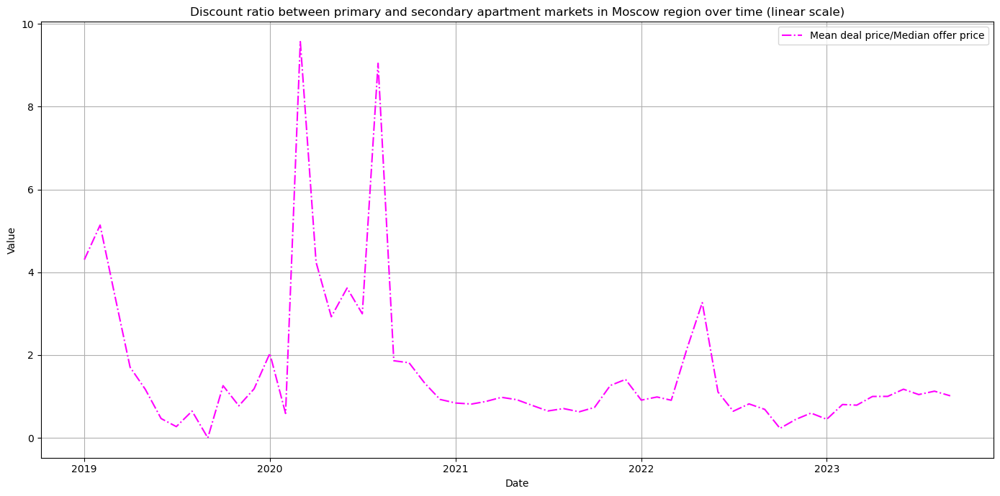

In [107]:
syv.plot_market_indicators(discounts_ratios_ts, region_name='Московская область',\
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],\
                           title=f'Discount ratio between primary and secondary apartment markets in Moscow region over time (linear scale)')

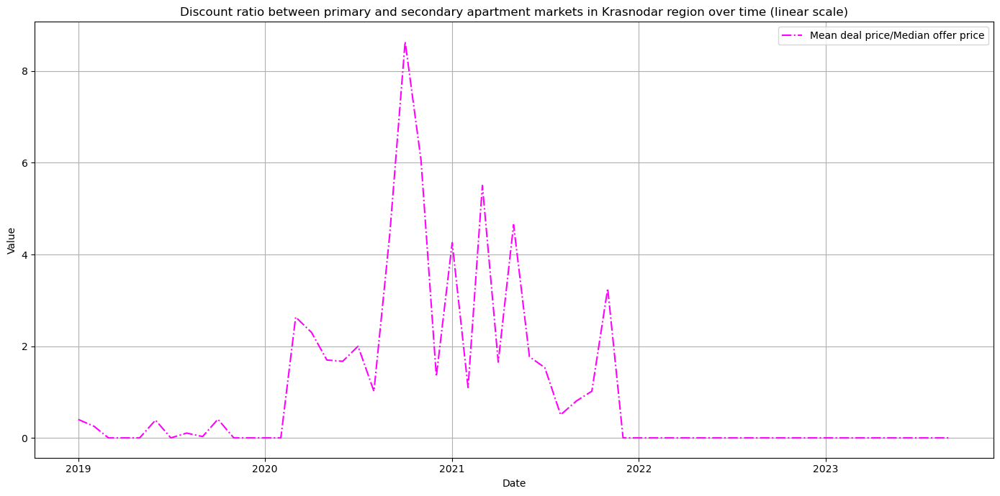

In [108]:
syv.plot_market_indicators(discounts_ratios_ts, region_name='Краснодарский край',\
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],\
                           title=f'Discount ratio between primary and secondary apartment markets in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [109]:
syv.save_discount_ratios_plots(discounts_ratios_ts,\
                           column_name='value')

#### 5.2.6. Гэпы между индикаторами первичного и вторичного рынков

Построим графики гэпов между индикаторми цен, объёмов и скидок первичного и вторичного рынков пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край. При расчёте показателя соотношения данные первичного рынка используются в уменьшаемом, таким образом значение показателя больше нуля означает, что значение индикатора первичного рынка больше аналогичного индикатора вторичного рынка.

In [110]:
gaps_labels_1 = ['Deals',\
                  'Offers']
gaps_labels_2 = ['Offers']
gaps_labels_3 = ['Mean deal price - Median offer price']

##### 5.2.6.1. Гэпы между индикаторами цен

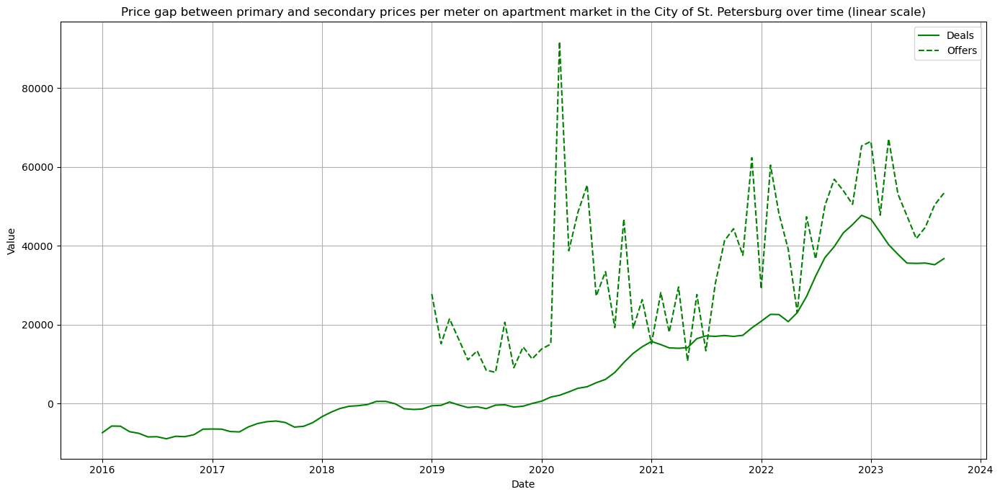

In [111]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts, region_name='Санкт-Петербург',\
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],\
                           title=f'Price gap between primary and secondary prices per meter on apartment market in the City of St. Petersburg over time (linear scale)')

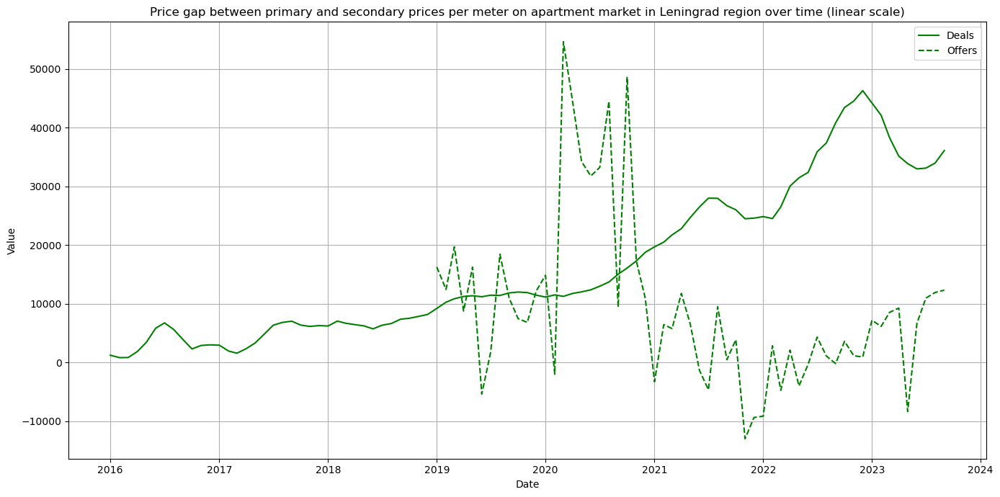

In [112]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts, region_name='Ленинградская область',\
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],\
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Leningrad region over time (linear scale)')

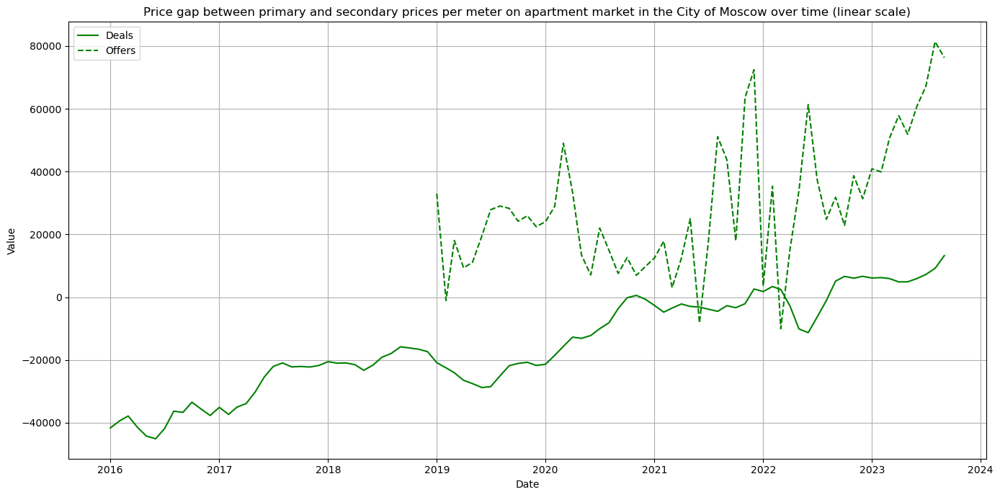

In [113]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts, region_name='Москва',\
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],\
                           title=f'Price gap between primary and secondary prices per meter on apartment market in the City of Moscow over time (linear scale)')

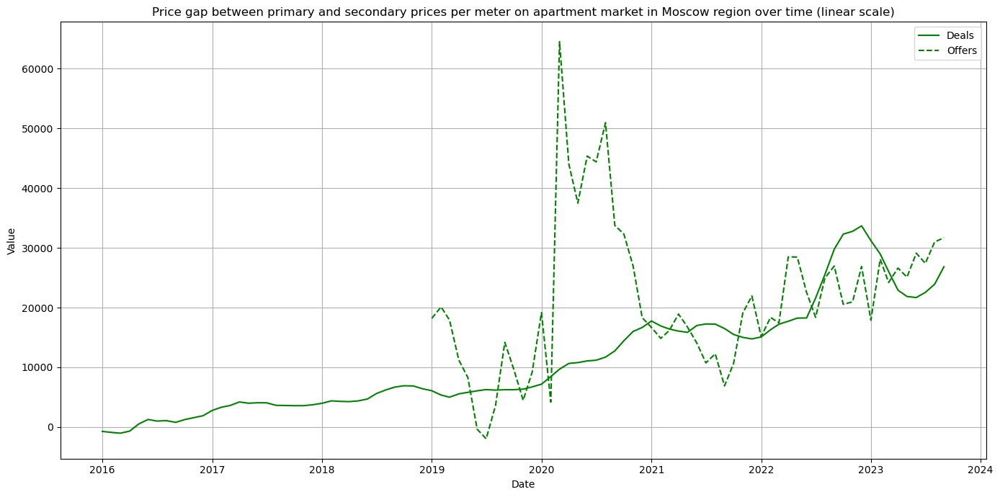

In [114]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts, region_name='Московская область',\
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],\
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Moscow region over time (linear scale)')

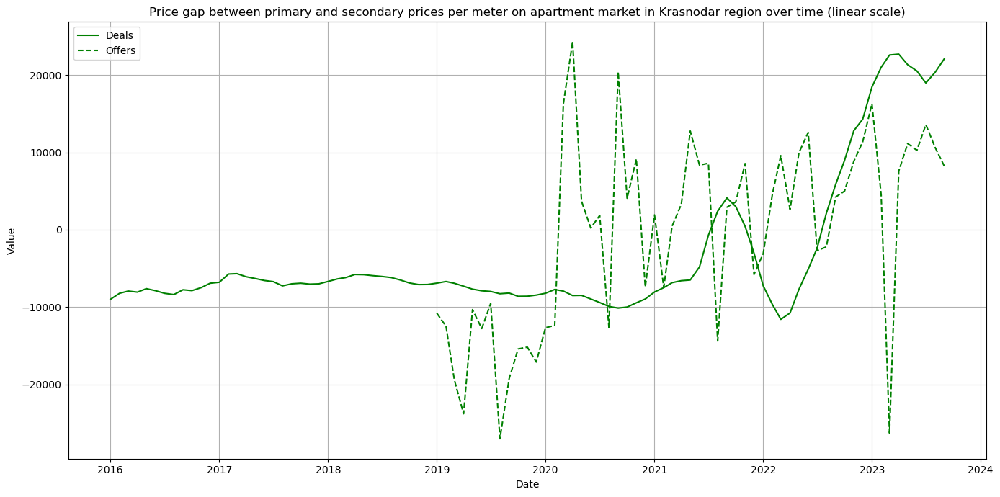

In [115]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts, region_name='Краснодарский край',\
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],\
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [116]:
syv.save_price_gaps_plots(deals_gaps_ts,\
                         offers_gaps_ts,\
                         column_name='value')

##### 5.2.6.2. Гэпы между индикаторами объёма

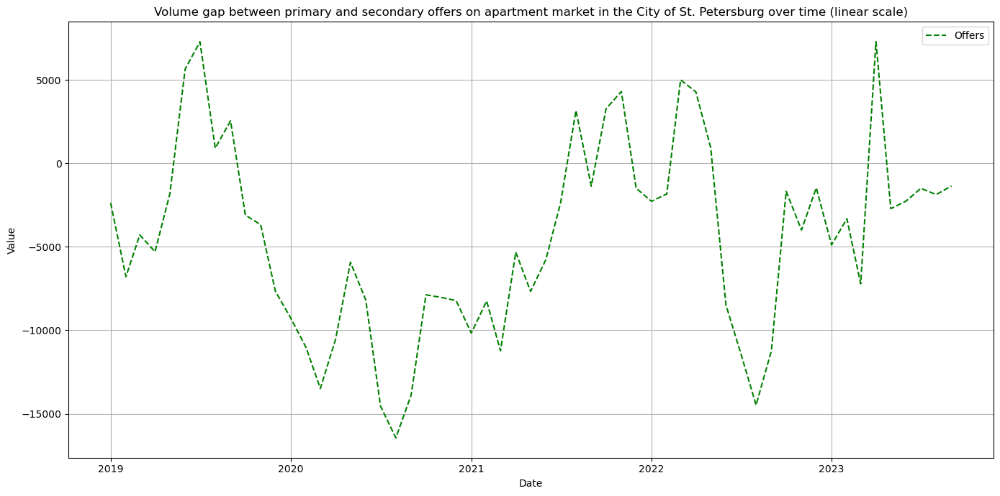

In [117]:
syv.plot_market_indicators(volumes_gaps_ts, region_name='Санкт-Петербург',\
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],\
                           title=f'Volume gap between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

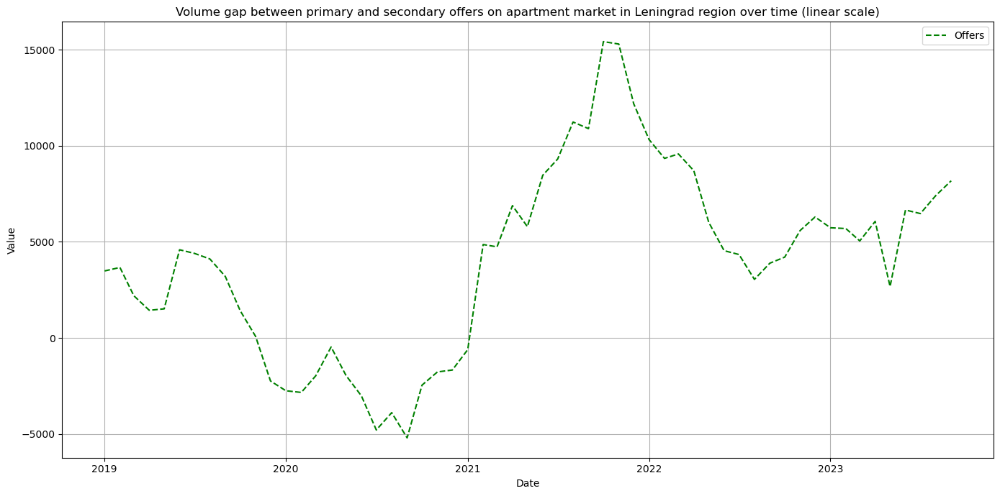

In [118]:
syv.plot_market_indicators(volumes_gaps_ts, region_name='Ленинградская область',\
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],\
                           title=f'Volume gap between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

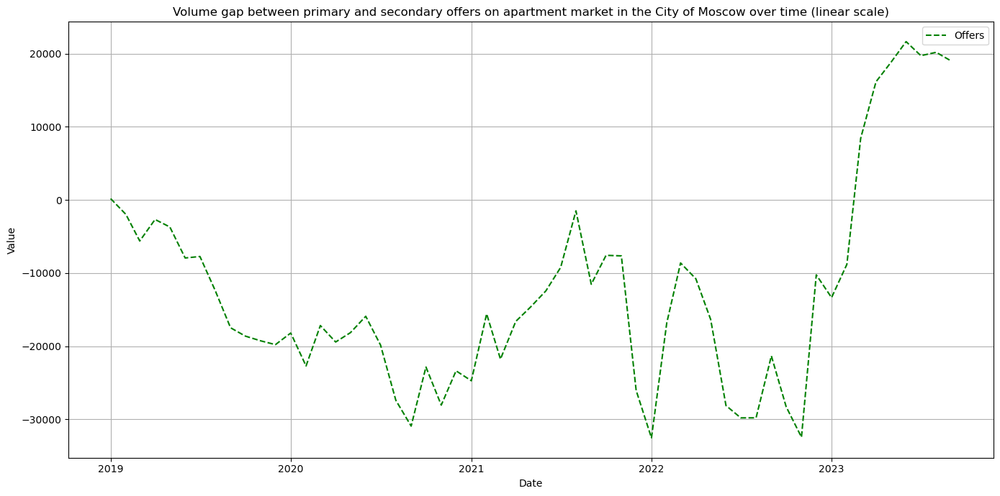

In [119]:
syv.plot_market_indicators(volumes_gaps_ts, region_name='Москва',\
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],\
                           title=f'Volume gap between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

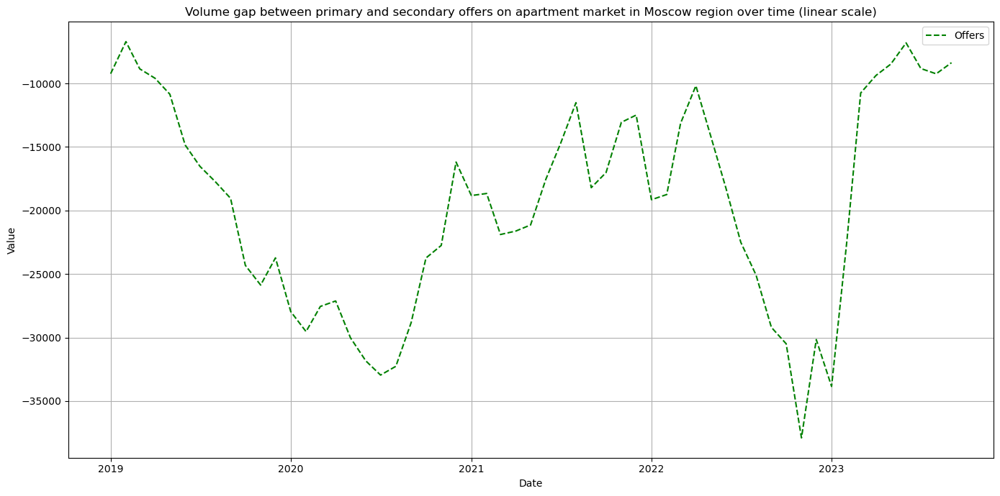

In [120]:
syv.plot_market_indicators(volumes_gaps_ts, region_name='Московская область',\
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],\
                           title=f'Volume gap between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

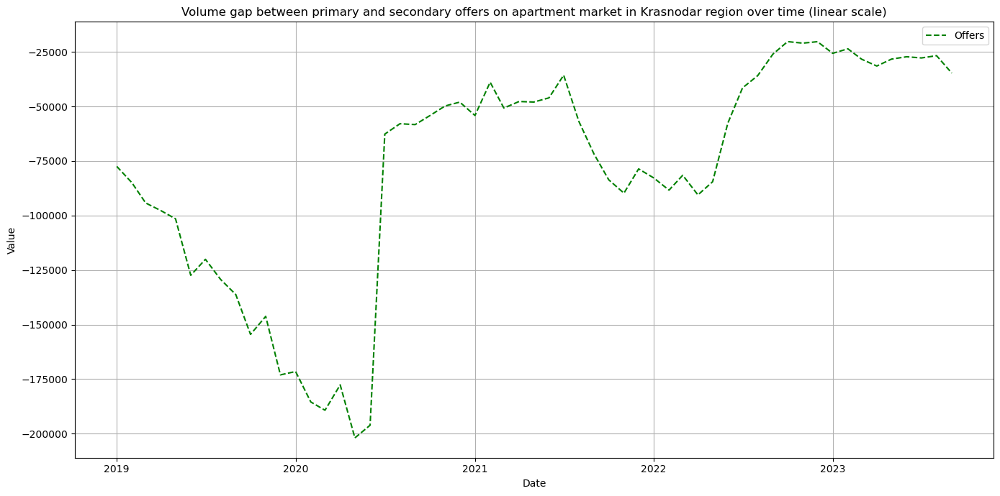

In [121]:
syv.plot_market_indicators(volumes_gaps_ts, region_name='Краснодарский край',\
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],\
                           title=f'Volume gap between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [122]:
syv.save_volume_gaps_plots(volumes_gaps_ts,\
                          column_name='value')

##### 5.2.6.3. Гэпы между индикаторами скидок

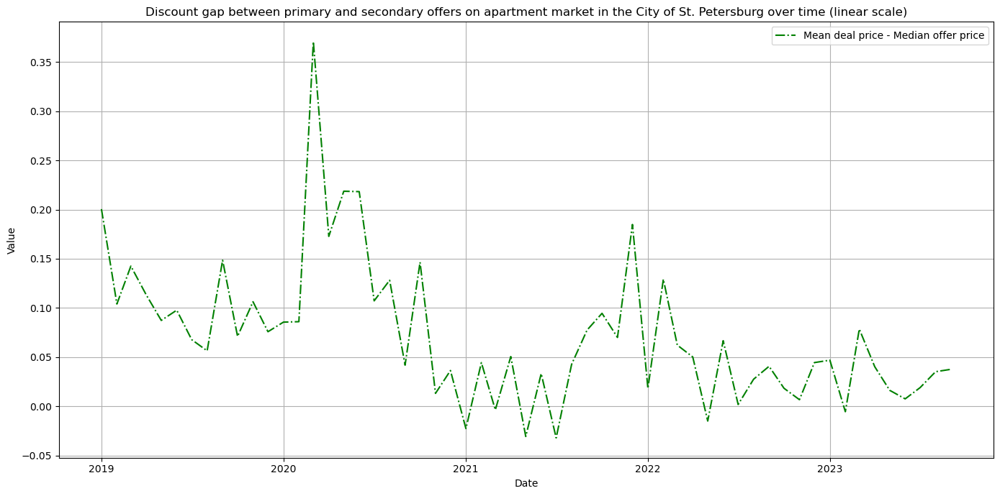

In [123]:
syv.plot_market_indicators(discounts_gaps_ts, region_name='Санкт-Петербург',\
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],\
                           title=f'Discount gap between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

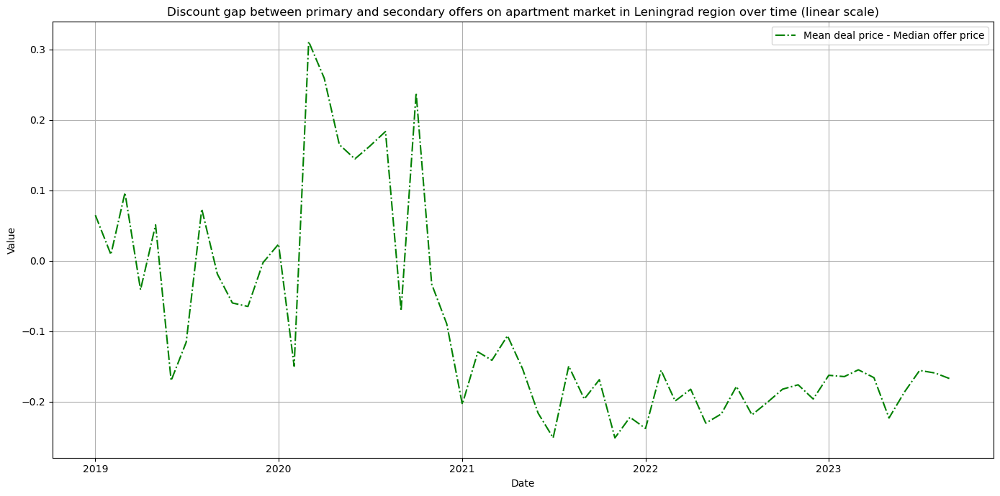

In [124]:
syv.plot_market_indicators(discounts_gaps_ts, region_name='Ленинградская область',\
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],\
                           title=f'Discount gap between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

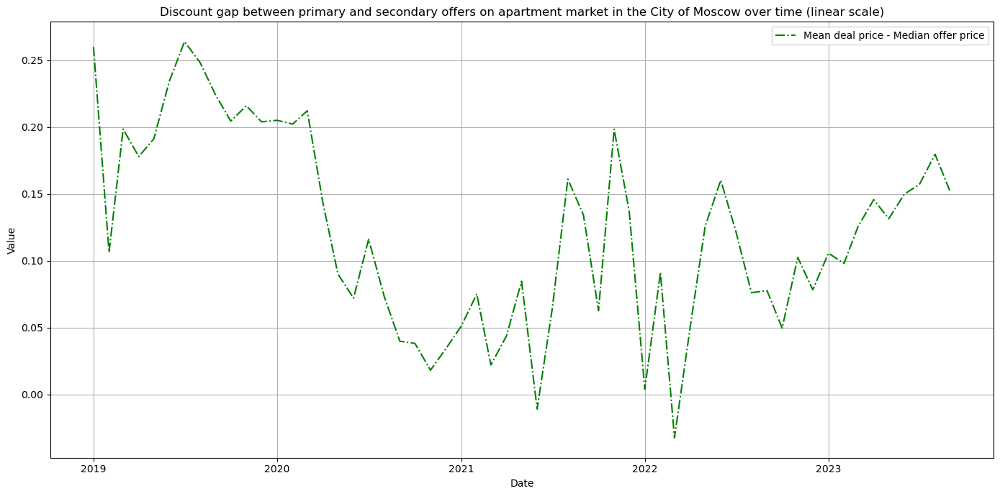

In [125]:
syv.plot_market_indicators(discounts_gaps_ts, region_name='Москва',\
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],\
                           title=f'Discount gap between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

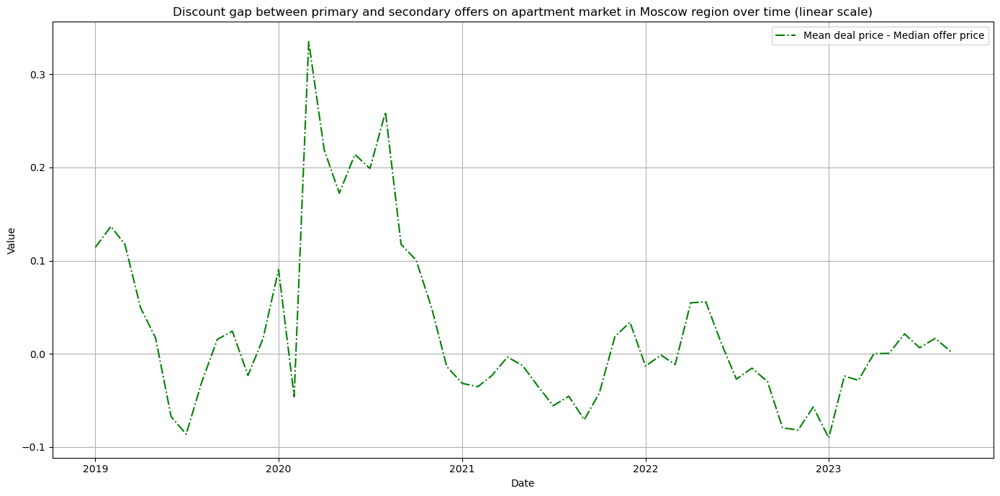

In [126]:
syv.plot_market_indicators(discounts_gaps_ts, region_name='Московская область',\
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],\
                           title=f'Discount gap between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

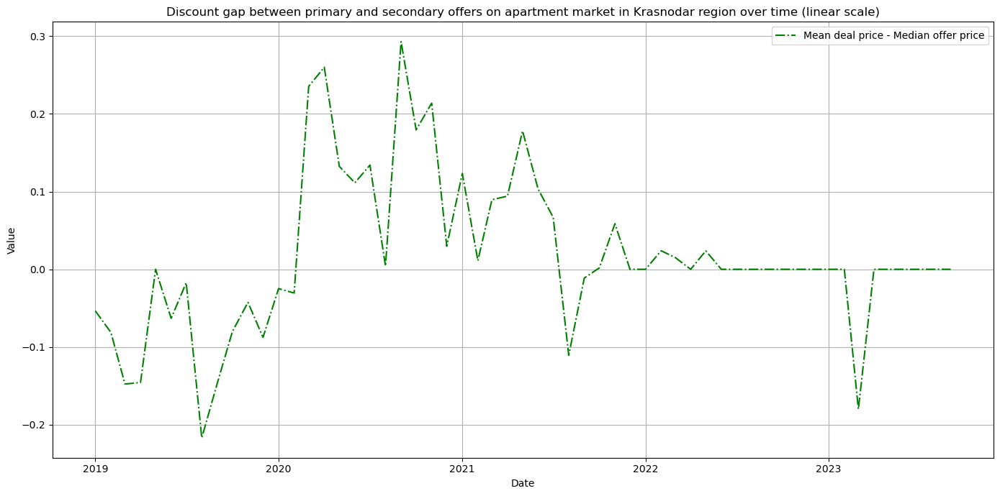

In [127]:
syv.plot_market_indicators(discounts_gaps_ts, region_name='Краснодарский край',\
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],\
                           title=f'Discount gap between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [128]:
syv.save_discount_gaps_plots(discounts_gaps_ts,\
                            column_name='value')

### 5.3. Анализ динамики неравенства регионов

График динамики коэффициента Джини для средних цен сделок и медианных цен предложений на первичном рынке.

In [129]:
labels_gini_ts_1 = ['Deals', 'Offers']
labels_gini_ts_2 = ['Primary market', 'Secondary market']
labels_gini_ts_3 = ['Secondary market']

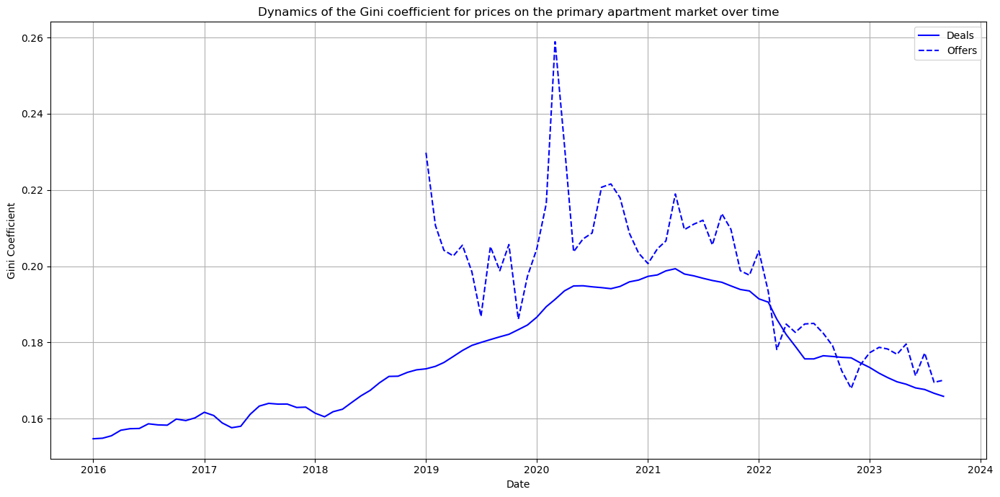

In [130]:
syv.plot_gini_ts(primary_deals_gini_ts, primary_offers_gini_ts,\
                           labels=labels_gini_ts_1, colors=['blue', 'blue'], linestyles=['-', '--'],\
                           plot_title=f'Dynamics of the Gini coefficient for prices on the primary apartment market over time')

График динамики коэффициента Джини для средних цен сделок и медианных цен предложений на вторичном рынке.

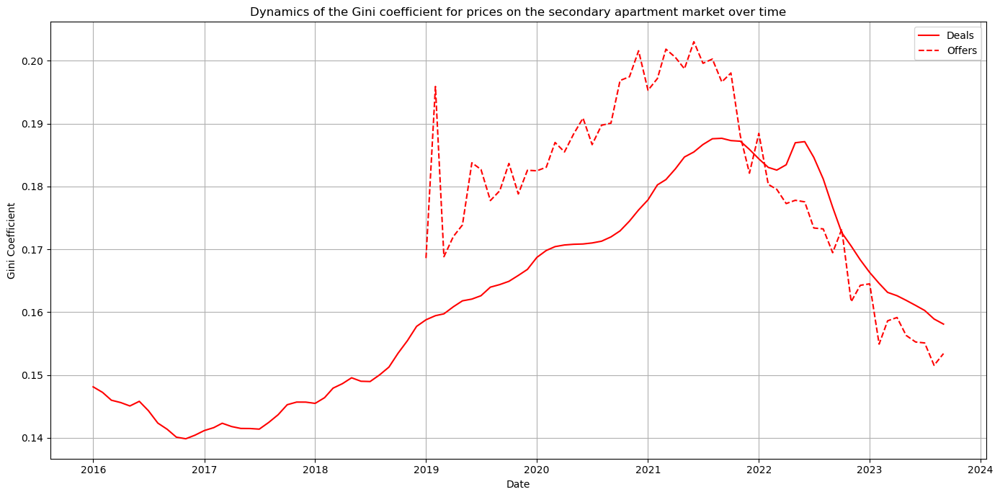

In [131]:
syv.plot_gini_ts(secondary_deals_gini_ts, secondary_offers_gini_ts,\
                           labels=labels_gini_ts_1, colors=['red', 'red'], linestyles=['-', '--'],\
                           plot_title=f'Dynamics of the Gini coefficient for prices on the secondary apartment market over time')

График динамики коэффициента Джини для объёмов предложения на первичном и вторичном рынках.

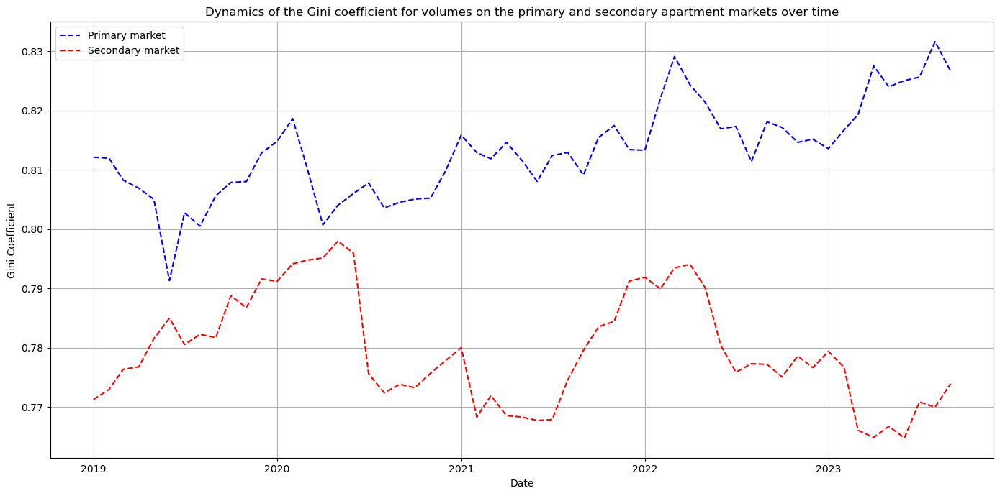

In [132]:
syv.plot_gini_ts(primary_volumes_gini_ts, secondary_volumes_gini_ts,\
                           labels=labels_gini_ts_2, colors=['blue', 'red'], linestyles=['--', '--'],\
                           plot_title=f'Dynamics of the Gini coefficient for volumes on the primary and secondary apartment markets over time')

График динамики коэффициента Джини для сроков экспозиции на вторичном рынке.

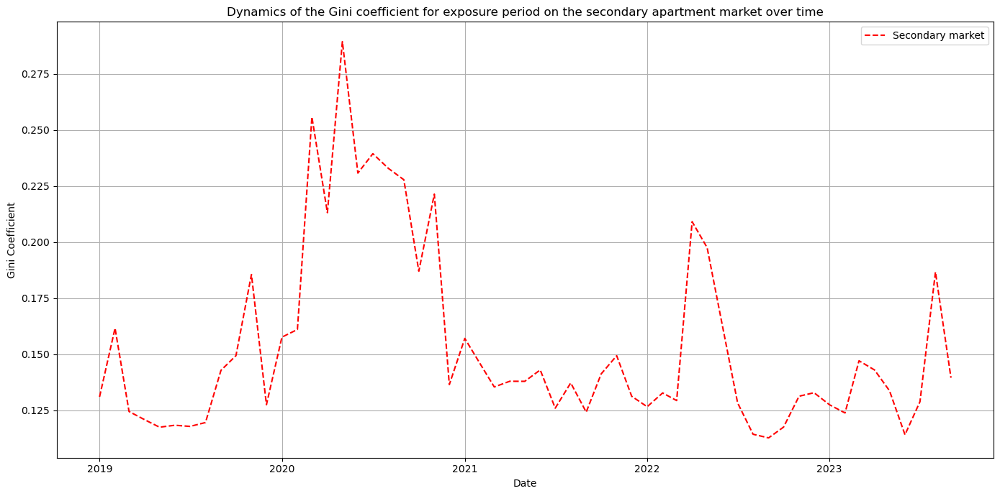

In [133]:
syv.plot_gini_ts(secondary_exposure_gini_ts,\
                           labels=labels_gini_ts_3, colors=['red'], linestyles=['--'],\
                           plot_title=f'Dynamics of the Gini coefficient for exposure period on the secondary apartment market over time')

Графики в виде файлов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [134]:
# Save plot for the primary market prices
syv.save_gini_ts_plot(primary_deals_gini_ts, primary_offers_gini_ts,
                  labels = labels_gini_ts_1,
                  file_name = 'primary_prices_gini_ts',
                  colors=['blue', 'blue'],
                  linestyles=['-', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for prices on the primary apartment market over time")

# Save plot for the secondary market prices
syv.save_gini_ts_plot(secondary_deals_gini_ts, secondary_offers_gini_ts,
                  labels = labels_gini_ts_1,
                  file_name = 'secondary_prices_gini_ts',
                  colors=['red', 'red'],
                  linestyles=['-', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for prices on the secondary apartment market over time")

# Save plot for the primary and secondary markets volumes
syv.save_gini_ts_plot(primary_volumes_gini_ts, secondary_volumes_gini_ts,
                  labels = labels_gini_ts_2,
                  file_name = 'volumes_gini_ts',
                  colors=['blue', 'red'],
                  linestyles=['--', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for volumes on the primary and secondary apartment markets over time")

# Save plot for the secondary market exposure period
syv.save_gini_ts_plot(secondary_exposure_gini_ts,
                  labels = labels_gini_ts_3,
                  file_name = 'secondary_exposure_gini_ts',
                  colors=['red'],
                  linestyles=['--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for exposure period on the secondary apartment market over time")

### 5.4. Анализ реальных рублёвых ценовых индикаторов

#### 5.4.1. Обработка данных о годовых темпах инфляции

В качестве источника данных об инфляции в России используются [данные](https://databank.worldbank.org/source/world-development-indicators/Series/NY.GDP.DEFL.KD.ZG#) Всемирного банка.

In [135]:
annual_inflation_rus = syv.read_inflation_data_rus()

Выполним сглаживание данных с помощью метода [LOWESS](https://en.wikipedia.org/wiki/Local_regression).

In [136]:
annual_inflation_rus_smoothed = syv.smooth_lowess(annual_inflation_rus, 'year', 'inflation', frac=0.3)


Построим график инфляции в линейной шкале.

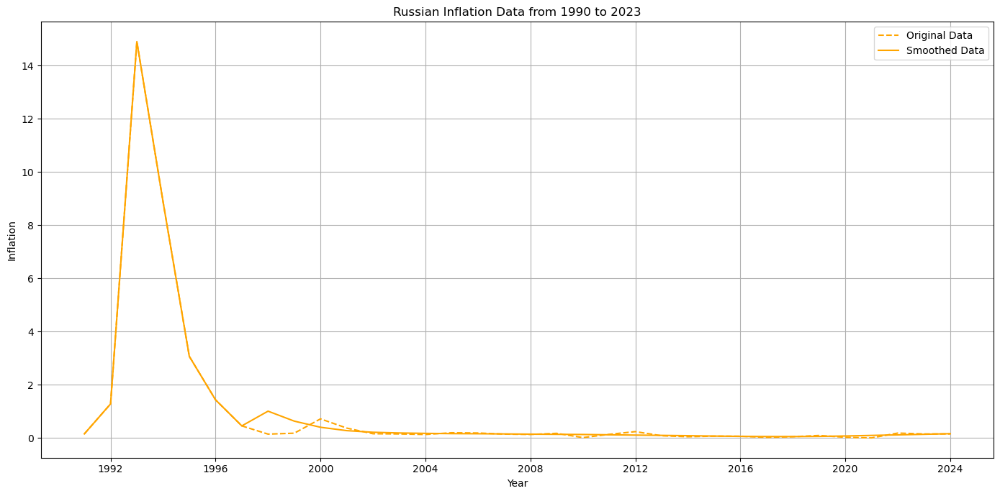

In [137]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'linear')

Построим график инфляции в логарифмической шкале.

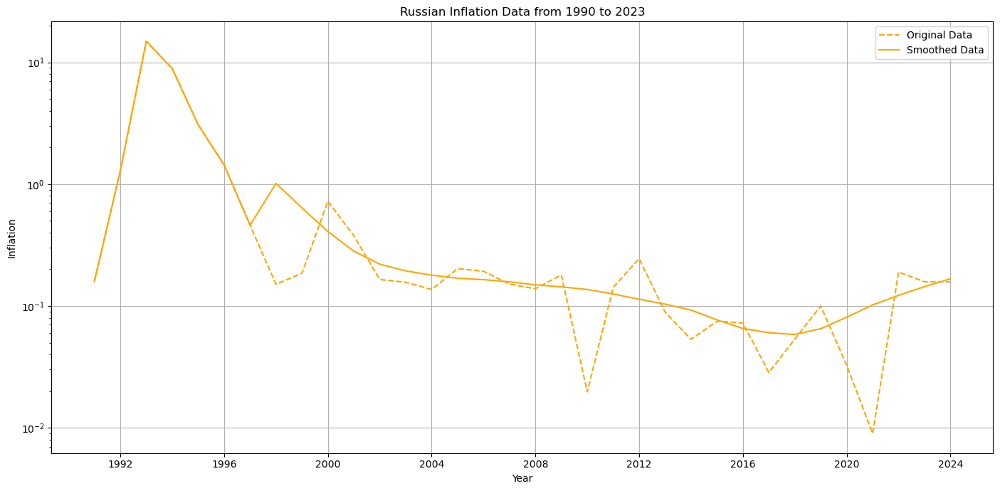

In [138]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'log')

Построим график инфляции с 2002 по 2023 год включительно.

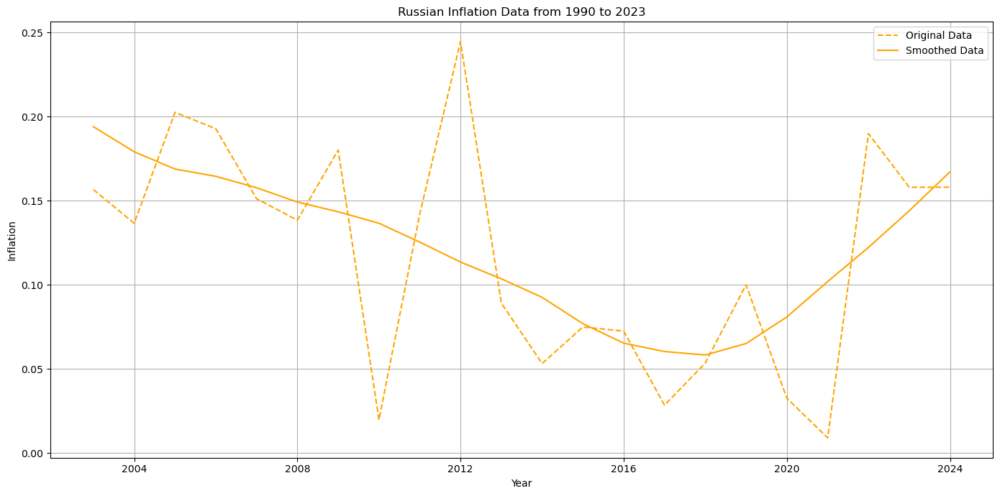

In [139]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'linear', start_date="2002-01-01", end_date="2023-12-31")

Графики доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [140]:
# Plot inflation from 1990 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_1990_2023_linear',
                        start_date="1990-01-01", end_date="2023-12-31", 
                        yscale='linear', title="Russian Inflation Data from 1990 to 2023 (linear scale)")

# Plot inflation from 1990 to 2023 in logarithmic scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_1990_2023_log',
                        start_date="1990-01-01", end_date="2023-12-31", 
                        yscale='log', title="Russian Inflation Data from 1990 to 2023 (logarithmic scale)")

# Plot inflation from 2002 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_2002_2023_linear',
                        start_date="2002-01-01", end_date="2023-12-31", 
                        yscale='linear', title="Russian Inflation Data from 2002 to 2023 (linear scale)")

#### 5.4.2. Расчёт месячной инфляции

Рассчитаем месячные темпы инфляции.

In [141]:
monthly_inflation_rus = syv.calculate_monthly_inflation(annual_inflation_rus_smoothed,
                                                       inflation_column='smoothed_inflation')
monthly_inflation_rus = syv.filter_date_range(monthly_inflation_rus, start_date="2016-01", end_date="2023-09")
monthly_inflation_rus = syv.convert_date_to_month_year(monthly_inflation_rus)
monthly_inflation_rus = monthly_inflation_rus[0]
monthly_inflation_rus = monthly_inflation_rus.reset_index(drop=True)

Рассчитаем индексы инфляции относительно базовой даты 2020-01-01.

In [142]:
monthly_inflation_rus_relative = syv.calculate_relative_inflation(monthly_inflation_rus.copy())

#### 5.4.3. Расчёт реальных цен для каждого региона и месяца

Рассчитаем реальные рублёвые цены сделок и предложений.

In [143]:
# Read data
primary_deals_ts, primary_offers_ts,\
secondary_deals_ts, secondary_offers_ts = syv.sort_dataframe_by_date(primary_deals_ts,\
                                                            primary_offers_ts,\
                                                            secondary_deals_ts,\
                                                            secondary_offers_ts)

# Set the appropriate date format
monthly_inflation_rus_relative['date'] = monthly_inflation_rus_relative['date'].dt.to_timestamp()
primary_deals_ts['date'] = pd.to_datetime(primary_deals_ts['date'])
primary_deals_ts['date'] = primary_deals_ts['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
primary_offers_ts['date'] = primary_offers_ts['date'].dt.to_period('M').dt.to_timestamp()
secondary_deals_ts['date'] = pd.to_datetime(secondary_deals_ts['date'])
secondary_deals_ts['date'] = secondary_deals_ts['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
primary_offers_ts['date'] = primary_offers_ts['date'].dt.to_period('M').dt.to_timestamp()


In [144]:
# Calculate real prices
primary_deals_real, primary_offers_real, secondary_deals_real, secondary_offers_real = \
    syv.calculate_real_prices(monthly_inflation_rus_relative, 
                              'cumulative_inflation',
                              primary_deals_ts,
                              primary_offers_ts,
                              secondary_deals_ts,
                              secondary_offers_ts,
                              value_column='value')


In [145]:
# Round real prices
primary_deals_real['value_real'] = primary_deals_real['value_real'].round(0).astype(int)
primary_offers_real['value_real'] = primary_offers_real['value_real'].round(0).astype(int)
secondary_deals_real['value_real'] = secondary_deals_real['value_real'].round(0).astype(int)
secondary_offers_real['value_real'] = secondary_offers_real['value_real'].round(0).astype(int)


#### 5.4.4. Визуализация реальных цен

Построим графики динамики реальных цен для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

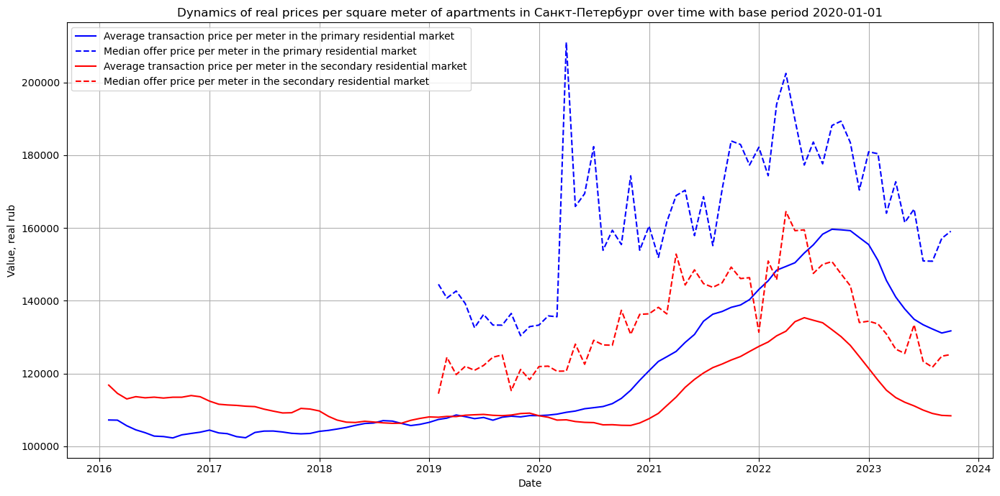

In [146]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Санкт-Петербург')

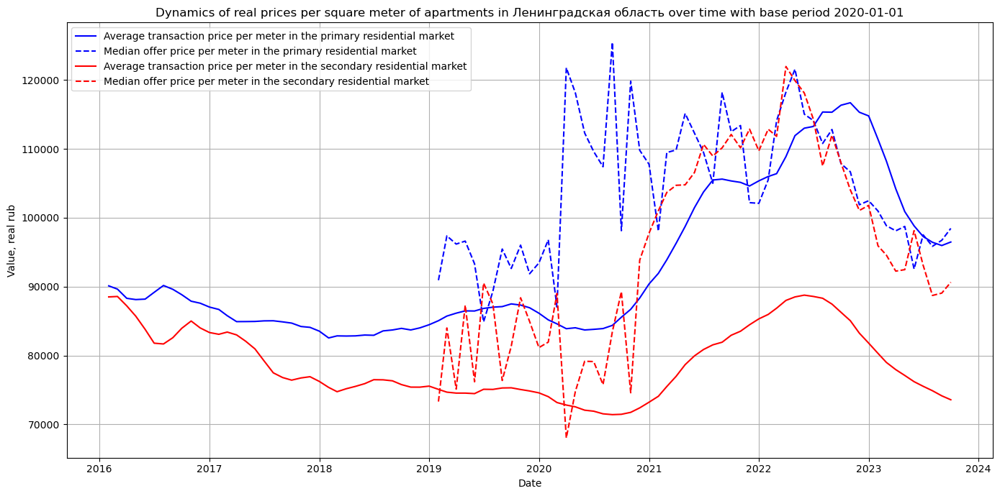

In [147]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Ленинградская область')

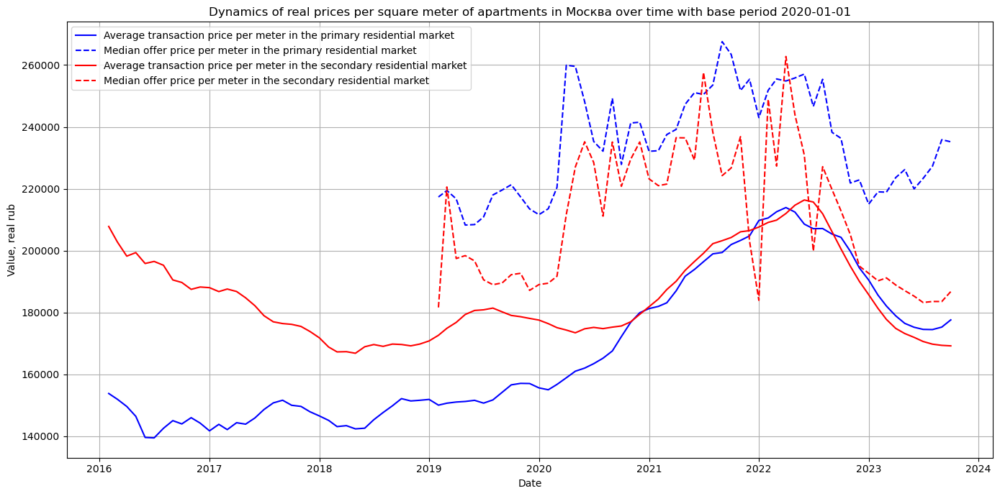

In [148]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Москва')

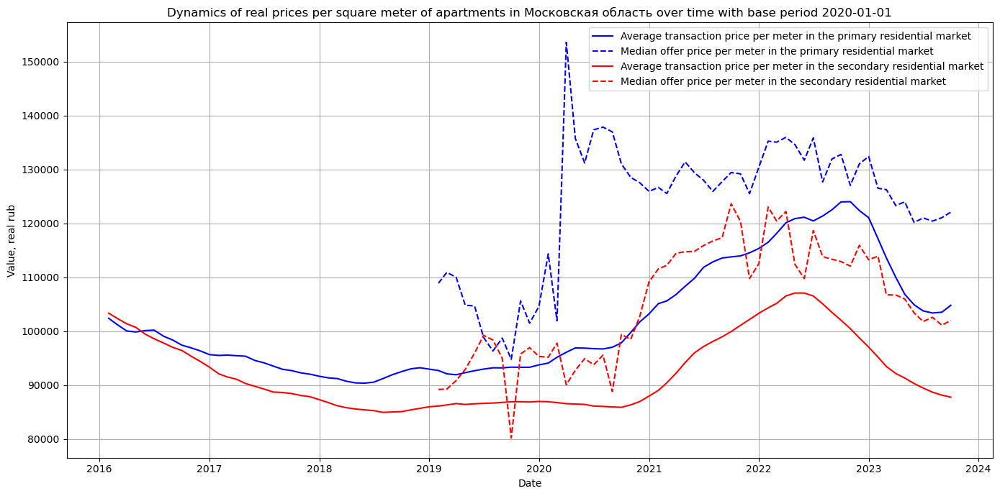

In [149]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Московская область')

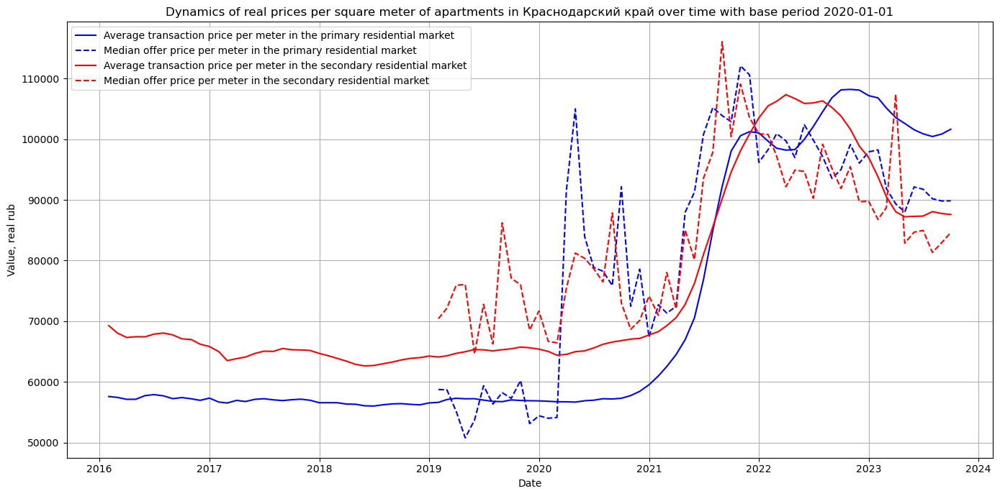

In [150]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Краснодарский край')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [151]:
syv.save_real_prices_plots(primary_deals_real,
                           primary_offers_real,
                           secondary_deals_real,
                           secondary_offers_real)

## 5.5. Анализ номинальных долларовых ценовых индикаторов

В качестве источника данных о курсе доллара США на заданные даты используются [данные](https://www.cbr.ru/currency_base/dynamics/) ЦБ РФ.

### 5.5.1. Подготовка данных

Загрузка данных о курсе рубля относительно долллара. Все курсы приводятся к номиналу, существующему после [денежной реформы 1998 года](https://en.wikipedia.org/wiki/Monetary_reform_in_Russia,_1998). 

In [153]:
usd_rub_rates = syv.get_usd_rub_ex_rate()

Сглаживание данных методом LOWESS.

In [154]:
usd_rub_rates = syv.smooth_exchange_rate(usd_rub_rates)

Визуализация исходных и сглаженных данных динамики курса валютной пары доллар-рубль.

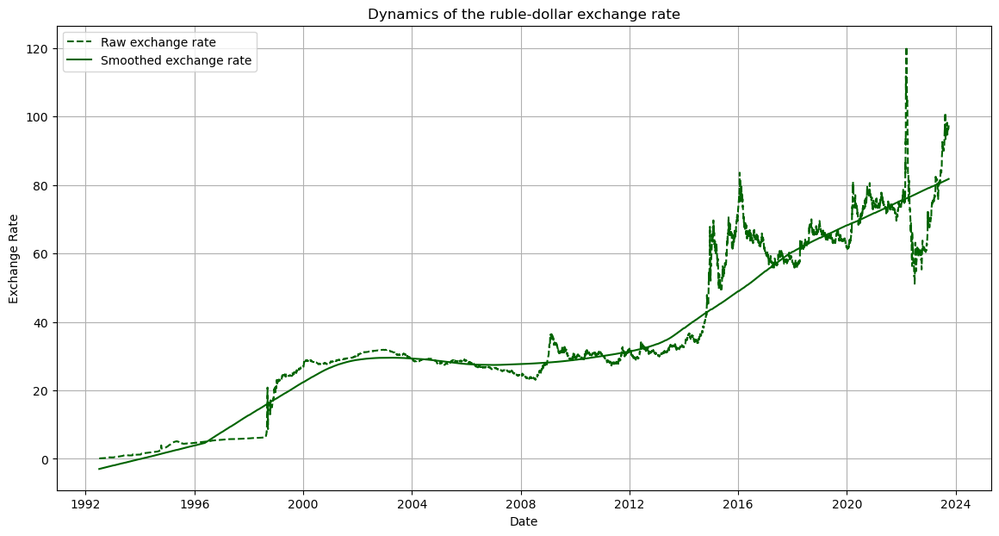

In [155]:
syv.plot_and_save_exchange_rate(usd_rub_rates)


Поскольку данные о ценах представлены помесячно, рассчитаем средние значения курса по месяцам.

In [156]:
monthly_avg_ex_rates = syv.calculate_monthly_avg_ex_rate(usd_rub_rates.copy())
monthly_avg_ex_rates['last_day_of_month'] = monthly_avg_ex_rates['date'].dt.to_timestamp('M') + pd.DateOffset(months=-0, days=-0)
monthly_avg_ex_rates = monthly_avg_ex_rates[['last_day_of_month', 'smoothed_rate']]

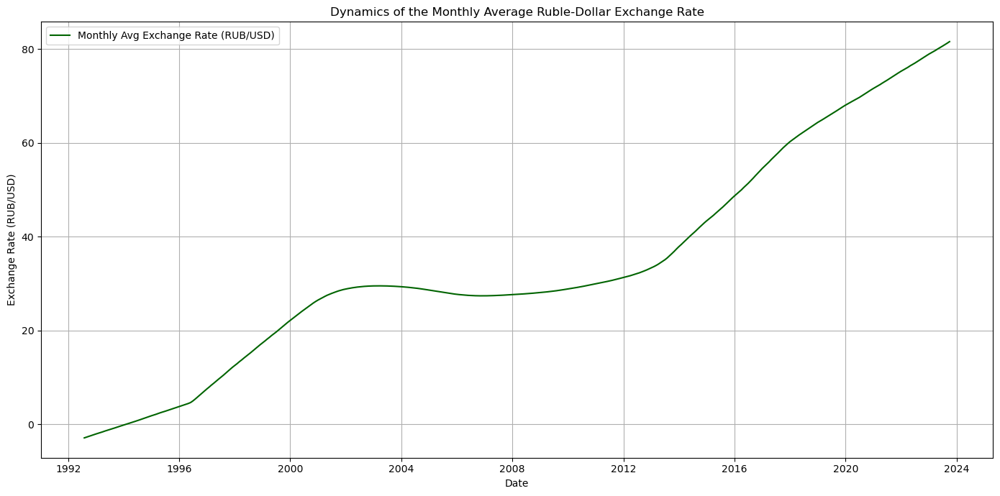

In [157]:
syv.plot_and_save_monthly_avg_exchange_rate(monthly_avg_ex_rates)

Рассчитаем номинальные долларовые цены.

In [158]:
# Convert dates to datetime format
primary_deals_ts['date'] = pd.to_datetime(primary_deals_ts['date'])
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
secondary_deals_ts['date'] = pd.to_datetime(secondary_deals_ts['date'])
secondary_offers_ts['date'] = pd.to_datetime(secondary_offers_ts['date'])


# Calculate prices in dollars
primary_deals_ts_usd = syv.convert_to_usd(primary_deals_ts, monthly_avg_ex_rates, 'value')
primary_offers_ts_usd = syv.convert_to_usd(primary_offers_ts, monthly_avg_ex_rates, 'value')
secondary_deals_ts_usd = syv.convert_to_usd(secondary_deals_ts, monthly_avg_ex_rates, 'value')
secondary_offers_ts_usd = syv.convert_to_usd(secondary_offers_ts, monthly_avg_ex_rates, 'value')

# Round 'value_usd' column to 0 decimal places
primary_deals_ts_usd['value_usd'] = primary_deals_ts_usd['value_usd'].round(0)
primary_offers_ts_usd['value_usd'] = primary_offers_ts_usd['value_usd'].round(0)
secondary_deals_ts_usd['value_usd'] = secondary_deals_ts_usd['value_usd'].round(0)
secondary_offers_ts_usd['value_usd'] = secondary_offers_ts_usd['value_usd'].round(0)

# Convert 'value_usd' column to integer
primary_deals_ts_usd['value_usd'] = primary_deals_ts_usd['value_usd'].astype(int)
primary_offers_ts_usd['value_usd'] = primary_offers_ts_usd['value_usd'].astype(int)
secondary_deals_ts_usd['value_usd'] = secondary_deals_ts_usd['value_usd'].astype(int)
secondary_offers_ts_usd['value_usd'] = secondary_offers_ts_usd['value_usd'].astype(int)

# Sort data frames by date
primary_deals_ts_usd, primary_offers_ts_usd,secondary_deals_ts_usd,\
secondary_offers_ts_usd = syv.sort_dataframe_by_date(primary_deals_ts_usd,\
                                                     primary_offers_ts_usd,\
                                                     secondary_deals_ts_usd,\
                                                     secondary_offers_ts_usd)

### 5.5.2. Визуализация

Построим графики динамики номинальных долларовых цен для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

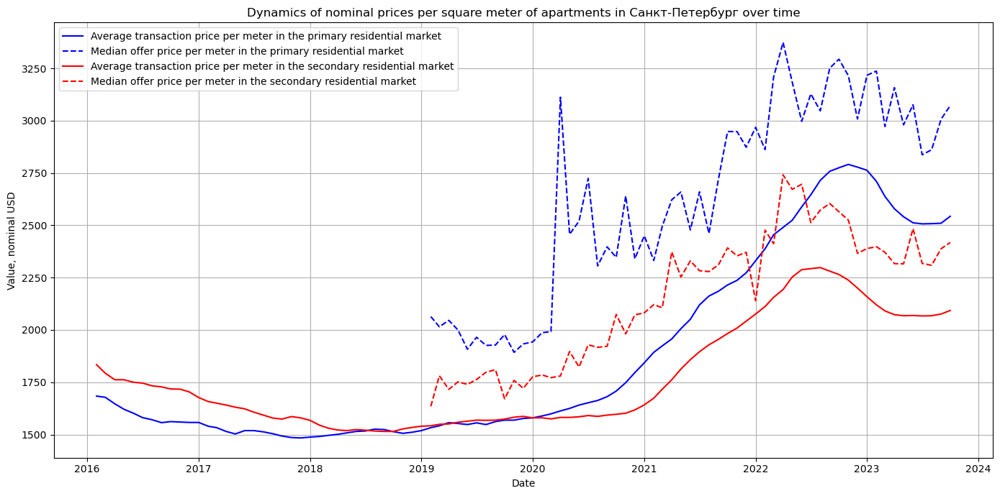

In [159]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Санкт-Петербург')

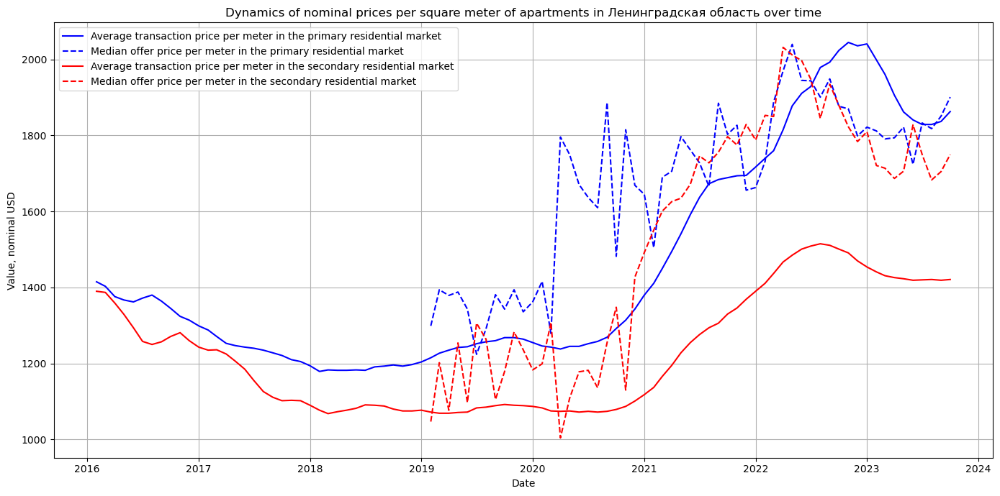

In [160]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Ленинградская область')

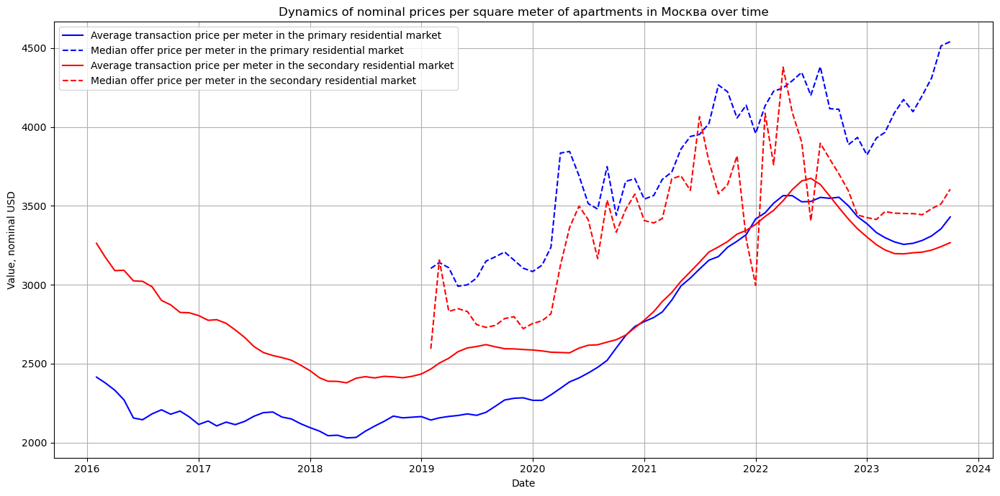

In [161]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Москва')

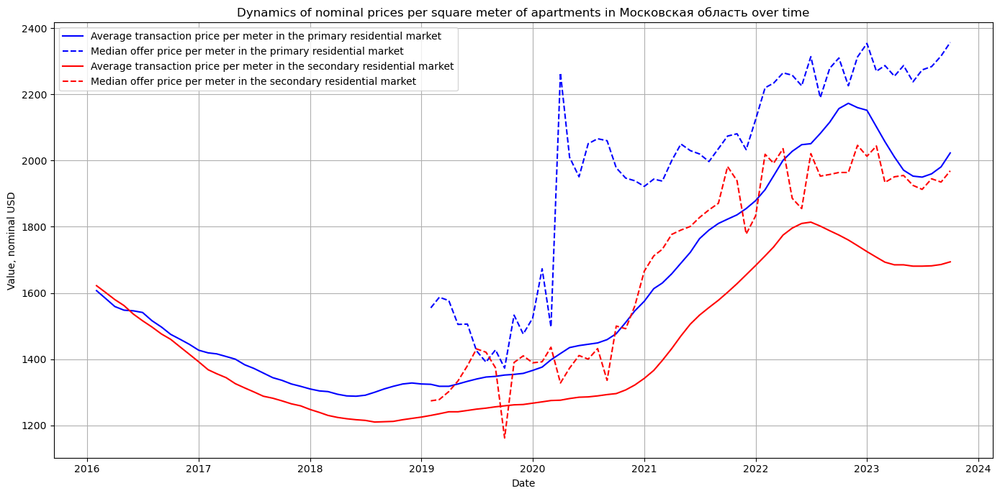

In [162]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Московская область')

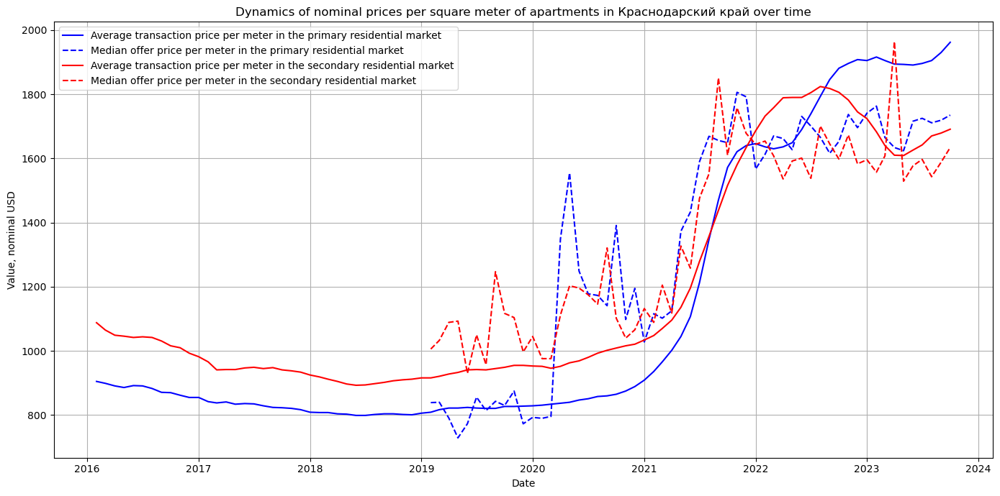

In [163]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Краснодарский край')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [164]:
syv.save_nominal_usd_prices_plots(primary_deals_ts_usd,
                              primary_offers_ts_usd,
                              secondary_deals_ts_usd,
                              secondary_offers_ts_usd)

## 5.6. Анализ реальных долларовых ценовых индикаторов

#### 5.6.1. Обработка данных о годовых темпах инфляции

В качестве источника данных об инфляции в США используются [данные](https://databank.worldbank.org/source/world-development-indicators/Series/NY.GDP.DEFL.KD.ZG#) Всемирного банка.

In [165]:
annual_inflation_usd = syv.read_inflation_data_usa()

Выполним сглаживание данных с помощью метода [LOWESS](https://en.wikipedia.org/wiki/Local_regression).

In [166]:
annual_inflation_usd_smoothed = syv.smooth_lowess(annual_inflation_usd, 'year', 'inflation', frac=0.3)

Построим график инфляции в линейной шкале.

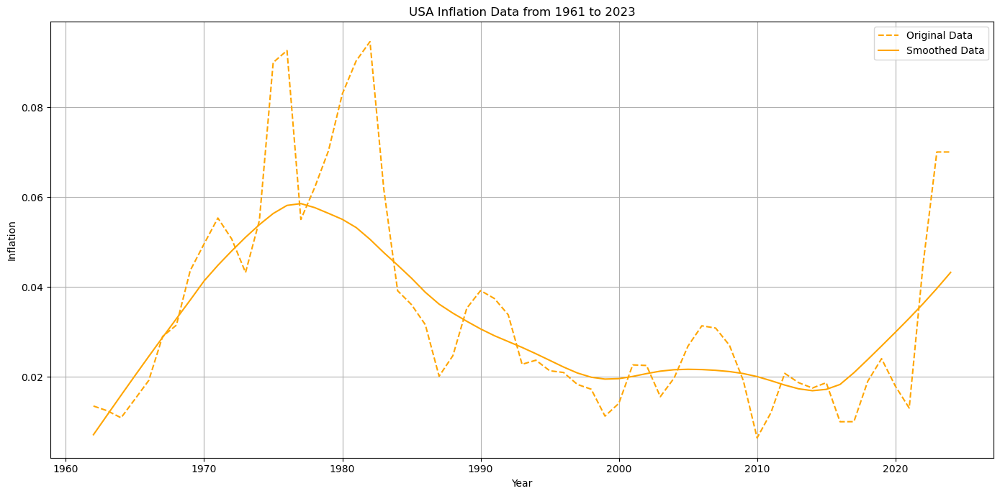

In [167]:
syv.plot_inflation_data(annual_inflation_usd, annual_inflation_usd_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="USA Inflation Data from 1961 to 2023",
                        start_date="1961-01-01",
                        end_date="2023-12-31",
                        yscale = 'linear')

Построим график инфляции с 2002 по 2023 год включительно.

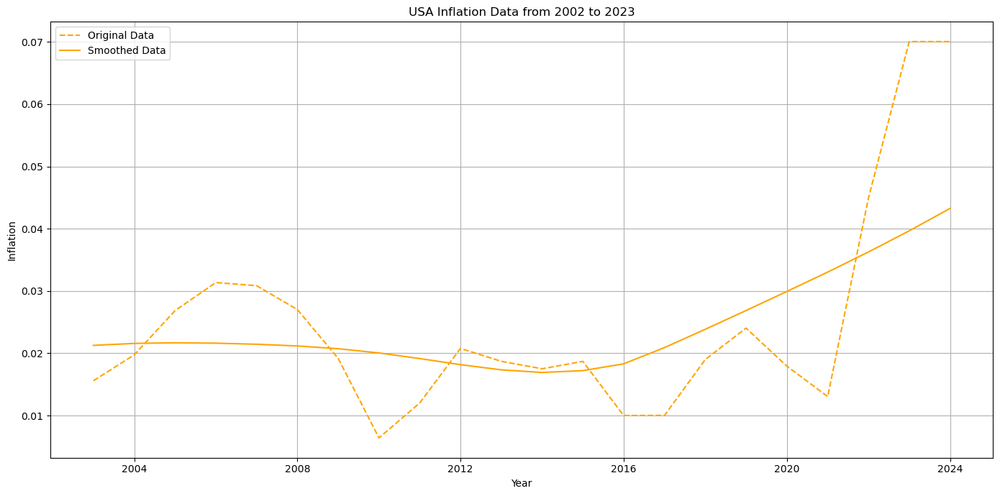

In [168]:
syv.plot_inflation_data(annual_inflation_usd, annual_inflation_usd_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="USA Inflation Data from 2002 to 2023",
                        start_date="2002-01-01",
                        end_date="2023-12-31",
                        yscale = 'linear')

Графики доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [169]:
# Plot inflation from 1961 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_usd, annual_inflation_usd_smoothed,
                        file_name='usa_annual_inflation_1961_2023_linear',
                        start_date="1961-01-01", end_date="2023-12-31", 
                        yscale='linear', title="U.S. inflation data from 1990 to 2023 (linear scale)")

# Plot inflation from 2002 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_usd, annual_inflation_usd_smoothed,
                        file_name='usa_annual_inflation_2002_2023_linear',
                        start_date="2002-01-01", end_date="2023-12-31", 
                        yscale='linear', title="U.S. inflation data from 2002 to 2023 (linear scale)")

#### 5.6.2. Расчёт месячной инфляции

Рассчитаем месячные темпы инфляции.

In [170]:
monthly_inflation_usd = syv.calculate_monthly_inflation(annual_inflation_usd_smoothed,
                                                       inflation_column='smoothed_inflation')
monthly_inflation_usd = syv.filter_date_range(monthly_inflation_usd, start_date="2016-01", end_date="2023-09")
monthly_inflation_usd = syv.convert_date_to_month_year(monthly_inflation_usd)
monthly_inflation_usd = monthly_inflation_usd[0]
monthly_inflation_usd = monthly_inflation_usd.reset_index(drop=True)

Рассчитаем индексы инфляции относительно базовой даты 2020-01-01.

In [171]:
monthly_inflation_usd_relative = syv.calculate_relative_inflation(monthly_inflation_usd.copy())

#### 5.6.3. Расчёт реальных цен для каждого региона и месяца

Рассчитаем реальные рублёвые цены сделок и предложений.

In [172]:
# Read data
primary_deals_ts_usd, primary_offers_ts_usd,\
secondary_deals_ts_usd, secondary_offers_ts_usd = syv.sort_dataframe_by_date(primary_deals_ts_usd,\
                                                            primary_offers_ts_usd,\
                                                            secondary_deals_ts_usd,\
                                                            secondary_offers_ts_usd)

# Set the appropriate date format
monthly_inflation_usd_relative['date'] = monthly_inflation_usd_relative['date'].dt.to_timestamp()
primary_deals_ts_usd['date'] = pd.to_datetime(primary_deals_ts_usd['date'])
primary_deals_ts_usd['date'] = primary_deals_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts_usd['date'] = pd.to_datetime(primary_offers_ts_usd['date'])
primary_offers_ts_usd['date'] = primary_offers_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
secondary_deals_ts_usd['date'] = pd.to_datetime(secondary_deals_ts_usd['date'])
secondary_deals_ts_usd['date'] = secondary_deals_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts_usd['date'] = pd.to_datetime(primary_offers_ts_usd['date'])
primary_offers_ts_usd['date'] = primary_offers_ts_usd['date'].dt.to_period('M').dt.to_timestamp()

In [173]:
# Calculate real prices
primary_deals_real_usd, primary_offers_real_usd,\
secondary_deals_real_usd, secondary_offers_real_usd = \
    syv.calculate_real_prices(monthly_inflation_usd_relative, 
                              'cumulative_inflation',
                              primary_deals_ts_usd,
                              primary_offers_ts_usd,
                              secondary_deals_ts_usd,
                              secondary_offers_ts_usd,
                              value_column='value_usd')

In [174]:
# Round real prices
primary_deals_real_usd['value_usd_real'] = primary_deals_real_usd['value_usd_real'].round(0).astype(int)
primary_offers_real_usd['value_usd_real'] = primary_offers_real_usd['value_usd_real'].round(0).astype(int)
secondary_deals_real_usd['value_usd_real'] = secondary_deals_real_usd['value_usd_real'].round(0).astype(int)
secondary_offers_real_usd['value_usd_real'] = secondary_offers_real_usd['value_usd_real'].round(0).astype(int)

#### 5.6.4. Визуализация реальных долларовых цен

Построим графики динамики реальных цен для пяти ключевых регионов: Санкт-Петербург, Ленинградская область, Москва, Московская область, Краснодарский край.

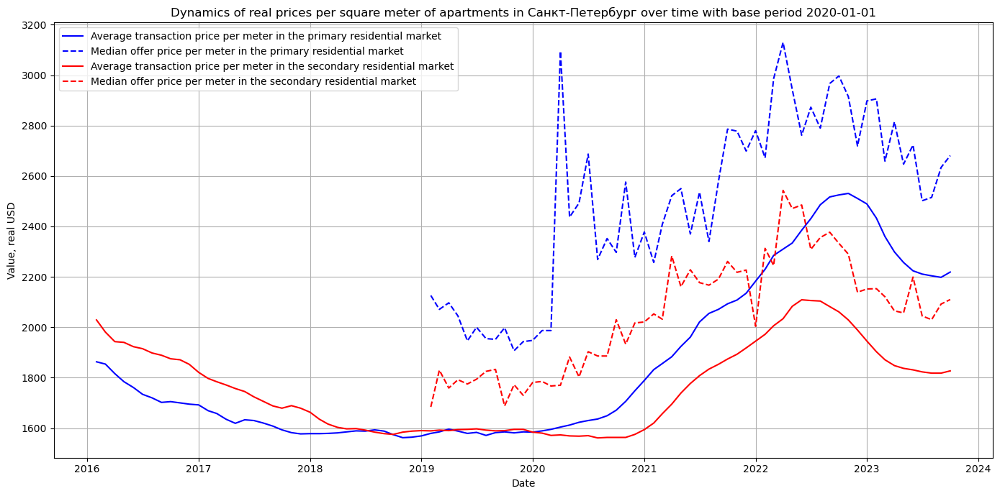

In [175]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Санкт-Петербург')

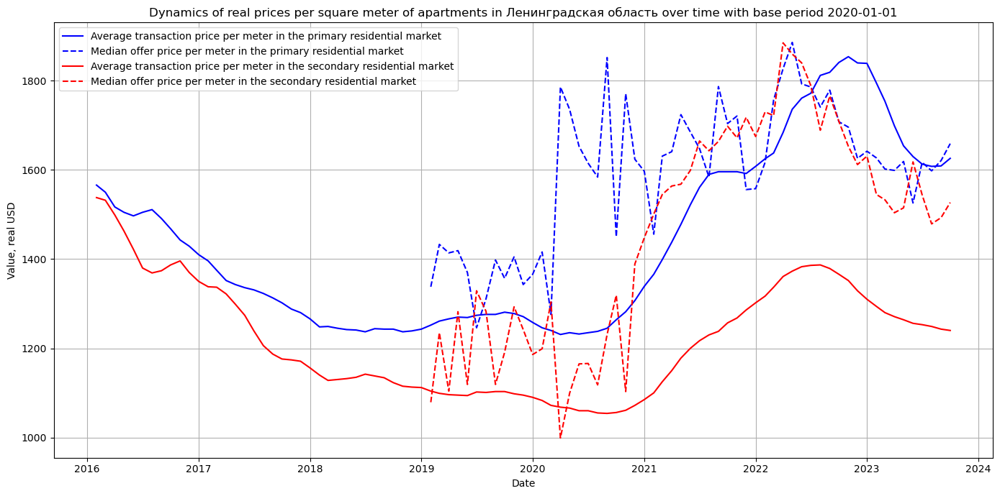

In [176]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Ленинградская область')

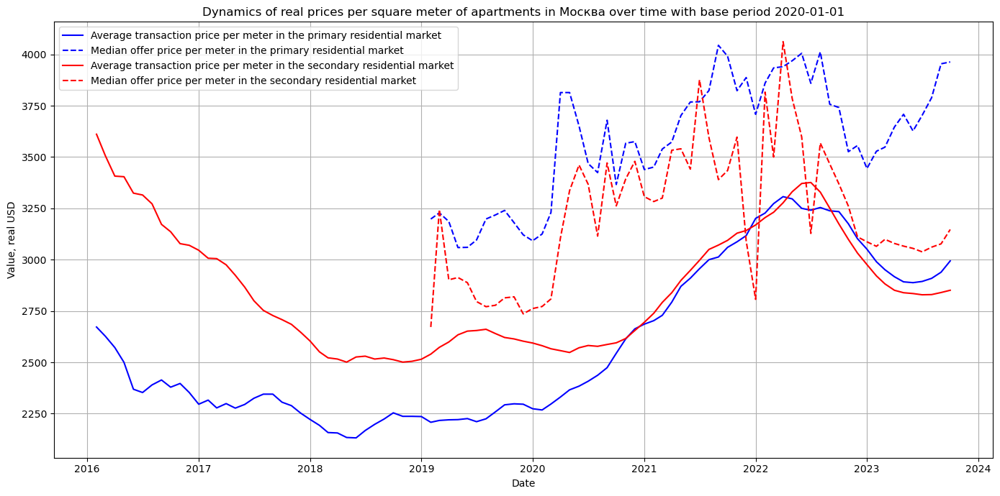

In [177]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Москва')

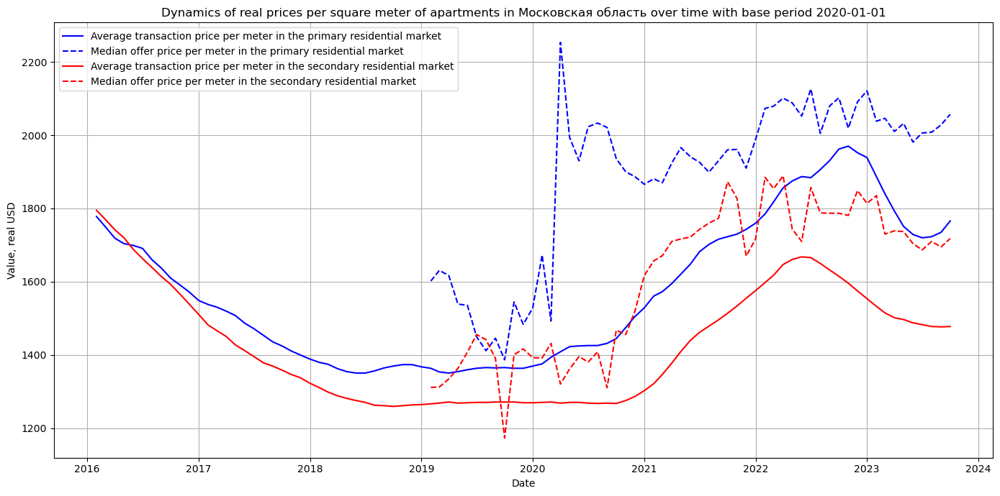

In [178]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Московская область')

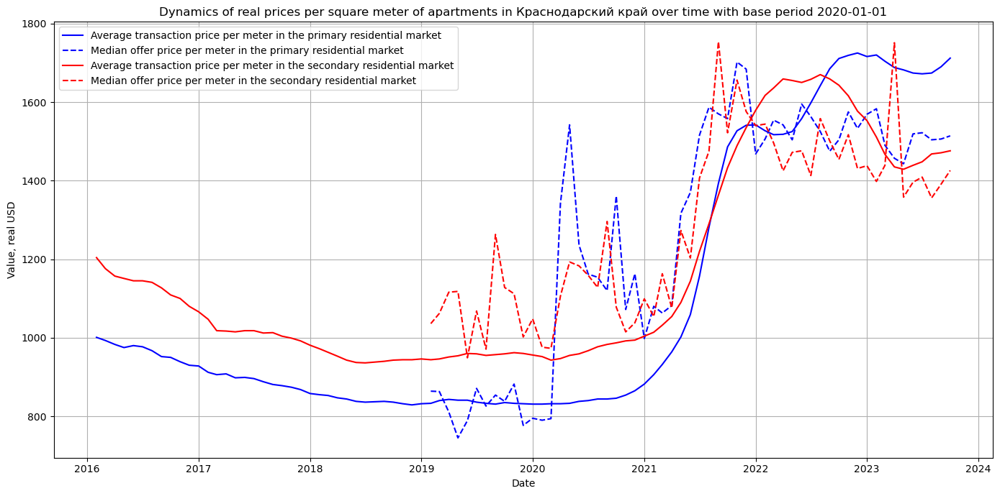

In [179]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Краснодарский край')

Графики для всех регионов доступны по [ссылке](https://drive.google.com/drive/folders/1a4Dtq4SqnMK-l3tvplbQ4QAu0WH-VM2T?usp=drive_link).

In [180]:
syv.save_real_usd_prices_plots(primary_deals_real_usd,
                           primary_offers_real_usd,
                           secondary_deals_real_usd,
                           secondary_offers_real_usd)